# Applying ML in HETDEX Spring Field to derive z

We want to analyze radio data from several AGNs from the HETDEX Spring Field.
In particular, using the `LoTSS` survey DR1.

In this way, we select sources with observations in radio frequencies.

Previously, we have selected features which can add the most information  
to the analysis. Now, we want to find ways to mixture the features to obtain  
possible correlations among our data.


In this notebook, we want to create a model to predict redshift values  
for sources labelled as AGN.  
We will use data from several catalogues (in various wavelengths) which  
might have empty entries.

---

## Python setup

First, we import the packages to be used

In [1]:
%matplotlib inline
# Static plots
#%matplotlib ipympl
# Interactive plots
import copy
import numpy as np
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as mpe
from matplotlib.ticker import FuncFormatter
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import mpl_scatter_density
# from matplotlib.ticker import FormatStrFormatter
# from matplotlib.patches import Polygon
# from astropy.wcs import WCS
from astropy.table import Table, join
from astropy import units as u
from astropy.visualization import hist
from astropy.coordinates import SkyCoord
from astropy.cosmology import FlatLambdaCDM
from astropy.cosmology import Planck18
from astropy.visualization import LogStretch, PowerStretch
from astropy.visualization.mpl_normalize import ImageNormalize
# from scipy.cluster import hierarchy as hc
# from scipy.spatial import distance
# from scipy.optimize import curve_fit
from scipy.stats import beta, ks_2samp, epps_singleton_2samp, anderson_ksamp
# from sklearn.impute import SimpleImputer
# from sklearn.cluster import AgglomerativeClustering
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import plot_confusion_matrix, classification_report
import sklearn.metrics as skmet
import lightgbm as lgb
import xgboost as xgb
import ppscore as pps
import progressbar
from pycaret import regression as pyr
from datetime import date
import seaborn as sns
import cmasher as cmr
import colorcet as cc
import getpass
# import pacmap
import shap
import pandas as pd
import smogn
import pickle
import re
# import missingno as msno
import itertools

/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
mpl.rcdefaults()

In [3]:
plt.rcParams['text.usetex'] = True

Define the spectral index $\alpha$ from different sources  
to be used in the luminosity calculations (K-correction)

In [4]:
alpha_first = 0.5  # From FIRST data (Bornancini+2010)
alpha_RG    = 1.0  # For radio galaxies (Verkhodanov & Khabibullina, 2010)
alpha_alex  = 0.8  # Star-forming galaxies (Alexander+2003)
alpha_smol  = 0.7  # Mean value from VLA-COSMOS 3GHz sample (Smolčić et al. 2017)
alpha_butl  = 0.75  # From Butler et al., 2018

Choose one of the spectral indexes

In [5]:
alpha_used  = alpha_butl

In [6]:
gamma_alex  = 2.0  # From Alexander+2003 (photon index for X-Rays)

In [7]:
gamma_used  = gamma_alex

We define the cosmological properties to calculate luminosity distances and other quantities.

In [8]:
# cosmo       = FlatLambdaCDM(H0=70, Om0=0.3)
cosmo       = Planck18

We get the date for file naming.

In [9]:
today       = date.today()

In [10]:
def lum_from_flux_radio(flux, redshift):  # Flux in mJy
    lum_distance = cosmo.luminosity_distance(redshift.values).to(u.m).value  # in m
    luminosity   = 4 * np.pi * lum_distance**2 * flux * 1e-3  * 1e-26 * (1 + redshift)**(alpha_used - 1)  # in W/Hz
    return luminosity

In [11]:
def lum_from_flux_radio_alpha(flux, redshift, alpha):  # Flux in mJy
    lum_distance = cosmo.luminosity_distance(redshift).to(u.m).value  # in m
    alpha_       = np.copy(alpha)
    alpha_[~np.isfinite(alpha_)] = alpha_used
    luminosity   = 4 * np.pi * lum_distance**2 * flux * 1e-3  * 1e-26 * (1 + redshift)**(alpha_ - 1)  # in W/Hz
    return luminosity

In [12]:
def lum_from_flux(flux, redshift):  # Flux in mJy, general version, without K-correction
    lum_distance = cosmo.luminosity_distance(redshift).to(u.m).value  # in m
    luminosity   = 4 * np.pi * lum_distance**2 * flux * 1e-3  * 1e-26  # in W/Hz
    return luminosity

In [13]:
def lum_from_flux_xray(flux, redshift):  # Flux in mJy
    lum_distance = cosmo.luminosity_distance(redshift).to(u.m).value  # in m
    luminosity   = 4 * np.pi * lum_distance**2 * flux * 1e-3  * 1e-26 * (1 + redshift)**(gamma_used - 2)  # in W/Hz
    return luminosity

In [14]:
def lum_from_flux_erg_s(flux, redshift):  # Flux in erg s-1 cm-2, general version, without K-correction. Lum in erg/s
    lum_distance = cosmo.luminosity_distance(redshift).to(u.cm).value  # in cm
    # luminosity   = 4 * np.pi * lum_distance**2 * flux  # in erg/s
    luminosity   = 4 * np.pi * lum_distance**2 * flux * (1 + redshift)**3  # in erg/s -- Test line with redshift correction
    return luminosity

Create class to normalize asymmetric colorscales  
(from [http://chris35wills.github.io/matplotlib_diverging_colorbar/](http://chris35wills.github.io/matplotlib_diverging_colorbar/)).

In [15]:
class MidpointNormalize(mcolors.Normalize):
    """
    Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

    e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
    """
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        mcolors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

For future plots, we can configure their aspect too.

In [16]:
cmap           = cm.get_cmap('inferno')
cmap_alt       = cm.get_cmap('Dark2')
cmap_alt_2     = cm.get_cmap('Greys_r')  # Shades of grey
cmap_alt_3     = cm.get_cmap('coolwarm')  # blue to red
dark_color     = cmap(0.4)  # RGBA color code
light_color    = cmap(0.6)  # RGBA color code
colors         = [cmap(0.15), cmap(0.30), cmap(0.45), cmap(0.60), cmap(0.75), cmap(0.90)]
colors_3       = [cmap(0.25), cmap(0.50), cmap(0.75)]
colors_3_alt   = [cmap_alt(0.25), cmap_alt(0.50), cmap_alt(0.75)]
colors_3_alt_2 = [cmap_alt_2(0.25), cmap_alt_2(0.50), cmap_alt_2(0.75)]
colors_8       = [cmap(0.12), cmap(0.24), cmap(0.35), cmap(0.48), cmap(0.6), cmap(0.72), cmap(0.84), cmap(0.96)]
colors_8_alt   = [cmap_alt(0.12), cmap_alt(0.24), cmap_alt(0.35), cmap_alt(0.48), cmap_alt(0.6), cmap_alt(0.72),\
                  cmap_alt(0.84), cmap_alt(0.96)]
colors_8_alt_2 = [cmap_alt_2(0.06), cmap_alt_2(0.18), cmap_alt_2(0.29), cmap_alt_2(0.42), cmap_alt_2(0.54),\
                  cmap_alt_2(0.66), cmap_alt_2(0.78), cmap_alt_2(0.90)]
colors_8_alt_3 = [cmap_alt_3(0.06), cmap_alt_3(0.18), cmap_alt_3(0.29), cmap_alt_3(0.42), cmap_alt_3(0.54),\
                  cmap_alt_3(0.66), cmap_alt_3(0.78), cmap_alt_3(0.90)]

In [17]:
pe1            = [mpe.Stroke(linewidth=5.0, foreground='black'),
                  mpe.Stroke(foreground='white', alpha=1),
                  mpe.Normal()]
pe2            = [mpe.Stroke(linewidth=3.0, foreground='white'),
                  mpe.Stroke(foreground='white', alpha=1),
                  mpe.Normal()]

alp_str        = r'$\alpha$'

Methdods for PyCaret and saved models.

In [18]:
def get_final_column_names(pycaret_pipeline, sample_df):
    for (name, method) in pycaret_pipeline.named_steps.items():
        if method != 'passthrough' and name != 'trained_model':
            print(f'Running {name}')
            sample_df = method.transform(sample_df)
    return sample_df.columns.tolist()

In [19]:
def get_feature_importances_df(pycaret_pipeline, sample_df, n = 10):
    
    final_cols = get_final_column_names(pycaret_pipeline, sample_df)
    
    try:
        variables = pycaret_pipeline["trained_model"].feature_importances_
        
    except:
        variables = np.mean([
                        tree.feature_importances_ for tree in pycaret_pipeline["trained_model"].estimators_
            if hasattr(tree, 'feature_importances_')
                        ], axis=0)
    
    coef_df = pd.DataFrame({'Feature': final_cols, 'Importance': variables})
    sorted_df = (
        coef_df.sort_values(by='Importance', ascending=False)
        .head(n)
        .sort_values(by='Importance', ascending=True).reset_index(drop=True)
    )
    return sorted_df

Define specific metric for redshift values:  

$$
\mathrm{metric} = \mathrm{median}\left(\frac{|(z_{True} - z_{Predict})|}{(1 + z_{True})}\right)
$$

In [20]:
def z_score_abs(y, y_pred, **kwargs):
    num = np.abs(y - y_pred)
    den = 1 + y
    # return np.nanmean(num / den)
    return np.nanmedian(num / den)

Define specific metric for log of redshift values:  
$$
y = \log_{10}{(1 + z)}
$$

$$
\mathrm{metric} = \mathrm{median}\left(\frac{|(10^{y_{True}} - 10^{y_{Predict}})|}{(10^{z_{True}})}\right)
$$

In [21]:
def log_z_score_abs(y, y_pred, **kwargs):
    num = np.abs(10**y - 10**y_pred)
    den = 10**y
    # return np.nanmean(num / den)
    return np.nanmedian(num / den)

In [22]:
def sigma_mad(z_true, z_pred):
    med = np.median(np.abs(z_true - z_pred))
    return 1.48 * med

In [305]:
def sigma_nmad(z_true, z_pred):
    try:
        dif  = np.float32(z_true - z_pred)
        frac = dif / (1 + z_true)
        med  = np.median(np.abs(frac))
    except:
        dif  = (z_true - z_pred)
        frac = dif / (1 + z_true)
        med  = np.median(np.abs(frac))
    return 1.48 * med

In [24]:
def sigma_z(z_true, z_pred):
    dif = z_true - z_pred
    ssq = np.sum(dif**2)
    rot = np.sqrt(ssq / len(z_true))
    return rot

In [25]:
def sigma_z_norm(z_true, z_pred):
    dif = (z_true - z_pred) / (1 + z_true)
    ssq = np.sum(dif**2)
    rot = np.sqrt(ssq / len(z_true))
    return rot

In [26]:
def outlier_frac(z_true, z_pred):
    dif  = np.abs((z_true - z_pred) / (1 + z_true))
    siz  = np.sum(np.isfinite(dif))
    num  = np.sum(np.array(dif > 0.15))
    frac = num / siz
    return frac

---

## Reading data

In [27]:
machine  = getpass.getuser()
# cat_path = '/home/' + machine + '/Documentos/Data/'
cat_path = '../Catalogs/'  # relative path to the same directory
# cat_path = '../clean_catalogs/'  # relative path to the same directory

We import our data using the `pandas` package.  
  

Uncertainties have not been included up to this point.

In [28]:
# file_name = 'SDSSQ_DR16_ALLWISE_LoTSS_area_LOFAR_FIRST_VLASS_PS1_Rakshit_2020.fits'  # 28960 objects
# file_name = 'DR16Qv4_LoTSSDR1_ALLWISE_PS1DR1_GALEXGR67_FIRST2014_XMMDR9_2MASS.fits'  # 65928 objects
# file_name = 'CatWISE2020_VLASS_LOFAR_PS1_GALEX_TGSS_XMM_2MASS_MILLIQUAS_ALLWISE_QSO_Z.fits'  # 31279 objects
file_name = 'CatWISE2020_LoTSS_area_large_LoTSS_PS1_ALLWISE_2MASS' + \
            '_MQC_74D_SDSS_DR16_VLASS_TGSS_GALEX_4XMM_DR9_5arcsec_AGN.fits'  # 57861 objects

First, open the file as astropy Table to modify (and standardise)  
the units of fluxes and/or magnitudes.

In [29]:
#large_catalog_full_tab = pd.read_parquet(cat_path + file_name, engine='fastparquet', columns=used_cols)
# large_catalog_full_tab = pd.read_parquet(cat_path + file_name, engine='fastparquet')

In [30]:
large_catalog_full_tab = Table.read(cat_path + file_name, format='fits')
#large_catalog_full_tab['SDSS_NAME'] = large_catalog_full_tab['SDSS_NAME'].data.astype(str)

In [31]:
len(large_catalog_full_tab)

57861

Select sources with positive redshift value

In [32]:
filter_redshift = np.array(large_catalog_full_tab['Z'] > 0) & np.isfinite(large_catalog_full_tab['Z'])
large_catalog_full_tab = large_catalog_full_tab[filter_redshift]

In [33]:
len(large_catalog_full_tab)

56162

In [34]:
zero_point_star_equiv  = u.zero_point_flux(3631.1 * u.Jy)  # zero point (AB) to Jansky

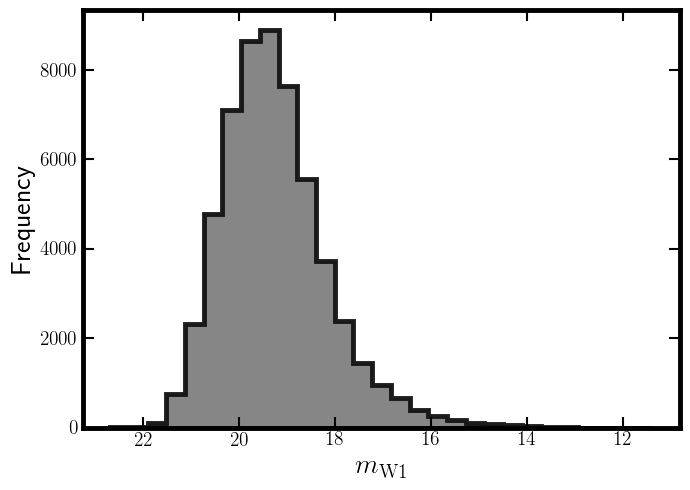

In [35]:
fig             = plt.figure(figsize=(7,5))
ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')


# binss = np.logspace(np.nanmin(np.log10(large_catalog_full_tab['NUVmag'])), np.nanmax(np.log10(large_catalog_full_tab['NUVmag'])), 30)
binss = np.linspace(np.nanmin(large_catalog_full_tab['W1mproPM']), np.nanmax(large_catalog_full_tab['W1mproPM']), 30)
ax1.hist(large_catalog_full_tab['W1mproPM'], bins=binss, fc='Gray', ec='k', histtype='stepfilled', alpha=0.95, lw=3.5);

ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.set_xlabel('$m_{\mathrm{W1}}$', size=20)
ax1.set_ylabel('Frequency', size=20)
plt.setp(ax1.spines.values(), linewidth=3.5)
plt.setp(ax1.spines.values(), linewidth=3.5)
ax1.invert_xaxis()
#ax1.set_xlim(left=0.2, right=2.4)
#ax1.set_aspect('equal', 'box')
fig.tight_layout()

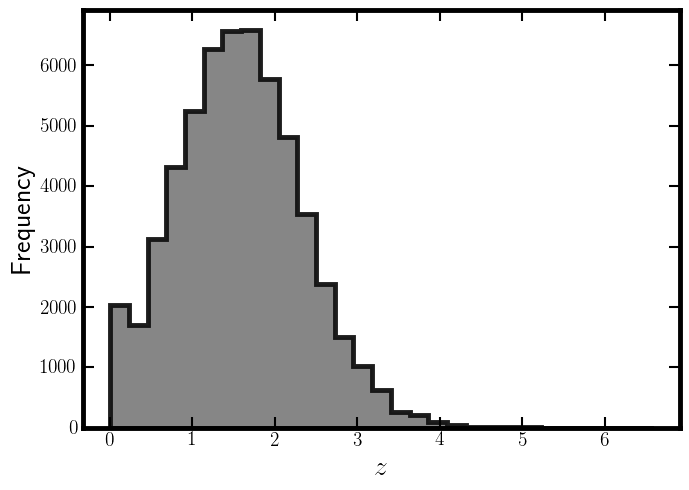

In [36]:
fig             = plt.figure(figsize=(7,5))
ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')


binss = np.linspace(np.nanmin(large_catalog_full_tab['Z']), np.nanmax(large_catalog_full_tab['Z']), 30)
ax1.hist(large_catalog_full_tab['Z'], bins=binss, fc='Gray', ec='k', histtype='stepfilled', alpha=0.95, lw=3.5);

ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.set_xlabel('$z$', size=20)
ax1.set_ylabel('Frequency', size=20)
plt.setp(ax1.spines.values(), linewidth=3.5)
plt.setp(ax1.spines.values(), linewidth=3.5)
# ax1.invert_xaxis()
#ax1.set_xlim(left=0.2, right=2.4)
#ax1.set_aspect('equal', 'box')
fig.tight_layout()

Mask invalid entries in X-ray fluxes.

In [37]:
xray_freqs = {'2RXS_SRC_FLUX' :  3.02e+17 * u.Hz, '2RXS_SRC_FLUX_ERR' : 3.02e+17 * u.Hz,
              'XMM_SOFT_FLUX' :  6.05e+17 * u.Hz, 'XMM_SOFT_FLUX_ERR' : 6.05e+17 * u.Hz,
              'XMM_HARD_FLUX' :  1.45e+18 * u.Hz, 'XMM_HARD_FLUX_ERR' : 1.45e+18 * u.Hz,
              'XMM_TOTAL_FLUX':  1.51e+18 * u.Hz, 'XMM_TOTAL_FLUX_ERR': 1.51e+18 * u.Hz,
              'FEP_XMM'       :  1.51e+18 * u.Hz}
xray_cols   = ['FEP_XMM']
for col in xray_cols:
    # filter_flx = np.array(large_catalog_full_tab[col] <= 0.0) | np.isinf(large_catalog_full_tab[col])
    # large_catalog_full_tab[col][filter_flx] = np.nan
    large_catalog_full_tab[col] = large_catalog_full_tab[col] / xray_freqs[col]
    # large_catalog_full_tab[col].unit /= u.Hz
    large_catalog_full_tab[col].unit = u.mW * u.m**-2 * u.Hz**-1
    large_catalog_full_tab[col] = large_catalog_full_tab[col].to(u.mJy)
    
    large_catalog_full_tab[col] = large_catalog_full_tab[col].to(u.mag(u.AB))

Convert fluxes into magnitudes:

In [38]:
flx_cols = ['Ftot_VLASS', 'Sint_LOFAR', 'Stotal_TGSS', 'FEP_XMM']

for col in flx_cols:
    #large_catalog_full_tab[col] = large_catalog_full_tab[col].to(u.mag(u.AB))
    large_catalog_full_tab[col].unit = u.mag(u.AB)

Many magnitudes in this catalogue are in the Vega system.  
We will transform them into the AB system.

For Vega WISE magnitudes, we have the following conversion to AB values.

Conversion to the AB system (from [WISE documentation](https://wise2.ipac.caltech.edu/docs/release/allsky/expsup/sec4_4h.html),  
and [Jarrett et al., 2017](https://ui.adsabs.harvard.edu/abs/2017ApJ...836..182J/abstract))

($m_{\mathrm{AB}} = m_{\mathrm{Vega}} + \Delta (m)$)

|Band | magnitude offset (Δm)|
|-----|---------------------:|
|W1   |                 2.699|
|W2   |                 3.339|
|W3   |                 5.174|
|W4   |                 6.620|

In the case of Gaia, we can use the information from their [documentation](https://gea.esac.esa.int/archive/documentation/GDR2/Data_processing/chap_cu5pho/sec_cu5pho_calibr/ssec_cu5pho_calibr_extern.html).

|Band | magnitude offset (Δm)|
|-----|---------------------:|
|G    |                0.1050|
|BP   |                0.0292|
|BR   |                0.3542|

With UKIDSS, we can use the information from [Hewett et al., 2006](https://ui.adsabs.harvard.edu/abs/2006MNRAS.367..454H/abstract)

|Band | magnitude offset (Δm)|
|-----|---------------------:|
|J    |                 0.938|
|H    |                 1.379|
|K    |                 1.900|

With 2MASS, we can use the information from [online documentation](http://www.astronomy.ohio-state.edu/~martini/usefuldata.html)

|Band | magnitude offset (Δm)|
|-----|---------------------:|
|J    |                 0.910|
|H    |                 1.390|
|Ks   |                 1.850|

Convert `Vega` magnitudes to `AB`.

In [39]:
all_vega_cols = ['W1mproPM', 'W2mproPM', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'Jmag', 'Hmag', 'Kmag',\
                 'e_W1mproPM', 'e_W2mproPM', 'e_W1mag', 'e_W2mag', 'e_W3mag', 'e_W4mag', 'e_Jmag',\
                 'e_Hmag', 'e_Kmag']
vega_cols     = ['W1mproPM', 'W2mproPM', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'Jmag', 'Hmag', 'Kmag']
vega_shift    = {'W1mproPM': 2.699, 'W2mproPM': 3.339, 'W1mag': 2.699, 'W2mag': 3.339, 'W3mag': 5.174,\
                 'W4mag': 6.620, 'Jmag': 0.910, 'Hmag': 1.390, 'Kmag': 1.850}

# for col in all_vega_cols:
#     filter_mag = np.array(large_catalog_full_tab[col] == -9999.0) | np.array(large_catalog_full_tab[col] == -999.0) |\
#                          np.array(large_catalog_full_tab[col] == -1.0) | np.isinf(large_catalog_full_tab[col])
#     large_catalog_full_tab[col][filter_mag] = np.nan
for col in vega_cols:
    large_catalog_full_tab[col] += vega_shift[col]

Fix units of magnitudes.

In [40]:
# for col in all_vega_cols:
for col in large_catalog_full_tab.colnames:
    if large_catalog_full_tab[col].unit == u.mag:
        large_catalog_full_tab[col].unit = u.mag(u.AB)
        large_catalog_full_tab[col]      = u.Magnitude(large_catalog_full_tab[col])
# large_catalog_full_tab['iMAG'].unit      = u.mag(u.AB)
# large_catalog_full_tab['iMAG']           = u.Magnitude(large_catalog_full_tab['iMAG'])

Create `pandas` DataFrame from `astropy` table.

In [41]:
# large_catalog_full_df = pd.DataFrame()
# for col in large_catalog_full_tab.colnames:
#     # print(large_catalog_full_tab[col].dtype.name)
#     # print(large_catalog_full_tab[col].dtype, col)
#     # print(col)
#     large_catalog_full_df[col] = large_catalog_full_tab[col]
large_catalog_full_df = large_catalog_full_tab.to_pandas()
# large_catalog_full_df = large_catalog_full_tab.to_pandas()
# np.array(large_catalog_full_df.columns.to_list())

Sort entries by `Z` value.  
Note: Do not use next step. Sorting entries by redshift  
improves prediction results artificially.

In [42]:
# large_cat_z_order_df  = large_catalog_full_df.sort_values(by=['Z'], inplace=False, ignore_index=True)
# large_catalog_full_df.sort_values(by=['Z'], inplace=True, ignore_index=True)

Using apparent magnitudes. Create separate `pandas` DataFrame with magnitudes.

In [43]:
mag_cols = ['W1mproPM', 'W2mproPM', 'Sint_LOFAR', 'Ftot_VLASS', 'Stotal_TGSS',
            'W1mag', 'W2mag', 'W3mag', 'W4mag', 'gmag', 'rmag', 'imag', 'zmag', 'ymag',
            'FUVmag_GALEX', 'NUVmag_GALEX', 'FEP_XMM', 'Jmag', 'Hmag', 'Kmag']
# 
# mag_catalog_df  = large_catalog_full_df.loc[:, mag_cols]

Create `pandas`DataFrames for redhisft and coordinates.

In [44]:
redshift_df           = large_catalog_full_df['Z']
coord_ra_deg          = large_catalog_full_df['RA_ICRS']
coord_dec_deg         = large_catalog_full_df['DE_ICRS']

Create `pandas` Series with coordinates.

In [45]:
# coords_arr            = pd.Series(SkyCoord(coord_ra_deg, coord_dec_deg, unit=u.degree), index=coord_ra_deg.index)

Calculate luminosities (radio, 6µm, and X-ray) and fill a new DataFrame with them.

In [46]:
luminosities_df             = pd.DataFrame()

luminosities_df['150MHz']   = lum_from_flux_radio(large_catalog_full_tab['Sint_LOFAR'].to(u.mJy), redshift_df).values.value
luminosities_df['3GHz']     = lum_from_flux_radio(large_catalog_full_tab['Ftot_VLASS'].to(u.mJy), redshift_df).values.value
luminosities_df['XMM_full'] = lum_from_flux_radio(large_catalog_full_tab['FEP_XMM'].to(u.mJy), redshift_df).values.value

Test $L_{150 MHz}$ ranges with redshift.

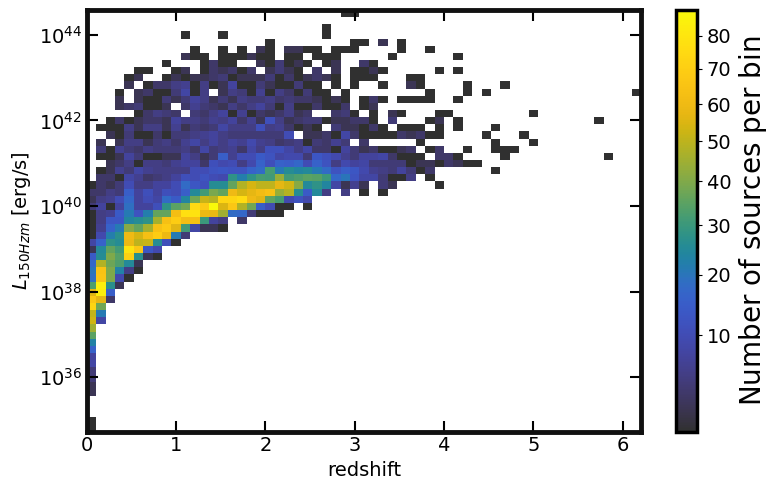

In [315]:
fig             = plt.figure(figsize=(8,5))
ax1             = fig.add_subplot(111, xscale='linear', yscale='log')

filter_good_vals = np.isfinite(redshift_df) & np.isfinite(luminosities_df['150MHz'])
x_space = np.linspace(0, np.nanmax(redshift_df.loc[filter_good_vals]), 60)
y_space = np.logspace(np.log10(np.nanmin(luminosities_df.loc[filter_good_vals, '150MHz'] * 1.5e8 * 1e7)), 
                      np.log10(np.nanmax(luminosities_df.loc[filter_good_vals, '150MHz'] * 1.5e8 * 1e7)), 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))
_, _, _, hist_sources_lums = ax1.hist2d(redshift_df.loc[filter_good_vals],
                                   (luminosities_df.loc[filter_good_vals, '150MHz'] * 1.5e8 * 1e7),
                                   bins=(x_space, y_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

cbar = fig.colorbar(hist_sources_lums, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.set_xlabel('redshift', size=14)
ax1.set_ylabel('$L_{150 Hzm}$ [erg/s]', size=14)
plt.setp(ax1.spines.values(), linewidth=3.5, color='k')
# ax1.set_xlim(left=0.2, right=2.4)
#ax1.set_aspect('equal', 'box')
fig.tight_layout()

Fix infinite values.

In [48]:
cols_2_fix = ['Ftot_VLASS', 'FEP_XMM']
for col in cols_2_fix:
    large_catalog_full_df.loc[:, col].mask(~np.isfinite(large_catalog_full_df.loc[:, col]), other=np.nan, inplace=True)

#### Calculate colours for several pairs of magnitudes in the sample.

In [49]:
colours_df                   = pd.DataFrame()
# colours_df['u_g']            = mag_catalog_df['PSFMAG_u']             - mag_catalog_df['PSFMAG_g']
colours_df['g_r']            = large_catalog_full_df['gmag']             - large_catalog_full_df['rmag']
colours_df['r_i']            = large_catalog_full_df['rmag']             - large_catalog_full_df['imag']
colours_df['i_z']            = large_catalog_full_df['imag']             - large_catalog_full_df['zmag']
colours_df['z_y']            = large_catalog_full_df['zmag']             - large_catalog_full_df['ymag']
# colours_df['u_r']            = mag_catalog_df['PSFMAG_u']             - mag_catalog_df['PSFMAG_r']  # ~U-V
colours_df['g_i']            = large_catalog_full_df['gmag']             - large_catalog_full_df['imag']
colours_df['w1_w2']          = large_catalog_full_df['W1mproPM']         - large_catalog_full_df['W2mproPM']
# colours_df['w1_w2']          = mag_catalog_df['W1mag']                - mag_catalog_df['W2mag']
colours_df['w2_w3']          = large_catalog_full_df['W2mag']            - large_catalog_full_df['W3mag']
colours_df['w3_w4']          = large_catalog_full_df['W3mag']            - large_catalog_full_df['W4mag']
colours_df['J_H']            = large_catalog_full_df['Jmag']             - large_catalog_full_df['Hmag']
colours_df['H_K']            = large_catalog_full_df['Hmag']             - large_catalog_full_df['Kmag']
colours_df['FUV_NUV']        = large_catalog_full_df['FUVmag_GALEX']     - large_catalog_full_df['NUVmag_GALEX']
# colours_df['u_g_corr']       = sdss_mags_ext_corr_df['PSFMAG_u_corr'] - sdss_mags_ext_corr_df['PSFMAG_g_corr']  # Extinction-corrected mags
# colours_df['g_r_corr']       = sdss_mags_ext_corr_df['PSFMAG_g_corr'] - sdss_mags_ext_corr_df['PSFMAG_r_corr']
# colours_df['r_i_corr']       = sdss_mags_ext_corr_df['PSFMAG_r_corr'] - sdss_mags_ext_corr_df['PSFMAG_i_corr']
# colours_df['i_z_corr']       = sdss_mags_ext_corr_df['PSFMAG_i_corr'] - sdss_mags_ext_corr_df['PSFMAG_z_corr']
# colours_df['u_r_corr']       = sdss_mags_ext_corr_df['PSFMAG_u_corr'] - sdss_mags_ext_corr_df['PSFMAG_r_corr']  # ~U-V
# colours_df['g_i_corr']       = sdss_mags_ext_corr_df['PSFMAG_g_corr'] - sdss_mags_ext_corr_df['PSFMAG_i_corr']

# colours_df.describe()

#### Add columns with ratios of magnitudes (Nakoneczny+2020, D'Isanto+2018)

In [50]:
ratios_df                   = pd.DataFrame()

# ratios_df['g/r']            = large_catalog_full_df['gmag']             / large_catalog_full_df['rmag']
# ratios_df['r/i']            = large_catalog_full_df['rmag']             / large_catalog_full_df['imag']
# ratios_df['i/z']            = large_catalog_full_df['imag']             / large_catalog_full_df['zmag']
# ratios_df['z/y']            = large_catalog_full_df['zmag']             / large_catalog_full_df['ymag']
# ratios_df['g/i']            = large_catalog_full_df['gmag']             / large_catalog_full_df['imag']
# ratios_df['w1/w2']          = large_catalog_full_df['W1mproPM']         / large_catalog_full_df['W2mproPM']
# ratios_df['w2/w3']          = large_catalog_full_df['W2mag']            / large_catalog_full_df['W3mag']
# ratios_df['w3/w4']          = large_catalog_full_df['W3mag']            / large_catalog_full_df['W4mag']
# ratios_df['J/H']            = large_catalog_full_df['Jmag']             / large_catalog_full_df['Hmag']
# ratios_df['H/K']            = large_catalog_full_df['Hmag']             / large_catalog_full_df['Kmag']
# ratios_df['FUV/NUV']        = large_catalog_full_df['FUVmag']           / large_catalog_full_df['NUVmag']

ratios_df['r/z']            = large_catalog_full_df['rmag']             / large_catalog_full_df['zmag']
ratios_df['i/y']            = large_catalog_full_df['imag']             / large_catalog_full_df['ymag']
ratios_df['w1/w3']          = large_catalog_full_df['W1mproPM']         / large_catalog_full_df['W3mag']
ratios_df['w1/w4']          = large_catalog_full_df['W1mproPM']         / large_catalog_full_df['W4mag']
ratios_df['w2/w4']          = large_catalog_full_df['W2mproPM']         / large_catalog_full_df['W4mag']
ratios_df['J/K']            = large_catalog_full_df['Jmag']             / large_catalog_full_df['Kmag']
ratios_df['FUV/K']          = large_catalog_full_df['FUVmag_GALEX']     / large_catalog_full_df['Kmag']

# ratios_df.describe()

#### Create column showing that there is X-ray/radio detection.

In [51]:
large_catalog_full_df['X_ray_detect'] = (np.array(large_catalog_full_tab['FEP_XMM'] > 0) &
                                         np.isfinite(large_catalog_full_tab['FEP_XMM'])).astype(int)
large_catalog_full_df['radio_detect'] = ((np.array(large_catalog_full_tab['Sint_LOFAR'] > 0) &\
                                          np.isfinite(large_catalog_full_tab['Sint_LOFAR'])) |\
                                         (np.array(large_catalog_full_tab['Stotal_TGSS'] > 0) &\
                                          np.isfinite(large_catalog_full_tab['Stotal_TGSS'])) |\
                                         (np.array(large_catalog_full_tab['Ftot_VLASS'] > 0) &\
                                          np.isfinite(large_catalog_full_tab['Ftot_VLASS']))).astype(int)

#### Create column with number of bands available for each source

In [52]:
band_count = pd.DataFrame()

# mag_count_bands = ['W1mproPM', 'W2mproPM', 'Sint_LOFAR', 'Total_flux_VLASS',\
#                    'Stotal_TGSS', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'gmag',\
#                    'rmag', 'imag', 'zmag', 'ymag', 'FUVmag', 'NUVmag', 'FEP',\
#                    'Jmag', 'Hmag', 'Kmag']  # Include fluxes converted to mags
mag_count_bands = ['W1mproPM', 'W4mag', 'gmag', 'ymag', 'FUVmag_GALEX', 
                   'NUVmag_GALEX', 'FEP_XMM', 'Kmag']  # Used bands

na_bool  = 1 - large_catalog_full_df.loc[:, mag_count_bands].isna().astype(int)

band_count['band_num'] = na_bool.sum(axis=1)

In [53]:
np.shape(large_catalog_full_df)

(56162, 126)

In [54]:
np.sum(large_catalog_full_df.loc[:, 'radio_detect'])

737.0

In [55]:
np.shape(np.array(large_catalog_full_df.loc[: 'X_ray_detect'] == 0))

(56162, 126)

## Possible correlations

---

In [56]:
np.array(large_catalog_full_df.columns)

array(['objID', 'RA_ICRS', 'DE_ICRS', 'Name', 'snrW1pm', 'snrW2pm',
       'W1mproPM', 'e_W1mproPM', 'W2mproPM', 'e_W2mproPM', 'RA_LOFAR',
       'DEC_LOFAR', 'Sint_LOFAR', 'e_Sint_LOFAR', 'Maj_LOFAR',
       'Min_LOFAR', 'PA_LOFAR', 'rms_LOFAR', 'angDist_LOFAR', 'RA_PS1',
       'DEC_PS1', 'gmag', 'e_gmag', 'rmag', 'e_rmag', 'imag', 'e_imag',
       'zmag', 'e_zmag', 'ymag', 'e_ymag', 'angDist_PS1', 'RA_ALLWISE',
       'DEC_ALLWISE', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'e_W1mag',
       'e_W2mag', 'e_W3mag', 'e_W4mag', 'angDist_ALLWISE', 'RA_2MASS',
       'DEC_2MASS', 'Jmag', 'Hmag', 'Kmag', 'e_Jmag', 'e_Hmag', 'e_Kmag',
       'angDist_2MASS', 'RA_MILLI', 'DEC_MILLI', 'NAME_MILLI', 'TYPE',
       'RMAG_MILLI', 'BMAG_MILLI', 'Z', 'CITE', 'ZCITE', 'QPCT', 'XNAME',
       'RNAME', 'LOBE1', 'LOBE2', 'Separation_MILLI', 'RA_SDSS',
       'DE_SDSS', 'mode', 'class', 'clean', 'umag_SDSS', 'gmag_SDSS',
       'rmag_SDSS', 'imag_SDSS', 'zmag_SDSS', 'e_umag_SDSS',
       'e_gmag_SDSS', 'e_rm

In [57]:
print(luminosities_df.columns)
print(colours_df.columns)
# print(sdss_mags_ext_corr_df.columns)
# print(mag_catalog_df.columns)

Index(['150MHz', '3GHz', 'XMM_full'], dtype='object')
Index(['g_r', 'r_i', 'i_z', 'z_y', 'g_i', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H',
       'H_K', 'FUV_NUV'],
      dtype='object')


In [58]:
cols2corr = ['Z'] + mag_cols + ['X_ray_detect', 'radio_detect']  # From main dataframe (large_catalog_full_df)
cols_a    = ['z_y', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H', 'H_K', 'FUV_NUV',
             'g_r', 'r_i', 'i_z', 'g_i']  # From colours_df
cols_b    = ['r/z', 'i/y', 'w1/w3', 'w1/w3', 'w2/w4',
             'J/K', 'FUV/K']  # From ratios_df
cols_c    = ['band_num']  # From band_count

In [59]:
corr_data_df          = large_catalog_full_df.loc[:, cols2corr]
for col in cols_a:
    corr_data_df[col] = colours_df.loc[:, col]
for col in cols_b:
    corr_data_df[col] = ratios_df.loc[:, col]
for col in cols_c:
    corr_data_df[col] = band_count.loc[:, col]

In [60]:
corr_data_df.columns

Index(['Z', 'W1mproPM', 'W2mproPM', 'Sint_LOFAR', 'Ftot_VLASS', 'Stotal_TGSS',
       'W1mag', 'W2mag', 'W3mag', 'W4mag', 'gmag', 'rmag', 'imag', 'zmag',
       'ymag', 'FUVmag_GALEX', 'NUVmag_GALEX', 'FEP_XMM', 'Jmag', 'Hmag',
       'Kmag', 'X_ray_detect', 'radio_detect', 'z_y', 'w1_w2', 'w2_w3',
       'w3_w4', 'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'g_i', 'r/z',
       'i/y', 'w1/w3', 'w2/w4', 'J/K', 'FUV/K', 'band_num'],
      dtype='object')

---

#### Intermediate step: impute magnitudes to create imputed colors.

In [61]:
mag_cols_a = ['W1mproPM', 'W2mproPM', 'Sint_LOFAR', 'Ftot_VLASS', 'Stotal_TGSS',
              'W1mag', 'W2mag', 'W3mag', 'W4mag', 'gmag', 'rmag', 'imag', 'zmag',
              'ymag', 'FUVmag_GALEX', 'NUVmag_GALEX', 'FEP_XMM', 'Jmag', 'Hmag', 'Kmag']
mag_cols_lim_old = {'W1mproPM': 22.8, 'W2mproPM': 22.1, 'Sint_LOFAR': 18.9, 'Ftot_VLASS': 17.2, 
                    'Stotal_TGSS': 13.8, 'W1mag': 21.8, 'W2mag': 21.4, 'W3mag': 18.7, 'W4mag': 16.7, 
                    'gmag': 23.3, 'rmag': 23.2, 'imag': 23.1, 'zmag': 22.3, 'ymag': 21.4, 
                    'FUVmag_GALEX': 23.5, 'NUVmag_GALEX': 24.0, 'FEP_XMM': 57.9, 'Jmag': 20.0, 
                    'Hmag': 19.4, 'Kmag': 19.35}

mag_cols_lim = {'W1mproPM': 20.13, 'W2mproPM': 19.81, 'Sint_LOFAR': 17.52, 'Ftot_VLASS': 15.21, 
                'Stotal_TGSS': 13.29, 'Fint_VLAS82': 17.86, 'W1mag': 19.6, 'W2mag': 19.34, 
                'W3mag': 16.67, 'W4mag': 14.62, 'gmag': 23.3, 'rmag': 23.2, 'imag': 23.1, 'zmag': 22.3, 
                'ymag': 21.4, 'FUVmag_GALEX': 20.0, 'NUVmag_GALEX': 21.0, 'FEP_XMM': 57.9, 'Jmag': 17.45, 
                'Hmag': 17.24, 'Kmag': 16.59}  # Proper (5-sigma) limits

mags_backup = pd.DataFrame()

for col in mag_cols_a:
    mags_backup[col] = corr_data_df.loc[:, col].fillna(np.float32(mag_cols_lim[col]), inplace=False)

In [62]:
mags_backup['g_r']     = mags_backup.loc[:, 'gmag']     - mags_backup.loc[:, 'rmag']
mags_backup['r_i']     = mags_backup.loc[:, 'rmag']     - mags_backup.loc[:, 'imag']
mags_backup['i_z']     = mags_backup.loc[:, 'imag']     - mags_backup.loc[:, 'zmag']
mags_backup['z_y']     = mags_backup.loc[:, 'zmag']     - mags_backup.loc[:, 'ymag']
mags_backup['g_i']     = mags_backup.loc[:, 'gmag']     - mags_backup.loc[:, 'imag']
mags_backup['w1_w2']   = mags_backup.loc[:, 'W1mproPM'] - mags_backup.loc[:, 'W2mproPM']
mags_backup['w2_w3']   = mags_backup.loc[:, 'W2mag']    - mags_backup.loc[:, 'W3mag']
mags_backup['w3_w4']   = mags_backup.loc[:, 'W3mag']    - mags_backup.loc[:, 'W4mag']
mags_backup['J_H']     = mags_backup.loc[:, 'Jmag']     - mags_backup.loc[:, 'Hmag']
mags_backup['H_K']     = mags_backup.loc[:, 'Hmag']     - mags_backup.loc[:, 'Kmag']
mags_backup['FUV_NUV'] = mags_backup.loc[:, 'FUVmag_GALEX']   - mags_backup.loc[:, 'NUVmag_GALEX']

In [63]:
mags_backup['r/z']     = mags_backup.loc[:, 'rmag']     / mags_backup.loc[:, 'zmag']
mags_backup['i/y']     = mags_backup.loc[:, 'imag']     / mags_backup.loc[:, 'ymag']
mags_backup['w1/w3']   = mags_backup.loc[:, 'W1mproPM'] / mags_backup.loc[:, 'W3mag']
mags_backup['w1/w4']   = mags_backup.loc[:, 'W1mproPM'] / mags_backup.loc[:, 'W4mag']
mags_backup['w2/w4']   = mags_backup.loc[:, 'W2mproPM'] / mags_backup.loc[:, 'W4mag']
mags_backup['J/K']     = mags_backup.loc[:, 'Jmag']     / mags_backup.loc[:, 'Kmag']
mags_backup['FUV/K']   = mags_backup.loc[:, 'FUVmag_GALEX']   / mags_backup.loc[:, 'Kmag']

In [64]:
for col in mag_cols_a:
    mags_backup[f'det_{col}'] = np.isfinite(corr_data_df.loc[:, col]).astype(int)

---

In [65]:
cols2drop1 = []

In [66]:
for col in corr_data_df.columns:
    filt_temp = np.isfinite(corr_data_df[col])
    removed   = 'NOT REMOVED'
    if np.sum(~filt_temp) > (0.75 * len(corr_data_df.loc[:, col])):
        if col not in ['Total_flux_LOFAR', 'FPEAK_FIRST', 'Total_flux_VLASS']:
            cols2drop1.append(col)
            removed = 'REMOVED'
    print(f'column: {col}\t -\t n_bad: {np.sum(~filt_temp)}\t{removed}')

column: Z	 -	 n_bad: 0	NOT REMOVED
column: W1mproPM	 -	 n_bad: 0	NOT REMOVED
column: W2mproPM	 -	 n_bad: 0	NOT REMOVED
column: Sint_LOFAR	 -	 n_bad: 47123	REMOVED
column: Ftot_VLASS	 -	 n_bad: 53645	REMOVED
column: Stotal_TGSS	 -	 n_bad: 55338	REMOVED
column: W1mag	 -	 n_bad: 7096	NOT REMOVED
column: W2mag	 -	 n_bad: 7096	NOT REMOVED
column: W3mag	 -	 n_bad: 7096	NOT REMOVED
column: W4mag	 -	 n_bad: 7097	NOT REMOVED
column: gmag	 -	 n_bad: 1547	NOT REMOVED
column: rmag	 -	 n_bad: 1129	NOT REMOVED
column: imag	 -	 n_bad: 857	NOT REMOVED
column: zmag	 -	 n_bad: 3646	NOT REMOVED
column: ymag	 -	 n_bad: 19144	NOT REMOVED
column: FUVmag_GALEX	 -	 n_bad: 48588	REMOVED
column: NUVmag_GALEX	 -	 n_bad: 34059	NOT REMOVED
column: FEP_XMM	 -	 n_bad: 54976	REMOVED
column: Jmag	 -	 n_bad: 53168	REMOVED
column: Hmag	 -	 n_bad: 53168	REMOVED
column: Kmag	 -	 n_bad: 53168	REMOVED
column: X_ray_detect	 -	 n_bad: 0	NOT REMOVED
column: radio_detect	 -	 n_bad: 55425	REMOVED
column: z_y	 -	 n_bad: 19340	NOT

Drop columns with similar information. Discard those with more invalid entries.

In [67]:
cols2drop1 = []
corr_data_df.drop(axis='1', columns=cols2drop1, inplace=True)

Scale features.

In [68]:
# max_abs_scaler = MaxAbsScaler()
min_max_scaler = MinMaxScaler(feature_range=(0., 1.))
# x_scaled = max_abs_scaler.fit_transform(large_catalog_df.values)
x_scaled = min_max_scaler.fit_transform(corr_data_df.values)
norm_corr_data_df = pd.DataFrame(data=x_scaled, columns=corr_data_df.columns, index=corr_data_df.index) 

In [69]:
norm_corr_data_df['Z'] = corr_data_df['Z']

In [70]:
correlation = norm_corr_data_df.corr()

In [71]:
correlation.abs().unstack().sort_values(ascending=False).drop_duplicates()[:70]

Z             Z               1.000000
Sint_LOFAR    Stotal_TGSS     0.986797
W2mag         W2mproPM        0.976701
rmag          imag            0.974605
W1mproPM      W1mag           0.973157
imag          zmag            0.972814
Hmag          Jmag            0.966349
rmag          gmag            0.961797
W2mproPM      W1mproPM        0.959952
Hmag          Kmag            0.952731
zmag          rmag            0.948943
W2mag         W1mag           0.947443
zmag          ymag            0.942410
W1mproPM      W2mag           0.941588
Kmag          Jmag            0.935720
W2mproPM      W1mag           0.931755
gmag          imag            0.926095
ymag          imag            0.919201
W1mag         Kmag            0.896602
w2/w4         W2mproPM        0.893416
gmag          zmag            0.892689
rmag          ymag            0.878849
W2mag         w2/w4           0.866317
ymag          Jmag            0.853449
w2/w4         W1mproPM        0.851886
W1mag         Hmag       

Drop one of the columns from pairs with correlation factors higher than $0.75$.  
They convey the same information.

In [72]:
# cols2drop2 = ['Sint_LOFAR', 'W2mag', 'W1mag', 'rmag', 'imag', 'zmag', 'W2mproPM', 'Jmag', 'Hmag', 'g_r'] Without ratios
# cols2drop2 = ['Stotal_TGSS', 'W2mag', 'W1mag', 'rmag', 'imag', 'zmag', 'W2mproPM', 'Jmag', 'Hmag', 'g_r']
cols2drop2 = ['Stotal_TGSS', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'W2mproPM', 'rmag', 'imag', 'zmag', 'ymag',
              'Jmag', 'Hmag', 'Kmag', 'NUVmag_GALEX', 'g_i', 'w1/w3', 'w2/w4', 'i/y']
norm_corr_data_df.drop(axis='1', columns=cols2drop2, inplace=True)

In [73]:
correlation_small = norm_corr_data_df.corr()

In [74]:
correlation_small.abs().unstack().sort_values(ascending=False).drop_duplicates()[:20]

Z             Z               1.000000
W1mproPM      gmag            0.713187
Sint_LOFAR    Ftot_VLASS      0.705092
H_K           J/K             0.702745
FUV/K         FUVmag_GALEX    0.699407
r/z           i_z             0.693921
              r_i             0.676606
W1mproPM      band_num        0.670698
FUVmag_GALEX  W1mproPM        0.646101
              gmag            0.642554
gmag          band_num        0.629011
w3_w4         W1mproPM        0.626963
w2_w3         W1mproPM        0.624697
W1mproPM      Z               0.585570
w3_w4         gmag            0.573009
FEP_XMM       W1mproPM        0.548224
Ftot_VLASS    FEP_XMM         0.532104
J/K           J_H             0.527711
FUV/K         w1_w2           0.526303
w3_w4         FUVmag_GALEX    0.482528
dtype: float64

<AxesSubplot:>

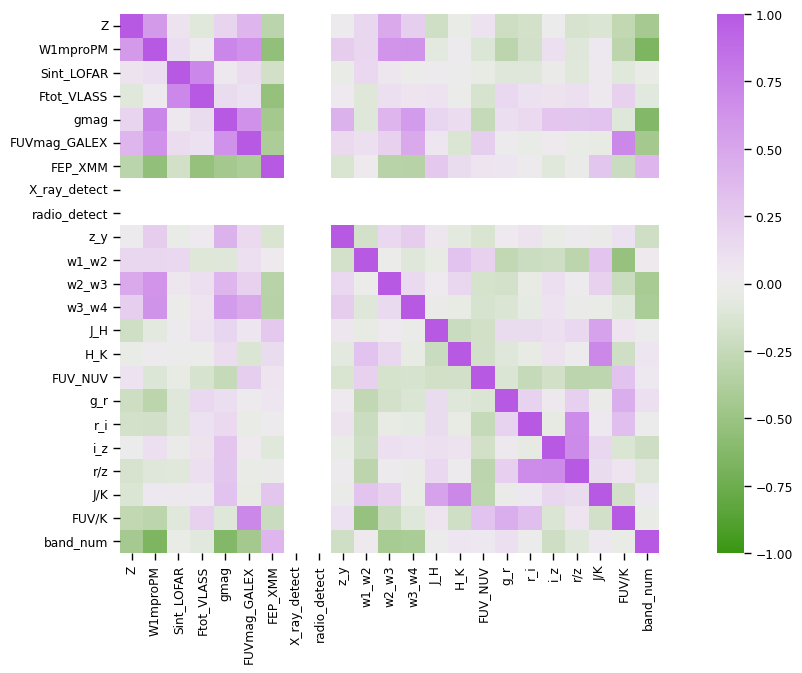

In [322]:
plt.figure(figsize=(15,7))
sns.set_context('paper', rc={'axes.labelsize':20, 'axes.ticklabelsize':14})
sns.heatmap(correlation_small, annot=False, cmap=plt.get_cmap('cet_gwv'), 
            center=0.0, vmin=-1.0, vmax=1.0, square=True)

In [76]:
# cols2drop3 = ['W3mag']  # Without ratios
# cols2drop3 = ['W3mag']
cols2drop3 = []
norm_corr_data_df.drop(axis='1', columns=cols2drop3, inplace=True)

In [77]:
pps_matrix = pps.matrix(norm_corr_data_df)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')

Text(548.4166666666667, 0.5, 'target')

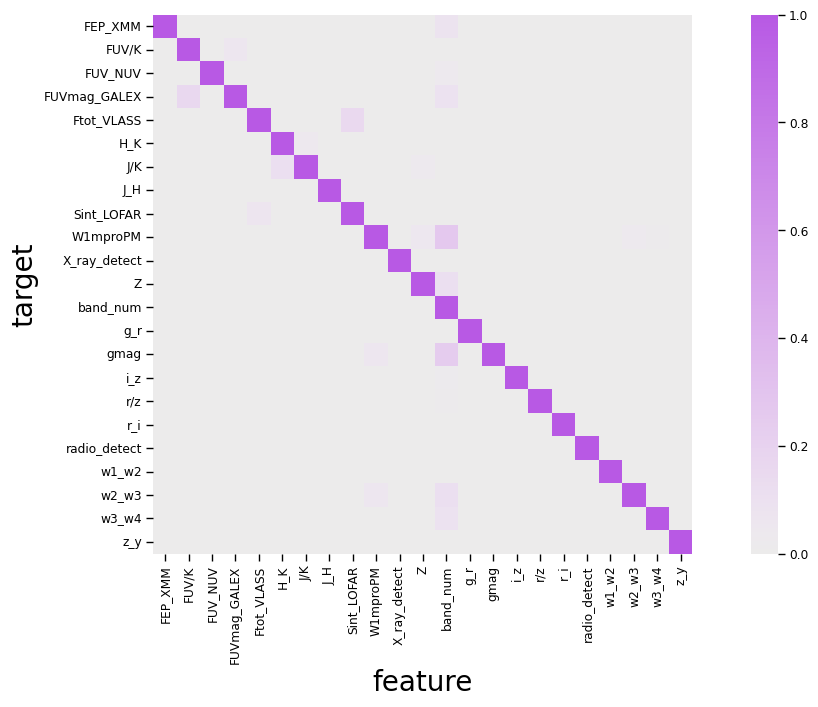

In [326]:
plt.figure(figsize=(15,7))
sns.set_context('paper', rc={'axes.labelsize':20, 'axes.ticklabelsize':14})
ax1 = sns.heatmap(pps_matrix, annot=False,
                  cmap=plt.get_cmap('cet_gwv'), 
            center=0.0, vmax=1.0, square=True)
ax1.set_xlabel('feature')
ax1.set_ylabel('target')

In [79]:
pps_matrix.unstack().sort_values(ascending=False).drop_duplicates()[:15]

x             y           
FEP_XMM       FEP_XMM         1.000000
band_num      W1mproPM        0.271437
              gmag            0.248159
FUV/K         FUVmag_GALEX    0.159717
Sint_LOFAR    Ftot_VLASS      0.155362
H_K           J/K             0.116121
band_num      Z               0.113460
              w2_w3           0.112277
              FUVmag_GALEX    0.093314
              w3_w4           0.091319
              FEP_XMM         0.078282
Ftot_VLASS    Sint_LOFAR      0.069158
W1mproPM      gmag            0.061872
FUVmag_GALEX  FUV/K           0.058964
W1mproPM      w2_w3           0.055944
dtype: float64

Last feature removal.

In [80]:
# cols2drop4 = ['Total_flux_VLASS', 'Stotal_TGSS', 'X_ray_detect']  # Without ratios
# cols2drop4 = ['Total_flux_VLASS', 'Sint_LOFAR', 'X_ray_detect']
cols2drop4 = []
norm_corr_data_df.drop(axis='1', columns=cols2drop4, inplace=True)

## Dimensionality reduction with PaCMAP (not used now)

In [81]:
# initializing the pacmap instance
# Setting n_neighbors to "None" leads to a default choice shown below in "parameter" section
# embedding = pacmap.PaCMAP(n_dims=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)

In [82]:
# norm_corr_data_filled_df = norm_corr_data_df.fillna(norm_corr_data_df.mean())
# large_catalog_filled_df = large_catalog_filled_df.fillna(large_catalog_filled_df.mean())
# filled_norm_corr_data_df = norm_corr_data_df.fillna(0.0)

In [83]:
# filled_norm_corr_data_df.dropna(axis='columns', how='all', inplace=True)

In [84]:
# fit the data (The index of transformed data corresponds to the index of the original data)
# X_transformed = embedding.fit_transform(norm_corr_data_filled_df.drop(axis=1, columns=['Z']).to_numpy(),\
#                                         init="pca")
# X_transformed = embedding.fit_transform(filled_norm_corr_data_df.drop(axis=1, columns=['Z']).to_numpy(),\
#                                         init="pca")

In [85]:
# X_transformed_df = pd.DataFrame(X_transformed, columns=['X1', 'X2'])

In [86]:
# visualize the embedding
# fig             = plt.figure(figsize=(10,8))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
# 
# norm_z = mcolors.Normalize(vmin=0, vmax=8)
# 
# sc_p = ax1.scatter(X_transformed_df.loc[:, 'X1'].sample(frac=1, random_state=42),\
#                    X_transformed_df.loc[:, 'X2'].sample(frac=1, random_state=42),\
#                    c=large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42),\
#                    cmap=cm.get_cmap('cmr.redshift', 8),\
#                    s=(large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42) + 1)*40,\
#                    ec='k', lw=0.3, norm=norm_z)
# 
# clb             = plt.colorbar(sc_p)
# clb.ax.tick_params(labelsize=14)
# clb.outline.set_linewidth(2.5)
# clb.ax.set_ylabel('z', size=14, path_effects=pe2)
# 
# ax1.set_xlabel('Dimension 1', fontsize=14)
# ax1.set_ylabel('Dimension 2', fontsize=14)
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# # ax1.set_ylim(top=0.03)
# #ax1.set_ylim(bottom=1e-4)
# # ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# fig.tight_layout()

In [87]:
# visualize the embedding
# fig             = plt.figure(figsize=(10,8))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
# 
# norm_z = mcolors.Normalize(vmin=2, vmax=20)
# 
# sc_p = ax1.scatter(X_transformed_df.loc[:, 'X1'].sample(frac=1, random_state=42),\
#                    X_transformed_df.loc[:, 'X2'].sample(frac=1, random_state=42),\
#                    c=band_count['band_num'].sample(frac=1, random_state=42),\
#                    cmap=cm.get_cmap('cmr.ember', 18),\
#                    s=(large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42) + 1)*40,\
#                    ec='k', lw=0.3, norm=norm_z)
# 
# clb             = plt.colorbar(sc_p)
# clb.ax.tick_params(labelsize=14)
# clb.outline.set_linewidth(2.5)
# clb.ax.set_ylabel('Number of measured bands', size=14, path_effects=pe2)
# 
# ax1.set_xlabel('Dimension 1', fontsize=14)
# ax1.set_ylabel('Dimension 2', fontsize=14)
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# # ax1.set_ylim(top=0.03)
# #ax1.set_ylim(bottom=1e-4)
# # ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# fig.tight_layout()

In [88]:
# visualize the embedding
# fig             = plt.figure(figsize=(10,8))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='linear', projection='scatter_density')
# 
# 
# norm = ImageNormalize(vmin=0., vmax=200, stretch=LogStretch())
# 
# dens_1 = ax1.scatter_density(X_transformed_df.loc[:, 'X1'].sample(frac=1, random_state=42),\
#             X_transformed_df.loc[:, 'X2'].sample(frac=1, random_state=42),\
#             cmap=plt.get_cmap('pink'), zorder=10, dpi=30, norm=norm, alpha=0.93)
# 
# # norm_z = mcolors.Normalize(vmin=0, vmax=8)
# # 
# # sc_p = ax1.scatter(X_transformed_df.loc[:, 'X1'].sample(frac=1, random_state=42),\
# #                    X_transformed_df.loc[:, 'X2'].sample(frac=1, random_state=42),\
# #                    c=large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42),\
# #                    cmap=cm.get_cmap('cmr.redshift', 8),\
# #                    s=(large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42) + 1)*40,\
# #                    ec='k', lw=0.3, norm=norm_z)
# 
# clb = plt.colorbar(dens_1)
# clb.ax.tick_params(labelsize=14)
# clb.outline.set_linewidth(2.5)
# clb.ax.set_ylabel('Points per pixel', size=20, path_effects=pe2)
# 
# ax1.set_xlabel('Dimension 1', fontsize=14)
# ax1.set_ylabel('Dimension 2', fontsize=14)
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# # ax1.set_ylim(top=0.03)
# #ax1.set_ylim(bottom=1e-4)
# # ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# fig.tight_layout()

In [89]:
# visualize the embedding
# fig             = plt.figure(figsize=(10,8))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
# 
# ax1.scatter(X_transformed_df.loc[:, 'X1'].sample(frac=1, random_state=42),\
#             X_transformed_df.loc[:, 'X2'].sample(frac=1, random_state=42),\
#             c=large_catalog_full_df.loc[:, 'radio_detect'].sample(frac=1, random_state=42),\
#             cmap=cm.get_cmap('Spectral', 3),\
#             s=(large_catalog_full_df.loc[:, 'Z'].sample(frac=1, random_state=42) + 1)*30,\
#             ec='k', lw=0.3)
# 
# ax1.set_xlabel('Dimension 1', fontsize=14)
# ax1.set_ylabel('Dimension 2', fontsize=14)
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# plt.setp(ax1.spines.values(), linewidth=2.5)
# # ax1.set_ylim(top=0.03)
# #ax1.set_ylim(bottom=1e-4)
# # ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# fig.tight_layout()

### Feature imputation

For colours, impute empty entries with something different to zero, which is a valid value.

In [90]:
# colour_cols = ['g_r', 'r_i', 'i_z', 'z_y', 'g_i', 'w1_w2', 'w2_w3',\
#                'w3_w4', 'J_H', 'H_K', 'FUV_NUV']
# colour_cols = ['z_y', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H', 'H_K',\
#                'FUV_NUV', 'r_i', 'i_z', 'g_i']
colour_cols = ['FUV_NUV', 'H_K', 'J_H', 'g_r', 'i_z', 'r_i', 'z_y', 
               'w1_w2', 'w2_w3', 'w3_w4']
for col in colour_cols:
    # corr_data_df.loc[:, col].mask(~np.isfinite(colours_df.loc[:, col]), other=-9.9, inplace=True)
    corr_data_df.loc[:, col] = mags_backup.loc[:, col]

For magnitudes, impute empty entries with something different to zero, which is a valid value.

In [91]:
# mag_cols_fin = ['W1mproPM', 'W4mag', 'gmag', 'ymag', 'FUVmag',\
#                 'NUVmag', 'FEP', 'Kmag']
for col in mag_cols:
    # corr_data_df.loc[:, col].mask(~np.isfinite(corr_data_df.loc[:, col]), other=35., inplace=True)
    corr_data_df.loc[:, col] = mags_backup.loc[:, col]

For errors of original magnitudes, impute empty entries with a very low value ($10^{-4}$).

In [92]:
# mag_err_cols = ['e_W1mproPM', 'e_W4mag', 'e_gmag', 'e_ymag',\
#                 'e_FUVmag', 'e_NUVmag', 'e_Kmag']  # Corresponding to the bands selected previously
# for col in mag_err_cols:
#     filt_col = ~np.isfinite(large_catalog_full_df.loc[:, col])
#     corr_data_df[col] = large_catalog_full_df.loc[:, col].mask(filt_col, other=1e-4, inplace=False)

For ratios of magnitudes, impute empty entries with zero.

In [93]:
# ratio_cols = ['r/z', 'i/y', 'w1/w3', 'w2/w4', 'J/K', 'FUV/K']
ratio_cols = ['r/z', 'J/K', 'FUV/K']

for col in ratio_cols:
    # filt_col = ~np.isfinite(ratios_df.loc[:, col])
    # corr_data_df[col] = ratios_df.loc[:, col].mask(filt_col, other=0, inplace=False)
    corr_data_df[col] = mags_backup.loc[:, col]

For X_ray_detect and radio_detect, impute with zero

In [94]:
detect_cols = ['X_ray_detect', 'radio_detect']

for col in detect_cols:
    impute_rows = ~np.isfinite(corr_data_df.loc[:, col])
    corr_data_df[col] = corr_data_df.loc[:, col].mask(impute_rows, other=0, inplace=False)

---

#### Test: predict log(z) rather than z

In [95]:
# norm_corr_data_df['log_Z'] = np.log10(1 + norm_corr_data_df.loc[:, 'Z'])
# norm_corr_data_df.drop(columns=['Z'], inplace=True)

# corr_data_df['log_Z'] = np.log10(1 + corr_data_df.loc[:, 'Z'])
# corr_data_df.drop(columns=['Z'], inplace=True)

---

## Use Machine Learning (ML)

We can use LightGBM or XGBC. Given the presence of NaN in the dataset,  
it is not possible to use `sklearn` methods.

Create random seed.

In [96]:
seed = 42

## Using `pycaret`.

Define an external dataset to test predictions.  
In this case, data from Stripe 82.

In [97]:
# file_name_s82 = 'CatWISE2020_S82_VLASS_VLAS82_PS1_GALEX_TGSS_XMM_2MASS_MILLIQUAS_ALLWISE_QSO_Z.fits'
# file_name_s82 = 'CatWISE2020_S82_VLASS_VLAS82_PS1_GALEX_TGSS_XMM_2MASS_MILLIQUAS_ALLWISE_QSO_Z_Ananna_zsp.fits'
file_name_s82 = 'CatWISE2020_VLAS82_area_large_VLAS82_PS1_ALLWISE_2MASS_MQC_74D_SDSS' +\
                '_DR16_VLASS_TGSS_GALEX_4XMM_DR9_5arcsec_AGN.fits'

In [98]:
stripe82_tab = Table.read(cat_path + file_name_s82, format='fits')
# stripe82_df   = pd.read_hdf(cat_path + file_name_s82, key='df')

In [99]:
filter_real_z_S82 = np.array(stripe82_tab['Z'] > 0) & np.isfinite(stripe82_tab['Z'])
stripe82_tab      = stripe82_tab[filter_real_z_S82]

In [100]:
for col in stripe82_tab.colnames:
    if 'float' in stripe82_tab[col].dtype.name:
        stripe82_tab[col].fill_value = np.nan

In [101]:
# stripe82_tab.info('stats')

Convert Vega magnitudes and fluxes to AB magnitudes.

In [102]:
all_vega_cols = ['W1mproPM', 'W2mproPM', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'Jmag', 'Hmag', 'Kmag',\
                 'e_W1mproPM', 'e_W2mproPM', 'e_W1mag', 'e_W2mag', 'e_W3mag', 'e_W4mag', 'e_Jmag',\
                 'e_Hmag', 'e_Kmag']
vega_cols     = ['W1mproPM', 'W2mproPM', 'W1mag', 'W2mag', 'W3mag', 'W4mag', 'Jmag', 'Hmag', 'Kmag']
vega_shift    = {'W1mproPM': 2.699, 'W2mproPM': 3.339, 'W1mag': 2.699, 'W2mag': 3.339, 'W3mag': 5.174,\
                 'W4mag': 6.620, 'Jmag': 0.910, 'Hmag': 1.390, 'Kmag': 1.850}
for col in vega_cols:
    stripe82_tab[col] += vega_shift[col]

fep_filter = ~np.isfinite(stripe82_tab['FEP_XMM'])
stripe82_tab['FEP_XMM'][fep_filter] = np.nan
xray_cols   = ['FEP_XMM']
for col in xray_cols:
    stripe82_tab[col] = stripe82_tab[col] / xray_freqs[col]
    stripe82_tab[col].unit = u.mW * u.m**-2 * u.Hz**-1
    stripe82_tab[col] = stripe82_tab[col].to(u.mJy)
    stripe82_tab[col] = stripe82_tab[col].to(u.mag(u.AB))

flx_cols = ['Ftot_VLASS', 'Fint_VLAS82', 'Stotal_TGSS', 'FEP_XMM']

for col in flx_cols:
    # stripe82_tab[col] = stripe82_tab[col].to(u.mag(u.AB))
    stripe82_tab[col].unit = u.mag(u.AB)

for col in stripe82_tab.colnames:
    if stripe82_tab[col].unit == u.mag:
        stripe82_tab[col].unit = u.mag(u.AB)
        stripe82_tab[col]      = u.Magnitude(stripe82_tab[col])
        
stripe82_tab['X_ray_detect'] = (np.array(stripe82_tab['FEP_XMM'] > 0) & np.isfinite(stripe82_tab['FEP_XMM'])).astype(int)
stripe82_tab['radio_detect'] = ((np.array(stripe82_tab['Fint_VLAS82'] > 0) &\
                                          np.isfinite(stripe82_tab['Fint_VLAS82'])) |\
                                         (np.array(stripe82_tab['Stotal_TGSS'] > 0) &\
                                          np.isfinite(stripe82_tab['Stotal_TGSS'])) |\
                                         (np.array(stripe82_tab['Ftot_VLASS'] > 0) &\
                                          np.isfinite(stripe82_tab['Ftot_VLASS']))).astype(int)

mag_cols_s82 = ['W1mproPM', 'W2mproPM', 'Fint_VLAS82', 'Ftot_VLASS', 'Stotal_TGSS',
                'W1mag', 'W2mag', 'W3mag', 'W4mag', 'gmag', 'rmag', 'imag', 'zmag',
                'ymag', 'FUVmag_GALEX', 'NUVmag_GALEX', 'FEP_XMM', 'Jmag', 'Hmag', 'Kmag']
col_cols_s82 = ['g_r', 'r_i', 'i_z', 'z_y', 'g_i', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H', 'H_K', 'FUV_NUV']
col_cols     = ['r_i', 'i_z', 'z_y', 'g_i', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H', 'H_K', 'FUV_NUV']

for col in mag_cols_s82:
    filt_mag = (np.array(stripe82_tab[col] <= 0) | ~np.isfinite(stripe82_tab[col]))
    stripe82_tab[col][filt_mag] = np.nan
    
temp_mag_s82_df = stripe82_tab[mag_cols_s82].to_pandas()
na_bool_82 = 1 - temp_mag_s82_df.isna().astype(int)
stripe82_tab['band_num'] = na_bool_82.sum(axis=1)
    
# Impute empty magnitude values
# mag_cols_lim_s82 = {'W1mproPM': 22.8, 'W2mproPM': 22.1, 'Fint_VLAS82': 18.1, 'Total_flux_VLASS': 17.2, 'Stotal_TGSS': 13.8,
#        'W1mag': 21.8, 'W2mag': 21.4, 'W3mag': 18.7, 'W4mag': 16.7, 'gmag': 23.3, 'rmag': 23.2, 'imag': 23.1, 'zmag': 22.3,
#        'ymag': 21.4, 'FUVmag': 23.5, 'NUVmag': 24.0, 'FEP': 57.9, 'Jmag': 20.0, 'Hmag': 19.4, 'Kmag': 19.35}
mag_cols_lim_s82 = {'W1mproPM': 20.13, 'W2mproPM': 19.81, 'Sint_LOFAR': 17.52, 'Ftot_VLASS': 15.21, 
                    'Stotal_TGSS': 13.29, 'Fint_VLAS82': 17.86, 'W1mag': 19.6, 'W2mag': 19.34, 
                    'W3mag': 16.67, 'W4mag': 14.62, 'gmag': 23.3, 'rmag': 23.2, 'imag': 23.1, 'zmag': 22.3,
                    'ymag': 21.4, 'FUVmag_GALEX': 20.0, 'NUVmag_GALEX': 21.0, 'FEP_XMM': 57.9, 'Jmag': 17.45, 
                    'Hmag': 17.24, 'Kmag': 16.59}  # Proper (5-sigma) limits
mags_backup = pd.DataFrame()

for col in mag_cols_s82:
    filt_empty = ~np.isfinite(stripe82_tab[col])
    stripe82_tab[col][filt_empty] = np.float32(mag_cols_lim_s82[col])


stripe82_tab['g_r']     = stripe82_tab['gmag']     - stripe82_tab['rmag']
stripe82_tab['r_i']     = stripe82_tab['rmag']     - stripe82_tab['imag']
stripe82_tab['i_z']     = stripe82_tab['imag']     - stripe82_tab['zmag']
stripe82_tab['z_y']     = stripe82_tab['zmag']     - stripe82_tab['ymag']
# stripe82_tab['u_r']     = stripe82_tab['PSFMAG_u'] - stripe82_tab['PSFMAG_r']  # ~U-V nO
stripe82_tab['g_i']     = stripe82_tab['gmag']     - stripe82_tab['imag']
stripe82_tab['w1_w2']   = stripe82_tab['W1mproPM'] - stripe82_tab['W2mproPM']
# stripe82_tab['w1_w2']   = stripe82_tab['W1mag']    - stripe82_tab['W2mag']  # nO
stripe82_tab['w2_w3']   = stripe82_tab['W2mag']    - stripe82_tab['W3mag']
stripe82_tab['w3_w4']   = stripe82_tab['W3mag']    - stripe82_tab['W4mag']
stripe82_tab['J_H']     = stripe82_tab['Jmag']     - stripe82_tab['Hmag']
stripe82_tab['H_K']     = stripe82_tab['Hmag']     - stripe82_tab['Kmag']
stripe82_tab['FUV_NUV'] = stripe82_tab['FUVmag_GALEX']   - stripe82_tab['NUVmag_GALEX']

stripe82_tab['r/z']     = stripe82_tab['rmag']     / stripe82_tab['zmag']
stripe82_tab['i/y']     = stripe82_tab['imag']     / stripe82_tab['ymag']
stripe82_tab['w1/w3']   = stripe82_tab['W1mproPM'] / stripe82_tab['W3mag']
stripe82_tab['w1/w4']   = stripe82_tab['W1mproPM'] / stripe82_tab['W4mag']
stripe82_tab['w2/w4']   = stripe82_tab['W2mproPM'] / stripe82_tab['W4mag']
stripe82_tab['J/K']     = stripe82_tab['Jmag']     / stripe82_tab['Kmag']
stripe82_tab['FUV/K']   = stripe82_tab['FUVmag_GALEX']   / stripe82_tab['Kmag']

for col in stripe82_tab.colnames:
    if 'float' in stripe82_tab[col].dtype.name:
        stripe82_tab[col].fill_value = np.nan

In [103]:
# fig             = plt.figure(figsize=(7,5))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='log')
# 
# 
# # bins_rat = np.linspace(np.nanmin(stripe82_tab['i/y']), np.nanmax(stripe82_tab['i/y']), 30)
# bins_rat = np.linspace(0.5, 30, 30)
# # ax1.hist(corr_data_df.loc[:, 'r/z'], bins=bins_rat, fc='Orchid', ec='k', histtype='stepfilled', alpha=1, lw=3.5);
# 
# 
# ax1.hist(stripe82_tab['r/z'], bins=50, fc='Gray', ec='k', histtype='stepfilled', alpha=0.95, lw=3.5);
# 
# ax1.hist(stripe82_test_df.loc[:, 'r/z'], bins=50, fc='Lime', ec='k', histtype='stepfilled', alpha=0.5, lw=3.5);
# 
# 
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# ax1.set_xlabel('$m_{\mathrm{NUV}}$', size=14)
# ax1.set_ylabel('Frequency', size=14)
# plt.setp(ax1.spines.values(), linewidth=3.5)
# plt.setp(ax1.spines.values(), linewidth=3.5)
# #ax1.set_xlim(left=0.2, right=2.4)
# #ax1.set_aspect('equal', 'box')
# fig.tight_layout()

In [104]:
# stripe82_tab = stripe82_tab[np.array(stripe82_tab['zsp'] > 0)]
# # stripe82_tab = stripe82_tab[np.array(stripe82_tab['zph'] > 0)]
# filt_sdss    = np.array(np.array(stripe82_tab['PSFMAG_u_corr'] > 0)) & np.array(np.array(stripe82_tab['PSFMAG_g_corr'] > 0)) &\
#                 np.array(np.array(stripe82_tab['PSFMAG_r_corr'] > 0)) & np.array(np.array(stripe82_tab['PSFMAG_i_corr'] > 0)) &\
#                 np.array(np.array(stripe82_tab['PSFMAG_z_corr'] > 0))
# stripe82_tab = stripe82_tab[filt_sdss]
# filt_class   = np.zeros_like(stripe82_tab['zsp'], dtype=bool)
# # filt_class   = np.zeros_like(stripe82_tab['zph'], dtype=bool)
# for count, spclass in enumerate(stripe82_tab['SpClass']):
#     filt_class[count] = (spclass.strip() == 'QSO')
# stripe82_tab = stripe82_tab[filt_class]

In [105]:
# used_cols_df = ['Z', 'W1mproPM', 'W4mag', 'gmag', 'ymag', 'FUVmag', 'NUVmag', 'FEP',
#                 'Kmag', 'radio_detect', 'z_y', 'w1_w2', 'w2_w3', 'w3_w4', 'J_H',
#                 'H_K', 'FUV_NUV', 'r_i', 'i_z', 'g_i', 'r/z', 'i/y', 'w1/w3', 'w2/w4',
#                 'J/K', 'FUV/K', 'band_num', 'zsp_Ananna', 'zph', 'zphP', 'zphB', 'zphR']
# used_cols_df = ['Z', 'W1mproPM', 'Sint_LOFAR', 'Ftot_VLASS', 'gmag', 'FUVmag_GALEX',
#                 'FEP_XMM', 'X_ray_detect', 'radio_detect', 'z_y', 'w1_w2', 'w2_w3',
#                 'w3_w4', 'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'r/z', 'J/K',
#                 'FUV/K', 'band_num', 'zsp_Ananna', 'zph', 'zphP', 'zphB', 'zphR']  # Before Boruta
used_cols_df = ['Z', 'W1mproPM', 'Ftot_VLASS', 'gmag', 'z_y', 'w1_w2', 'w2_w3',
                'w3_w4', 'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'r/z', 
                'J/K', 'band_num', 'zsp', 'zph']  # After Boruta

In [106]:
stripe82_test_df = stripe82_tab.to_pandas().loc[:, used_cols_df]

In [107]:
# stripe82_test_df = pd.DataFrame()

In [108]:
# stripe82_test_df['Z']            = stripe82_tab['Z']
# stripe82_test_df['W1mproPM']     = stripe82_tab['W1mproPM']
# stripe82_test_df['W4mag']        = stripe82_tab['W4mag']
# stripe82_test_df['gmag']         = stripe82_tab['gmag']
# stripe82_test_df['ymag']         = stripe82_tab['ymag']
# stripe82_test_df['FUVmag']       = stripe82_tab['FUVmag']
# stripe82_test_df['NUVmag']       = stripe82_tab['NUVmag']
# stripe82_test_df['FEP']          = stripe82_tab['FEP']
# stripe82_test_df['Kmag']         = stripe82_tab['Kmag']
# stripe82_test_df['radio_detect'] = stripe82_tab['radio_detect']
# stripe82_test_df['z_y']          = stripe82_tab['z_y']
# stripe82_test_df['w1_w2']        = stripe82_tab['w1_w2']
# stripe82_test_df['w2_w3']        = stripe82_tab['w2_w3']
# stripe82_test_df['w3_w4']        = stripe82_tab['w3_w4']
# stripe82_test_df['J_H']          = stripe82_tab['J_H']
# stripe82_test_df['H_K']          = stripe82_tab['H_K']
# stripe82_test_df['FUV_NUV']      = stripe82_tab['FUV_NUV']
# stripe82_test_df['r_i']          = stripe82_tab['r_i']
# stripe82_test_df['i_z']          = stripe82_tab['i_z']
# stripe82_test_df['g_i']          = stripe82_tab['g_i']
# stripe82_test_df['r/z']          = stripe82_tab['r/z']
# stripe82_test_df['i/y']          = stripe82_tab['i/y']
# stripe82_test_df['w1/w3']        = stripe82_tab['w1/w3']
# stripe82_test_df['w2/w4']        = stripe82_tab['w2/w4']
# stripe82_test_df['J/K']          = stripe82_tab['J/K']
# stripe82_test_df['FUV/K']        = stripe82_tab['FUV/K']

# for col in stripe82_test_df.columns:
#     filt_inf = ~np.isfinite(stripe82_test_df.loc[:, col])
#     stripe82_test_df.loc[:, col].mask(filt_inf, other=np.nan, inplace=True)

Imputations.

In [109]:

# mag_cols_s82_df = ['W1mproPM', 'W4mag', 'gmag', 'ymag', 'FUVmag', 'NUVmag', 'FEP', 'Kmag']

# for col in col_cols:
#     filt_col = ~np.isfinite(stripe82_test_df.loc[:, col])
#     # stripe82_tab[col][filt_col] = -9.9
#     stripe82_test_df.loc[:, col].mask(filt_col, other=-9.9, inplace=True)
# for col in mag_cols_s82_df:
#     filt_col = ~np.isfinite(stripe82_test_df.loc[:, col])
#     # stripe82_tab[col][filt_col] = 35
#     stripe82_test_df.loc[:, col].mask(filt_col, other=35, inplace=True)
# for col in ratio_cols:
#     filt_col = ~np.isfinite(stripe82_test_df.loc[:, col])
#     # stripe82_tab[col][filt_col] = 0.0
#     stripe82_test_df.loc[:, col].mask(filt_col, other=0.0, inplace=True)

In [110]:
# stripe82_test_df.describe()

Scale features.

In [111]:
# min_max_scaler_s82    = MinMaxScaler(feature_range=(0., 1.))
# x_scaled_s82          = min_max_scaler_s82.fit_transform(stripe82_test_df.values)
# norm_stripe82_test_df = pd.DataFrame(data=x_scaled_s82, columns=stripe82_test_df.columns, index=stripe82_test_df.index) 

In [112]:
# norm_stripe82_test_df['Z'] = stripe82_test_df['Z']

Select features individually, to avoid running Boruta.

In [113]:
norm_corr_data_df = norm_corr_data_df.loc[:, ['Z', 'W1mproPM', 
                                              'Ftot_VLASS', 'gmag', 
                                              'z_y', 'w1_w2', 'w2_w3', 
                                              'w3_w4', 'J_H', 'H_K', 
                                              'FUV_NUV', 'g_r', 'r_i', 
                                              'i_z', 'r/z', 'J/K', 'band_num']]

#### Divide dataset: Train, test, and Validation

In [114]:
data_norm_df        = corr_data_df.loc[:, norm_corr_data_df.columns].sample(frac=0.90, random_state=seed)  # train/test sets
data_norm_unseen_df = corr_data_df.loc[:, norm_corr_data_df.columns].drop(data_norm_df.index) # validation set
# data_norm_df        = norm_corr_data_df.sample(frac=0.90, random_state=seed)  # train/test sets
# data_norm_unseen_df = norm_corr_data_df.drop(data_norm_df.index) # validation set

# data_norm_df.reset_index(drop=True, inplace=True)
# data_norm_unseen_df.reset_index(drop=True, inplace=True)

print('Shape of used data')
print('-' * 40)
print(f'Full Dataset size: {norm_corr_data_df.shape}')
print(f'Data for Modeling (Train and Test): {data_norm_df.shape}')
print(f'Unseen Data For Validation: {data_norm_unseen_df.shape}')

Shape of used data
----------------------------------------
Full Dataset size: (56162, 17)
Data for Modeling (Train and Test): (50546, 17)
Unseen Data For Validation: (5616, 17)


In [115]:
# data_norm_df.describe()

---

Test the use of `smogn` for dealing with imbalanced data.  
This was not used since it did not improve results significantly.

In [116]:
# data_norm_unseen_filled_df = data_norm_unseen_df.copy()
# data_norm_unseen_filled_df = data_norm_unseen_filled_df.fillna(0)

In [117]:
# conduct smogn
# data_norm_smogn_df = smogn.smoter(
#     
#     ## main arguments
#     data = data_norm_df.reset_index(drop=True),  ## pandas dataframe
#     y = 'Z',                     ## string ('header name')
#     k = 10,                       ## positive integer (k < n)
#     pert = 0.04,                 ## real number (0 < R < 1)
#     samp_method = 'balance',     ## string ('balance' or 'extreme')
#     drop_na_col = False,         ## boolean (True or False)
#     drop_na_row = False,         ## boolean (True or False)
#     replace = False,             ## boolean (True or False)
# 
#     ## phi relevance arguments
#     rel_thres = 0.10,            ## real number (0 < R < 1)
#     rel_method = 'auto',         ## string ('auto' or 'manual')
#     # rel_xtrm_type = 'both',    ## unused (rel_method = 'manual')
#     # rel_coef = 1.50,           ## unused (rel_method = 'manual')
#     # rel_ctrl_pts_rg = rg_mtrx  ## 2d array (format: [x, y])
# )

In [118]:
# data_norm_smogn_df.to_hdf(cat_path + 'smogn_df_z_jun_15.h5', key='df')

In [119]:
# np.shape(data_norm_df)

In [120]:
# np.shape(data_norm_smogn_df)

In [121]:
## distribution plot
# sns.kdeplot(data_norm_df['Z'], label = "Original")
# sns.kdeplot(data_norm_smogn_df['Z'], label = "Modified")
# plt.legend()
# plt.yscale('log')

SMOGN result:  
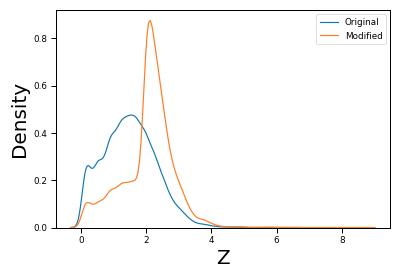

---

In [122]:
data_norm_df.columns

Index(['Z', 'W1mproPM', 'Ftot_VLASS', 'gmag', 'z_y', 'w1_w2', 'w2_w3', 'w3_w4',
       'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'r/z', 'J/K', 'band_num'],
      dtype='object')

#### Setup of Pycaret

In [122]:
# Ready to use with Boruta
#exp_mclf = pyr.setup(data=data_norm_df, target='Z', session_id=seed,
#                     silent=True, categorical_features=['radio_detect', 'X_ray_detect'],
#                     feature_selection=True, feature_selection_method='boruta',
#                     numeric_features=['W1mproPM', 'Sint_LOFAR', 'Ftot_VLASS', 'gmag', 
#                                       'FUVmag_GALEX', 'FEP_XMM', 'z_y', 'w1_w2', 'w2_w3',
#                                       'w3_w4', 'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 
#                                       'i_z', 'r/z', 'J/K', 'FUV/K', 'band_num'],
#                     #ignore_features=['log_Z'],
#                     remove_outliers=False, outliers_threshold=0.01, n_jobs=12,
#                     categorical_imputation='constant', numeric_imputation='zero',
#                     normalize=True, normalize_method='zscore', transformation=True,
#                     transformation_method='yeo-johnson', transform_target=False,
#                     transform_target_method='box-cox')
# After first run of Boruta. Saving running time
exp_mclf = pyr.setup(data=data_norm_df, target='Z', session_id=seed,
                     silent=True, categorical_features=None,
                     feature_selection=False, feature_selection_method='boruta',
                     numeric_features=['W1mproPM', 'Ftot_VLASS', 'gmag', 
                                       'z_y', 'w1_w2', 'w2_w3', 'w3_w4', 
                                       'J_H', 'H_K', 'FUV_NUV', 'g_r', 
                                       'r_i', 'i_z', 'r/z', 'J/K', 'band_num'],
                     #ignore_features=['log_Z'],
                     remove_outliers=False, outliers_threshold=0.01, n_jobs=12,
                     categorical_imputation='constant', numeric_imputation='zero',
                     normalize=True, normalize_method='zscore', transformation=True,
                     transformation_method='yeo-johnson', transform_target=False,
                     transform_target_method='box-cox')

,Description,Value
0,session_id,42
1,Target,Z
2,Original Data,"(50546, 17)"
3,Missing Values,False
4,Numeric Features,16
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(35382, 16)"


In [123]:
X_full_model = pyr.get_config('X')

In [124]:
X_full_model.columns

Index(['W1mproPM', 'Ftot_VLASS', 'gmag', 'z_y', 'w1_w2', 'w2_w3', 'w3_w4',
       'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'r/z', 'J/K', 'band_num'],
      dtype='object')

In [125]:
pyr.add_metric('z_met', 'z_metric', z_score_abs, greater_is_better=False)

Name                                                          z_metric
Display Name                                                  z_metric
Score Function                <function z_score_abs at 0x7f24fc8051f0>
Scorer               make_scorer(z_score_abs, greater_is_better=False)
Target                                                            pred
Args                                                                {}
Greater is Better                                                False
Custom                                                            True
Name: z_met, dtype: object

In [126]:
pyr.add_metric('log_z_m', 'log_z', log_z_score_abs, greater_is_better=False)

Name                                                             log_z
Display Name                                                     log_z
Score Function            <function log_z_score_abs at 0x7f24fc805550>
Scorer               make_scorer(log_z_score_abs, greater_is_better...
Target                                                            pred
Args                                                                {}
Greater is Better                                                False
Custom                                                            True
Name: log_z_m, dtype: object

In [127]:
# best = pyr.compare_models()
top5 = pyr.compare_models(n_select=5, exclude=['huber', 'knn'], sort='z_met')
# top5 = pyr.compare_models(n_select=5, exclude=['huber', 'knn'], sort='log_z_m')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,z_metric,log_z,TT (Sec)
rf,Random Forest Regressor,0.2647,0.1775,0.4212,0.6920,0.1640,0.3005,0.0619,0.3520,1.9380
et,Extra Trees Regressor,0.2683,0.1755,0.4189,0.6954,0.1629,0.2923,0.0647,0.3672,0.6770
catboost,CatBoost Regressor,0.2797,0.1740,0.4171,0.6980,0.1648,0.3463,0.0746,0.4100,1.0820
lightgbm,Light Gradient Boosting Machine,0.2850,0.1793,0.4234,0.6888,0.1665,0.3326,0.0768,0.4225,27.8540
xgboost,Extreme Gradient Boosting,0.2898,0.1866,0.4319,0.6762,0.1704,0.3410,0.0769,0.4213,9.5560
dt,Decision Tree Regressor,0.3730,0.3721,0.6097,0.3541,0.2347,0.3547,0.0796,0.4402,0.0870
gbr,Gradient Boosting Regressor,0.3325,0.2211,0.4701,0.6163,0.1842,0.3970,0.0963,0.5217,1.1510
lar,Least Angle Regression,0.4032,0.3096,0.5562,0.4626,0.2209,0.6064,0.1214,0.6450,0.0220
br,Bayesian Ridge,0.4033,0.3096,0.5562,0.4627,0.2209,0.6063,0.1214,0.6452,0.0250
ridge,Ridge Regression,0.4032,0.3096,0.5562,0.4626,0.2209,0.6064,0.1214,0.6451,0.0210


Test result with magnitudes:  
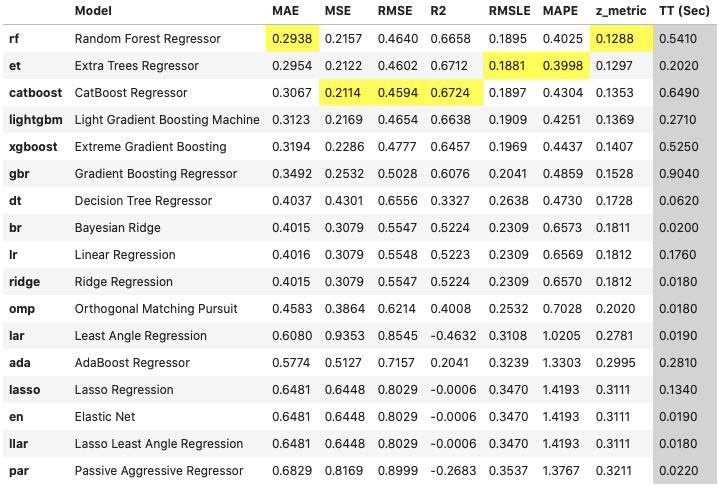

In [128]:
# pyr_catboost = pyr.create_model('catboost')
# pyr_catboost = pyr.create_model(best)
pyr_stacked = pyr.stack_models(estimator_list=top5[1:], meta_model=top5[0])

,MAE,MSE,RMSE,R2,RMSLE,MAPE,z_metric,log_z
Fold,,,,,,,,
0,0.2421,0.1532,0.3914,0.7304,0.1511,0.2436,0.0549,0.3065
1,0.2556,0.1704,0.4127,0.7070,0.1569,0.2354,0.0584,0.3365
2,0.2542,0.1755,0.4190,0.6965,0.1615,0.3403,0.0572,0.3224
3,0.2467,0.1531,0.3913,0.7238,0.1540,0.2387,0.0562,0.3265
4,0.2532,0.1706,0.4130,0.7039,0.1624,0.2926,0.0570,0.3248
5,0.2502,0.1696,0.4118,0.7129,0.1606,0.2521,0.0548,0.3158
6,0.2501,0.1713,0.4139,0.7052,0.1631,0.2934,0.0557,0.3160
7,0.2455,0.1594,0.3992,0.7200,0.1547,0.2397,0.0555,0.3235
8,0.2497,0.1641,0.4051,0.7247,0.1588,0.2685,0.0557,0.3182


Stacking results with magnitudes:  
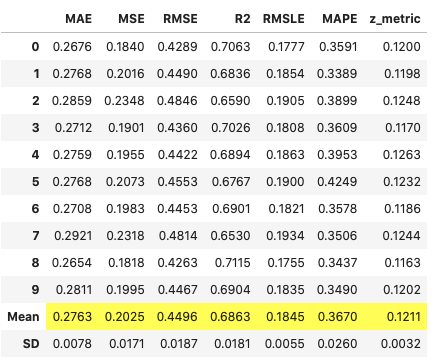

In [129]:
# pyr_xgboost  = pyr.create_model('xgboost')

In [130]:
# pyr_stack_bagged = pyr.ensemble_model(pyr_stacked, method='Bagging', optimize='z_met')

In [131]:
# Ensemble: blending
# blended      = pyr.blend_models(estimator_list=[pyr_catboost, pyr_xgboost, pyr_lightgbm])
# Ensemble: boosting
# boosting     = pyr.ensemble_model(pyr_catboost, method='Boosting')

In [132]:
# tuned_catboost = pyr.tune_model(boosting)
# tuned_stacked = pyr.tune_model(pyr_stacked, early_stopping='asha', optimize='z_met',\
#                                search_library='tune-sklearn', search_algorithm='optuna')

tuned_stacked = pyr.tune_model(pyr_stacked, early_stopping='asha', optimize='z_met')
# tuned_stacked = pyr.tune_model(pyr_stacked, early_stopping='asha', optimize='log_z_m')
# tuned_stacked = pyr.tune_model(pyr_stack_bagged, early_stopping='asha', optimize='z_met')

,MAE,MSE,RMSE,R2,RMSLE,MAPE,z_metric,log_z
Fold,,,,,,,,
0,0.2451,0.1586,0.3982,0.7210,0.1525,0.2477,0.0567,0.3076
1,0.2558,0.1714,0.4140,0.7052,0.1571,0.2343,0.0585,0.3354
2,0.2551,0.1735,0.4166,0.7000,0.1596,0.3651,0.0586,0.3241
3,0.2477,0.1528,0.3908,0.7244,0.1518,0.2426,0.0585,0.3258
4,0.2533,0.1680,0.4099,0.7084,0.1595,0.2688,0.0587,0.3224
5,0.2518,0.1644,0.4055,0.7216,0.1572,0.2559,0.0581,0.3240
6,0.2503,0.1734,0.4164,0.7016,0.1627,0.2841,0.0562,0.3155
7,0.2507,0.1650,0.4062,0.7102,0.1576,0.2426,0.0591,0.3367
8,0.2502,0.1637,0.4046,0.7254,0.1575,0.2709,0.0585,0.3289


Results with magnitudes:  
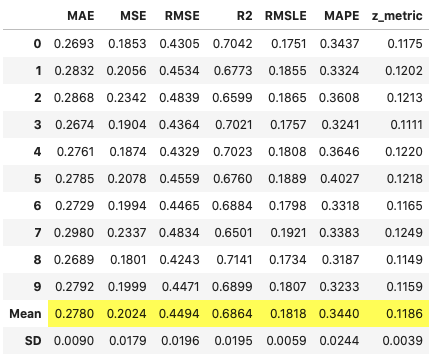

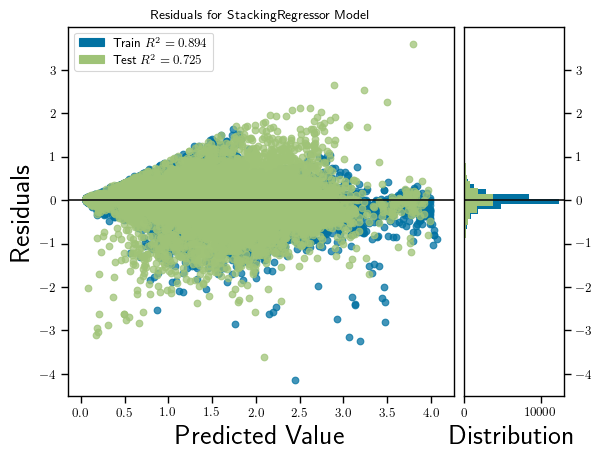

In [133]:
pyr.plot_model(tuned_stacked, plot='residuals')

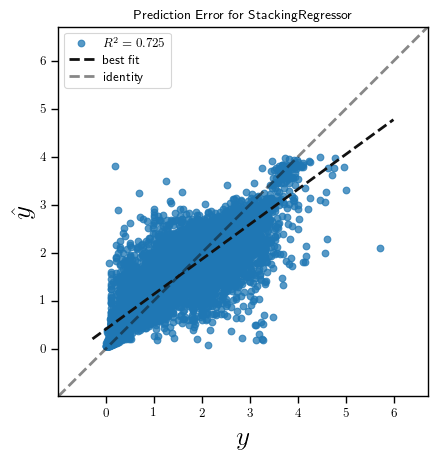

In [134]:
pyr.plot_model(tuned_stacked, plot='error')

Previous results:  
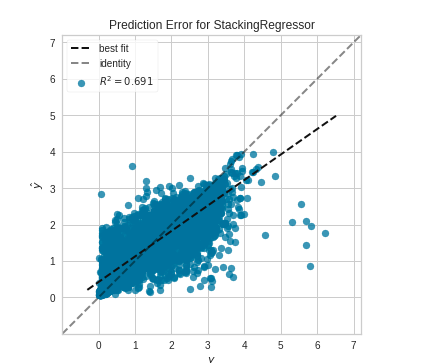

In [128]:
# pyr.plot_model(tuned_stacked, plot='tree')

In [129]:
# pyr.plot_model(tuned_stacked, plot='rfe')

In [130]:
# pyr.plot_model(tuned_stacked.final_estimator_, plot='feature_all')

Reset `matplotlib` settings.

In [135]:
# plt.style.use('default')
plt.rcParams.update(plt.rcParamsDefault)

In [136]:
# import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)

In [137]:
pyr.predict_model(tuned_stacked)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,z_metric,log_z
0,Stacking Regressor,0.2513,0.1584,0.3980,0.7248,0.1553,0.2510,0.0584,0.3256


,W1mproPM,Ftot_VLASS,gmag,z_y,w1_w2,w2_w3,w3_w4,J_H,H_K,FUV_NUV,g_r,r_i,i_z,r/z,J/K,band_num,Z,Label
0,-0.524058,-0.00034,-0.345754,-0.170424,-0.295303,-0.470128,-0.369155,0.156823,0.188044,1.451633,0.524378,-0.501220,0.559117,0.143707,0.195271,1.523714,0.329,0.86180
1,-0.125208,-0.00034,0.256852,-1.430938,-0.528972,0.210908,-0.484431,0.156823,0.188044,0.042711,0.179383,-0.187929,-0.416867,-0.504772,0.195271,-0.926947,1.213,1.34875
2,0.642983,-0.00034,0.325213,0.465371,1.810000,0.000834,-0.017008,0.156823,0.188044,-0.681102,0.008042,0.286264,-0.252705,-0.010918,0.195271,0.763169,1.199,1.50835
3,1.971007,-0.00034,0.640230,-0.946668,0.777993,1.802960,1.791306,0.156823,0.188044,0.042711,0.249783,-0.519473,0.123353,-0.269890,0.195271,-1.858141,2.432,2.68055
4,-1.544762,-0.00034,-2.356743,-0.138444,-0.251437,-0.080616,-1.940463,-3.011300,-3.496830,-0.076759,-0.404402,-0.145416,0.055796,0.049573,-3.576995,1.523714,2.196,2.07825
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15159,-0.818899,-0.00034,-1.917907,0.076028,0.266994,-0.314722,-1.264079,0.156823,0.188044,0.042711,-0.395650,-0.839706,-0.242628,-0.819469,0.195271,-0.046680,2.287,2.06255
15160,-1.271579,-0.00034,-2.164748,0.038719,1.002881,-0.234164,-2.105816,0.156823,0.188044,1.651408,-0.436773,-0.310323,-0.652759,-0.825345,0.195271,0.763169,1.924,1.42515
15161,-0.003643,-0.00034,-0.981033,0.107005,0.058073,0.475163,0.027333,0.156823,0.188044,0.042711,-0.705639,0.451579,-0.450623,-0.017940,0.195271,-0.046680,1.863,2.10625
15162,-0.424017,-0.00034,0.013132,-0.044135,0.994410,-1.317828,0.219158,0.156823,0.188044,-1.103008,-0.150103,0.186700,-0.055437,0.092117,0.195271,0.763169,1.648,1.45815


In [138]:
print(tuned_stacked)

StackingRegressor(cv=5,
                  estimators=[('et',
                               ExtraTreesRegressor(bootstrap=False,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100, n_jobs=12,

In [139]:
final_stacked = pyr.finalize_model(tuned_stacked)

/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3

In [140]:
print(final_stacked)

StackingRegressor(cv=5,
                  estimators=[('et',
                               ExtraTreesRegressor(bootstrap=False,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100, n_jobs=12,

In [137]:
# interpret_model: SHAP
# pyr.interpret_model(final_stacked.final_estimator_, feature='Z', plot='summary')

### Save model.

In [141]:
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_12_2021')  # mags, normalised data+z zscore, yeo-johnson
# pyr.save_config('config_final_LoTSS_z_log_may_12_2021')  # mags, normalised data+z zscore, yeo-johnson
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_12_2021_b')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray
# pyr.save_config('config_final_LoTSS_z_log_may_12_2021_b')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_12_2021_c')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray, optuna
# pyr.save_config('config_final_LoTSS_z_log_may_12_2021_c')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray, optuna
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_15_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios
# pyr.save_config('config_final_LoTSS_z_log_may_15_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_19_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count
# pyr.save_config('config_final_LoTSS_z_log_may_19_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_25_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, bag
# pyr.save_config('config_final_LoTSS_z_log_may_25_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, bag
#pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_may_31_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, imput
#pyr.save_config('config_final_LoTSS_z_log_may_31_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, imput
# # pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_jun_14_2021')  #normalised data+z zscore, yeo-johnson, ratios, band count, imput, smogn
# # pyr.save_config('config_final_LoTSS_z_log_jun_14_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count, imput, smogn
# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_jun_17_2021')  # normalised data+logz zscore, yeo-johnson, ratios, band count, imput
# pyr.save_config('config_final_LoTSS_z_log_jun_17_2021')  # normalised data+logz zscore, yeo-johnson, ratios, band count, imput

# pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_jun_23_2021')  # data+z zscore, yeo-johnson, ratios, band count, imput, median
# pyr.save_config('config_final_LoTSS_z_log_jun_23_2021')  # data+z zscore, yeo-johnson, ratios, band count, imput, median

pyr.save_model(final_stacked, 'model_final_LoTSS_z_log_sep_03_2023')
pyr.save_config('config_final_LoTSS_z_log_sep_03_2023')

Transformation Pipeline and Model Successfully Saved


/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3.8/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/home/rcarvajal/.miniforge3/envs/clone_test_pycaret/lib/python3

### Load model.

In [123]:
# pyr.load_config('config_final_LoTSS_z_log_may_12_2021')  # mags, normalised data+z zscore, yeo-johnson
# pyr.load_config('config_final_LoTSS_z_log_may_12_2021_b')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray
# pyr.load_config('config_final_LoTSS_z_log_may_12_2021_c')  # mags, normalised data+z zscore, yeo-johnson, no radio/x-ray, optuna
# pyr.load_config('config_final_LoTSS_z_log_may_15_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios
# pyr.load_config('config_final_LoTSS_z_log_may_19_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count
# pyr.load_config('config_final_LoTSS_z_log_may_25_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, bag
# pyr.load_config('config_final_LoTSS_z_log_may_31_2021')  # mags, normalised data+z zscore, yeo-johnson, ratios, band count, imput
# pyr.load_config('config_final_LoTSS_z_log_jun_14_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count, imput, smogn
# pyr.load_config('config_final_LoTSS_z_log_jun_17_2021')  # normalised data+logz zscore, yeo-johnson, ratios, band count, imput
#pyr.load_config('config_final_LoTSS_z_log_jun_23_2021')  # data+z zscore, yeo-johnson, ratios, band count, imput, median
pyr.load_config('config_final_LoTSS_z_log_sep_03_2023')

In [124]:
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_12_2021')  # mags, normalised data+z zscore, yeo-johnson
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_12_2021_b')  # normalised data+z zscore, yeo-johnson, no radio/x-ray
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_12_2021_c')  # normalised data+z zscore, yeo-johnson, no radio/x-ray, optuna
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_15_2021')  # normalised data+z zscore, yeo-johnson, ratios
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_19_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_25_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count, bag
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_may_31_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count, imput
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_jun_14_2021')  # normalised data+z zscore, yeo-johnson, ratios, band count, imput, smogn
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_jun_17_2021')  # normalised data+logz zscore, yeo-johnson, ratios, band count, imput
# final_stacked = pyr.load_model('model_final_LoTSS_z_log_jun_23_2021')  # data+z zscore, yeo-johnson, ratios, band count, imput, median
final_stacked = pyr.load_model('model_final_LoTSS_z_log_sep_03_2023')

Transformation Pipeline and Model Successfully Loaded


In [125]:
# final_stacked.steps[-1][1].final_estimator.feature_importances_

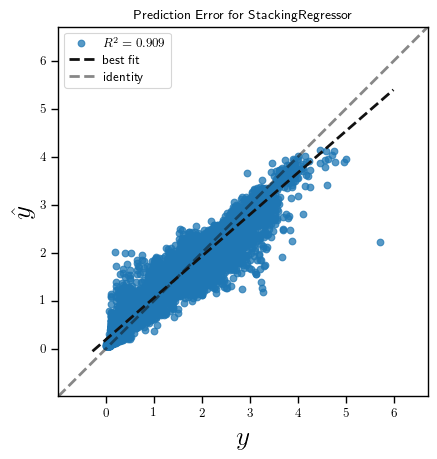

In [126]:
pyr.plot_model(final_stacked.steps[-1][1], plot='error')

Reset `matplotlib` settings.

In [127]:
# plt.style.use('default')
plt.rcParams.update(plt.rcParamsDefault)

In [128]:
# pyr.get_metrics(include_custom=True)

In [129]:
# X_full_model = pyr.get_config('X')
# y_full_model = pyr.get_config('y')
X_train_model = pyr.get_config('X_train')
# y_train_model = pyr.get_config('y_train')
# X_test_model = pyr.get_config('X_test')
# y_test_model = pyr.get_config('y_test')

In [130]:
# X_full_model.columns

In [131]:
# final_stacked.named_steps['trained_model'].final_estimator_

In [132]:
# pyr.interpret_model(final_stacked.named_steps['trained_model'].estimators_[0], plot='summary', feature='Z')

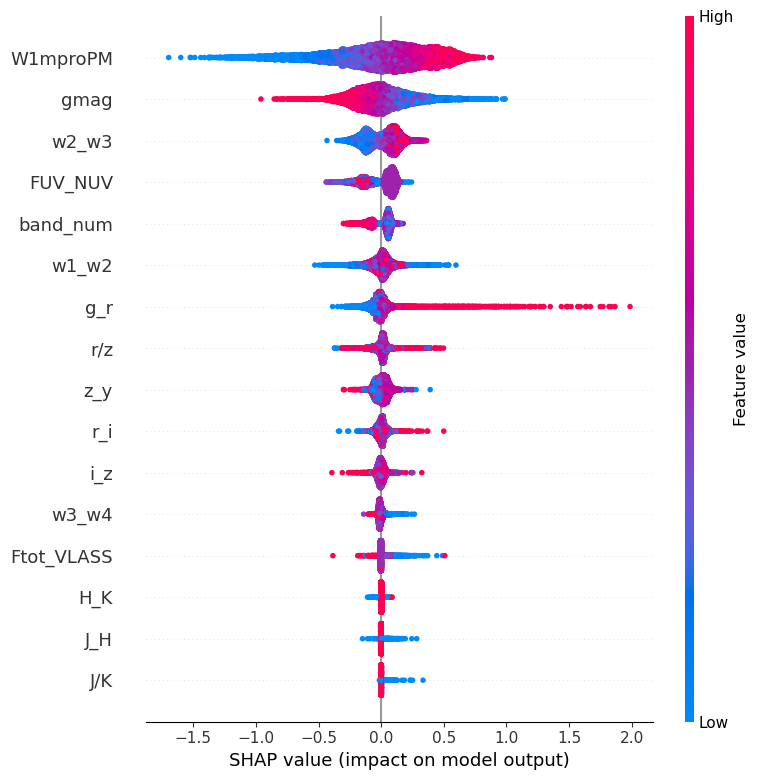

In [133]:
# pyr.interpret_model(final_stacked.named_steps['trained_model'].estimators_[1], plot='summary', feature='log_Z')
pyr.interpret_model(final_stacked.named_steps['trained_model'].estimators_[1], plot='summary', feature='Z')

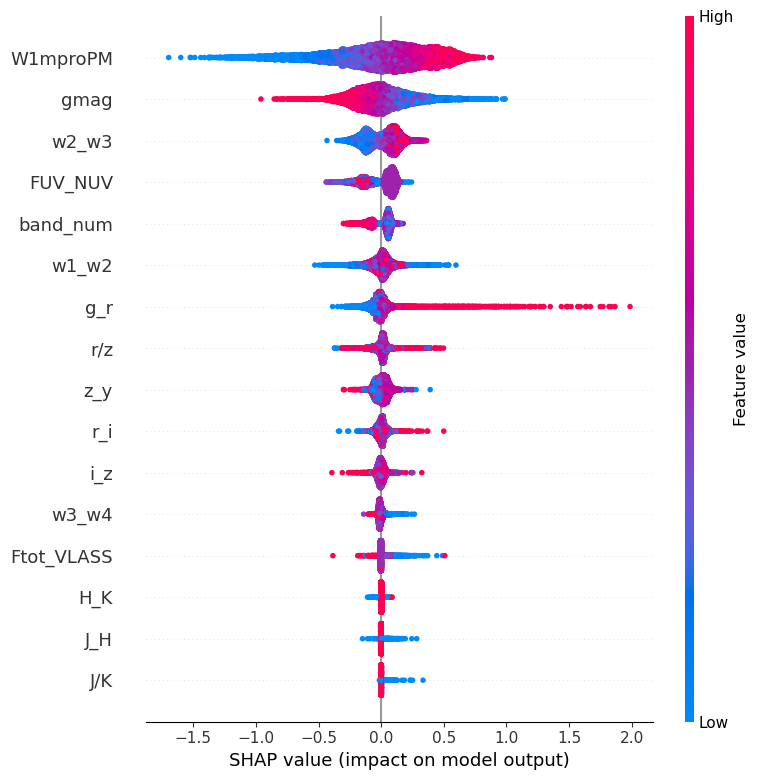

In [134]:
pyr.interpret_model(final_stacked.named_steps['trained_model'].estimators_[1], plot='summary')

In [135]:
# explainer_full   = shap.TreeExplainer(final_stacked.named_steps['trained_model'].final_estimator_, X_train_model)
# shap_values_full = explainer_full(X_train_model, check_additivity=False)

In [136]:
# shap.plots.beeswarm(shap_values_full, max_display=len(X_train_model.columns))

Calculate SHAP values for individual estimators:

In [137]:
# explainers_mini  = {}
# shap_values_mini = {}
# for count, estimator in enumerate(final_stacked.named_steps['trained_model'].estimators_):
#     name_est = final_stacked.named_steps['trained_model'].estimators[count][0]
#     if name_est == 'catboost': continue
#     print(f'Obtaining SHAP values for {name_est}')
#     explainers_mini[name_est]  = shap.TreeExplainer(estimator, X_full_model)
#     shap_values_mini[name_est] = explainers_mini[name_est](X_full_model)
# # explainer_a = shap.TreeExplainer(final_stacked.named_steps['trained_model'].estimators_[3], X_full_model)
# # shap_values_a = explainer_a(X_full_model)

In [138]:
# explainer_2   = shap.TreeExplainer(final_stacked.named_steps['trained_model'].estimators_[2], X_full_model)
# shap_values_2 = explainer_2(X_full_model)

In [139]:
# explainer_3   = shap.TreeExplainer(final_stacked.named_steps['trained_model'].estimators_[3], X_train_model)
# shap_values_3 = explainer_3(X_train_model)

In [140]:
explainer_0   = shap.TreeExplainer(final_stacked.named_steps['trained_model'].estimators_[2], X_train_model)
shap_values_0 = explainer_0(X_train_model, check_additivity=False)

100%|===================| 35292/35382 [02:10<00:00]        

In [141]:
shap_values_0.feature_names

['W1mproPM',
 'Ftot_VLASS',
 'gmag',
 'z_y',
 'w1_w2',
 'w2_w3',
 'w3_w4',
 'J_H',
 'H_K',
 'FUV_NUV',
 'g_r',
 'r_i',
 'i_z',
 'r/z',
 'J/K',
 'band_num']

In [142]:
feature_name_change = {'W1mproPM': 'W1 (CW)', 'W4mag': 'W4 (AW)', 'gmag': 'g', 'ymag': 'y',
                       'FUVmag_GALEX': 'FUV', 'NUVmag_GALEX': 'NUV', 'Kmag': 'Ks', 'z_y': 'z-y',
                       'w1_w2': 'W1-W2 (CW)', 'w2_w3': 'W2-W3 (AW)', 'w3_w4': 'W3-W4 (AW)',
                       'J_H': 'J-H', 'H_K': 'H-K', 'FUV_NUV': 'FUV-NUV', 'r_i': 'r-i', 'g_r': 'g-r',
                       'i_z': 'i-z', 'g_i': 'g-i', 'r/z': 'r/z', 'i/y': 'i/y', 'w1/w3': 'W1/W3',
                       'w2/w4': 'W2/W4', 'J/K': 'J/K', 'FUV/K': 'FUV/K', 'band_num': 'band_num',
                       'Ftot_VLASS': 'F_VLASS'}

In [143]:
new_feat_names = [feature_name_change[feat] for feat in shap_values_0.feature_names]

In [144]:
shap_values_0.feature_names = new_feat_names

In [145]:
# shap.plots.beeswarm(shap_values_0, max_display=len(X_train_model.columns))
shap.plots.beeswarm(shap_values_0, max_display=11, show=False)
plt.tight_layout()
plt.savefig('shap_vals_model_2023.pdf')
plt.close()

In [146]:
shap_values_0.feature_names

['W1 (CW)',
 'F_VLASS',
 'g',
 'z-y',
 'W1-W2 (CW)',
 'W2-W3 (AW)',
 'W3-W4 (AW)',
 'J-H',
 'H-K',
 'FUV-NUV',
 'g-r',
 'r-i',
 'i-z',
 'r/z',
 'J/K',
 'band_num']

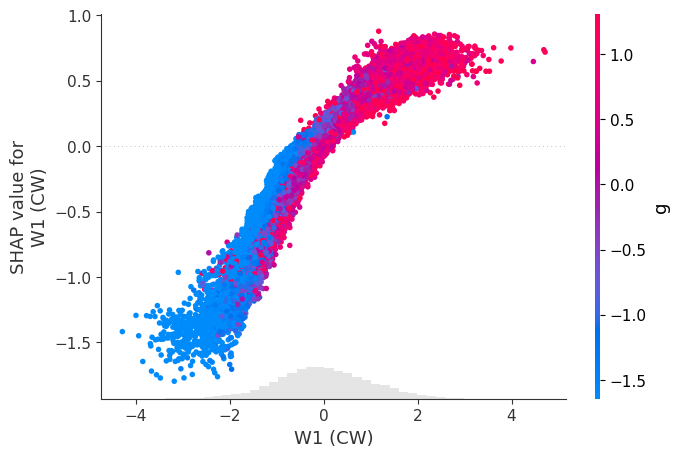

In [147]:
shap.plots.scatter(shap_values_0[:, 'W1 (CW)'], color=shap_values_0)

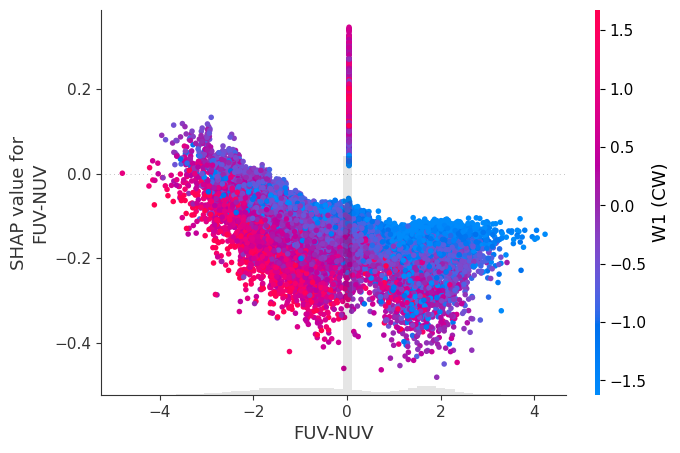

In [148]:
shap.plots.scatter(shap_values_0[:, 'FUV-NUV'], color=shap_values_0)

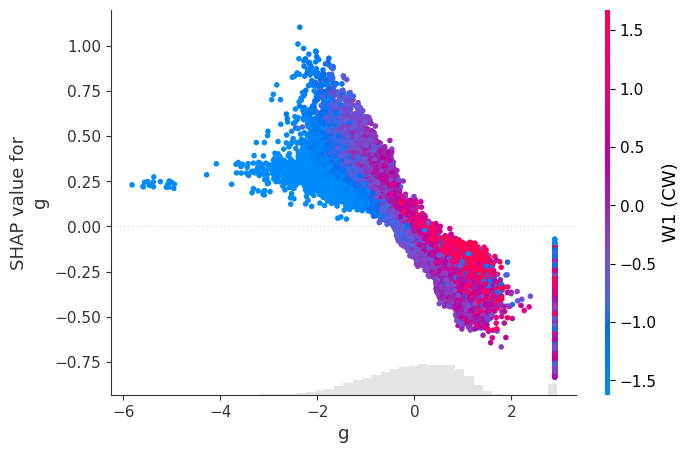

In [149]:
shap.plots.scatter(shap_values_0[:, 'g'], color=shap_values_0)

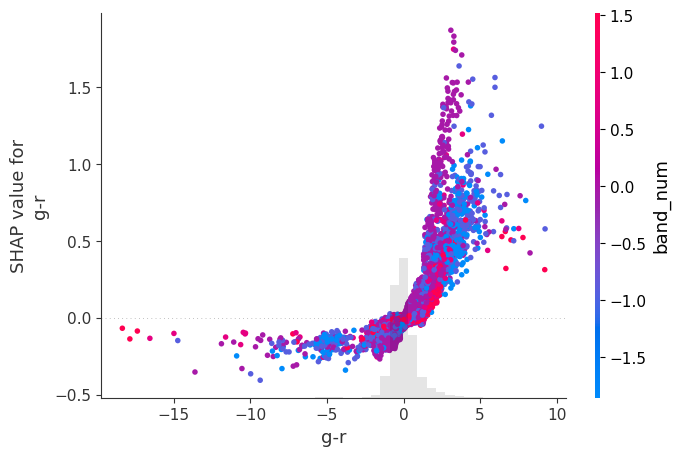

In [150]:
shap.plots.scatter(shap_values_0[:, 'g-r'], color=shap_values_0)

In [151]:
# shap.plots.scatter(shap_values_3[:, 'col_u_g_corr'])

In [152]:
# pyr.interpret_model(final_stacked.named_steps['trained_model'].estimators_[3], feature='col_u_g_corr', plot='correlation', use_train_data=False)

Create DataFrame with only shap values.

In [153]:
shaps_df = pd.DataFrame(data=np.copy(shap_values_0.values), columns=X_train_model.columns)
shaps_high_zero_df = pd.DataFrame(data=np.copy(shap_values_0.values), columns=X_train_model.columns)

In [154]:
with progressbar.ProgressBar(max_value=len(shaps_high_zero_df)) as bar:
    for count in range(len(shaps_high_zero_df)):
        sorted_idxs  = shaps_df.loc[count, :].sort_values().index
        sorted_filts = np.array(shaps_df.loc[count, :].sort_values().cumsum() >= 0).astype(int)
        shaps_high_zero_df.loc[count, sorted_idxs] = sorted_filts
        bar.update(count)

100% (35382 of 35382) |##################| Elapsed Time: 0:00:41 Time:  0:00:41


In [155]:
cols_shap_importance = shaps_high_zero_df.sum(axis=0).sort_values(ascending=False)

Calculate importance for subset. In this case, z > 5

In [156]:
filter_subset      = np.array((10**pyr.get_config('y_train') - 1) > 5.0)
filter_subset_op   = np.array((10**pyr.get_config('y_train') - 1) <= 5.0)
filter_subset_full = np.array(corr_data_df.loc[:, 'Z'] > 5.0)

In [157]:
sub_cols_shap_importance = shaps_high_zero_df.loc[filter_subset].sum(axis=0).sort_values(ascending=False)

In [158]:
sub_cols_shap_importance.index

Index(['W1mproPM', 'FUV_NUV', 'gmag', 'w2_w3', 'w1_w2', 'z_y', 'r/z',
       'band_num', 'r_i', 'g_r', 'i_z', 'w3_w4', 'Ftot_VLASS', 'H_K', 'J/K',
       'J_H'],
      dtype='object')

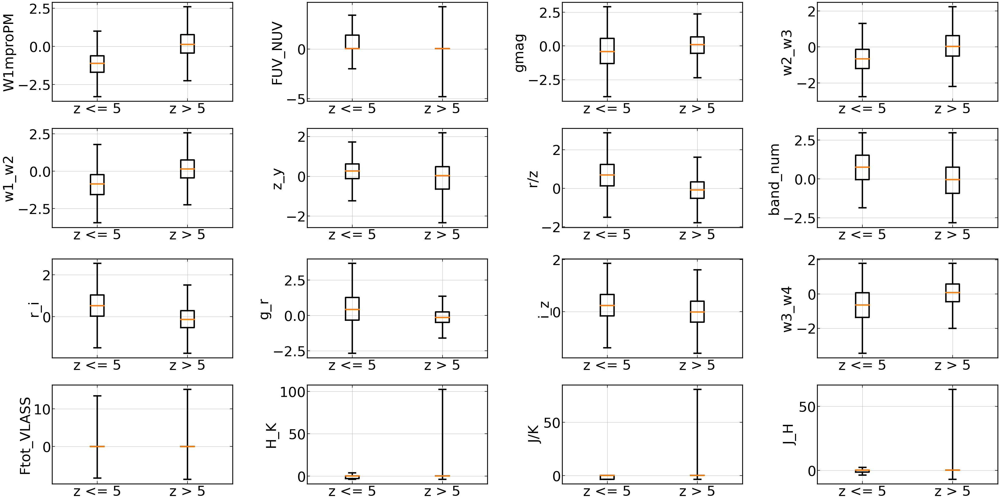

In [159]:
n_cols = 4
n_rows = int(np.ceil((len(sub_cols_shap_importance.index)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.1, wspace=0.1)
axs             = {}

# boxprops_a = dict(linestyle='--', linewidth=3, color='darkgoldenrod')
boxprops_a = dict(linewidth=4)
boxprops_b = dict(linewidth=4)

for count, used_col in enumerate(sub_cols_shap_importance.index):
    axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # if count == 0:
    #     axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # elif count != 0:
    #     axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # print(used_cols)
    # print(new_band)
    # used_col_clean = used_col
    # if used_col.endswith('_0') or used_col.endswith('_1'):
    #     used_col_clean = used_col[:-2]
    if 'Flux' not in used_col:
        sc_p_a = axs[count].boxplot(X_train_model.loc[~filter_subset, used_col], labels=['z <= 5'],\
                                    showfliers=False, positions=[0.0], boxprops=boxprops_a,\
                                    whiskerprops=boxprops_a, capprops=boxprops_a,\
                                    medianprops=boxprops_a, autorange=True)
        sc_p_b = axs[count].boxplot(X_train_model.loc[filter_subset, used_col], labels=['z > 5'],\
                                    showfliers=False, positions=[1.0], boxprops=boxprops_b,\
                                    whiskerprops=boxprops_b, capprops=boxprops_b,\
                                    medianprops=boxprops_b, autorange=True)
    elif 'Flux' in used_col:
        sc_p_a = axs[count].boxplot(np.log10(X_train_model.loc[~filter_subset, used_col]), labels=['z <= 5'],\
                                    showfliers=False, positions=[0.0], boxprops=boxprops_a,\
                                    whiskerprops=boxprops_a, capprops=boxprops_a,\
                                    medianprops=boxprops_a, autorange=True)
        sc_p_b = axs[count].boxplot(np.log10(X_train_model.loc[filter_subset, used_col]), labels=['z > 5'],\
                                    showfliers=False, positions=[1.0], boxprops=boxprops_b,\
                                    whiskerprops=boxprops_b, capprops=boxprops_b,\
                                    medianprops=boxprops_b, autorange=True)
    # axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # if count % n_cols == 0:
    if 'Flux' not in used_col:
        axs[count].set_ylabel(used_col, fontsize=40)
    elif 'Flux' in used_col:
        axs[count].set_ylabel(f'log({used_col})', fontsize=40)
    # axs[count].set_xlabel(used_col, fontsize=30)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=40)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5, labelsize=20)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    # if 'Flux' in used_col:
    #     axs[count].set_yscale('log')
    axs[count].grid(zorder=0)
    # if count % n_cols != 0:
    #     plt.setp(axs[count].get_yticklabels(), visible=False)
    # axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
    #                      xycoords='axes fraction', fontsize=18, ha='center', va='top', path_effects=pe2)

# fig.supxlabel('Predicted z', fontsize=30)
# fig.supylabel('True z', fontsize=30)

#fig.tight_layout()

Running dtypes
Running imputer
Running new_levels1
Running new_levels
Running feature_time
Running scaling
Running P_transform
Running dummy
Running fix_perfect
Running clean_names
--------------------
top features:
Feature	Importance
w1_w2	103.678
g_r	101.396
W1mproPM	99.708
gmag	93.109
r/z	76.686
w2_w3	58.720
z_y	51.704
r_i	42.993
FUV_NUV	40.708
i_z	38.345
w3_w4	26.302
band_num	17.530
Ftot_VLASS	12.660
H_K	4.385
J_H	4.038
J/K	3.537


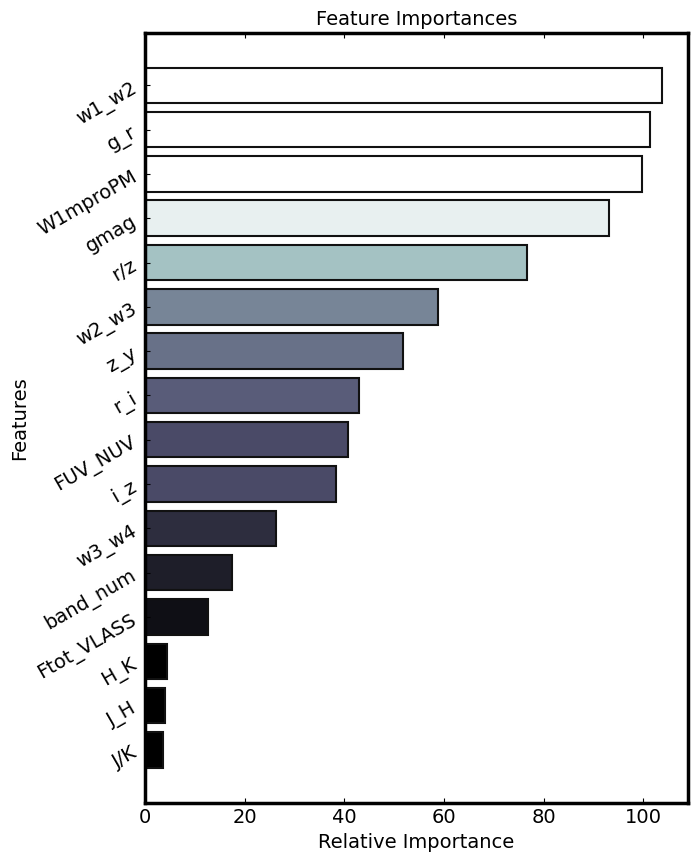

In [160]:
# plot feature importances of last model, if applicable
try:
    fig         = plt.figure(figsize=(7,10))
    ax1         = fig.add_subplot(111)
    n_top       = len(pyr.get_config('X').columns)
    features_df = get_feature_importances_df(final_stacked, data_norm_unseen_df, n=n_top)
    features    = features_df.loc[:, 'Feature'].to_list()
    importances = features_df.loc[:, 'Importance'].to_list()
    import_scal = (importances - np.nanmin(importances)) / (np.nanmax(importances) - np.nanmin(importances))
    # indices     = np.argsort(importances)[-n_top:] #only show most important features
    # indices     = np.argsort(importances)
    # ax1.set_title(f'{model_name} Feature Importances', size=14)
    ax1.set_title('Feature Importances', size=14)
    ax1.barh(range(len(importances)), importances,\
             color=plt.get_cmap('bone', len(importances))(import_scal), align='center', ec='k', lw=1.5)
    # plt.yticks(range(len(importances)), [features[i] for i in importances])
    plt.yticks(range(len(importances)), features)
    ax1.set_xlabel('Relative Importance', size=14)
    ax1.set_ylabel('Features', size=14)
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.tick_params(axis='y', which='major', rotation=30)
    plt.setp(ax1.spines.values(), linewidth=2.5)
    ax1.tick_params(which='both',top=True, right=False, direction='in')
    # ax1.set_xscale('log')
    # plt.show()

    print('-' * 20)
    print('top features:')
    print('Feature\tImportance')
    for feat, imp in zip(reversed(features), reversed(importances)):
        print(f'{feat}\t{round(imp, 3):>.3f}')

except:
    print('learning algorithm does not provide feature importance.')

Predict values.

In [161]:
unseen_predictions = pyr.predict_model(final_stacked, data=data_norm_unseen_df)
# unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2464,0.1597,0.3996,0.7176,0.1544,0.2432


In [162]:
full_predictions = pyr.predict_model(final_stacked, data=norm_corr_data_df)  # Train + Test + Validation
# unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,1.1042,1.6940,1.3015,-1.9463,0.5793,0.8865


In [163]:
target_feat = 'Z'  # 'Z', 'log_Z'

unseen_predictions[[target_feat, 'Label']].describe()


,Z,Label
count,5616.000000,5616.000000
mean,1.568619,1.554086
std,0.752013,0.647032
min,0.008000,0.057200
25%,1.038000,1.108788
50%,1.549000,1.593200
75%,2.061250,1.999662
max,5.800000,3.957050


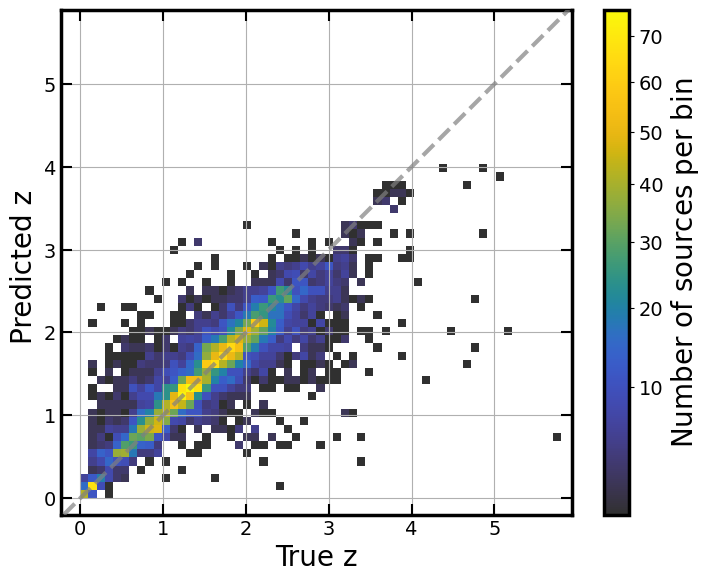

In [314]:
# visualize the embedding
fig             = plt.figure(figsize=(7.3,6))
ax1             = fig.add_subplot(111)

filter_good_vals = np.isfinite(unseen_predictions.loc[:, 'Z']) & np.isfinite(unseen_predictions.loc[:, 'Label'])
max_z = np.nanmax([unseen_predictions.loc[filter_good_vals, 'Z'], 
                                unseen_predictions.loc[filter_good_vals, 'Label']])
bin_space = np.linspace(0, max_z, 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))  
_, _, _, hist_sources_lin_z = ax1.hist2d(unseen_predictions.loc[filter_good_vals, 'Z'],
                                   unseen_predictions.loc[filter_good_vals, 'Label'],
                                   bins=(bin_space, bin_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)

cbar = fig.colorbar(hist_sources_lin_z, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

ax1.set_xlabel('True z', fontsize=20)
ax1.set_ylabel('Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=np.round(max_z, decimals=0))
ax1.set_ylim(bottom=-0.3, top=np.round(max_z, decimals=0))
# ax1.set_xlim(left=-0.3, right=1.0)
# ax1.set_ylim(bottom=-0.3, top=1.0)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

In [165]:
np.sum(np.array(unseen_predictions.loc[:, 'Z'] < 10))

5616

In [166]:
np.sum(np.array(unseen_predictions.loc[:, 'Label'] < 10))

5616

In [167]:
from matplotlib import ticker

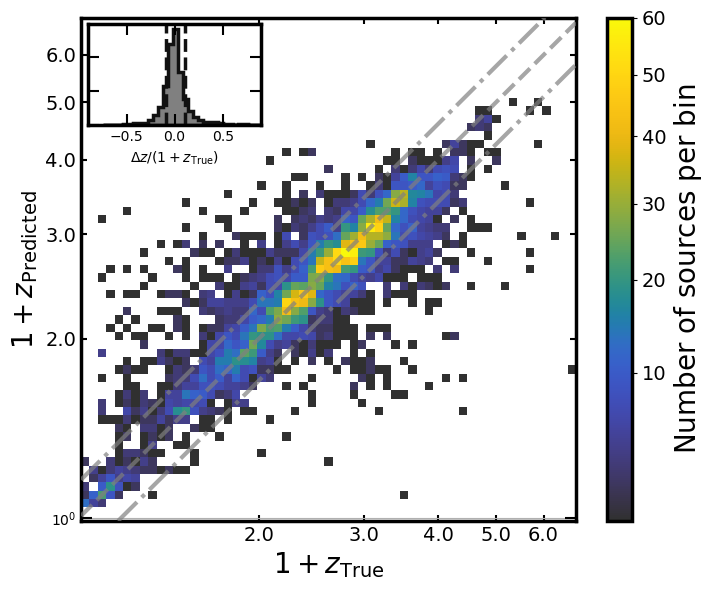

In [313]:
# visualize the embedding
fig             = plt.figure(figsize=(7.3,6))
ax1             = fig.add_subplot(111, xscale='log', yscale='log')

filter_good_vals = np.isfinite(1 + unseen_predictions.loc[:, 'Z']) & np.isfinite(1 + unseen_predictions.loc[:, 'Label'])
min_log_z = np.log10(np.nanmin([1 + unseen_predictions.loc[filter_good_vals, 'Z'], 
                                1 + unseen_predictions.loc[filter_good_vals, 'Label']]))
max_log_z = np.log10(np.nanmax([1 + unseen_predictions.loc[filter_good_vals, 'Z'], 
                                1 + unseen_predictions.loc[filter_good_vals, 'Label']]))
bin_space = np.logspace(min_log_z, max_log_z, 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))
_, _, _, hist_sources_lin_z = ax1.hist2d(1+ unseen_predictions.loc[filter_good_vals, 'Z'],
                                   1 + unseen_predictions.loc[filter_good_vals, 'Label'],
                                   bins=(bin_space, bin_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

ax1.axline((2., 2.), (3., 3.), ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 1.15), xy2=(2., 2.3), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 0.85), xy2=(2., 1.7), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)

cbar = fig.colorbar(hist_sources_lin_z, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

######
axins = inset_axes(ax1, width='35%', height='20%', loc=2)
res_z_z = (unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z'])
axins.hist(res_z_z, histtype='stepfilled', fc='grey', ec='k', bins=50, lw=2.5)

axins.axvline(x=np.percentile(res_z_z, [15.9]), ls='--', lw=2.5, c='k')
axins.axvline(x=np.percentile(res_z_z, [84.1]), ls='--', lw=2.5, c='k')

axins.set_xlabel('$\Delta z / (1 + z_{\mathrm{True}})$', fontsize=10)
# axins.set_ylabel('Frequency', fontsize=20)
axins.tick_params(labelleft=False, labelbottom=True)
axins.tick_params(which='both', top=True, right=True, direction='in')
axins.tick_params(axis='both', which='major', labelsize=10)
axins.tick_params(which='major', length=8, width=1.5)
axins.tick_params(which='minor', length=4, width=1.5)
plt.setp(axins.spines.values(), linewidth=2.5)
plt.setp(axins.spines.values(), linewidth=2.5)
# ax1.grid(zorder=-10)
axins.set_xlim(left=-0.9, right=0.9)
# axins.figure.set_facecolor('b')
######

ax1.set_xlabel('$1 + z_{\mathrm{True}}$', fontsize=20)
ax1.set_ylabel('$1 + z_{\mathrm{Predicted}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='minor', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.xaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
ax1.yaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=10**(max_log_z))
ax1.set_ylim(bottom=-0.3, top=10**(max_log_z))
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

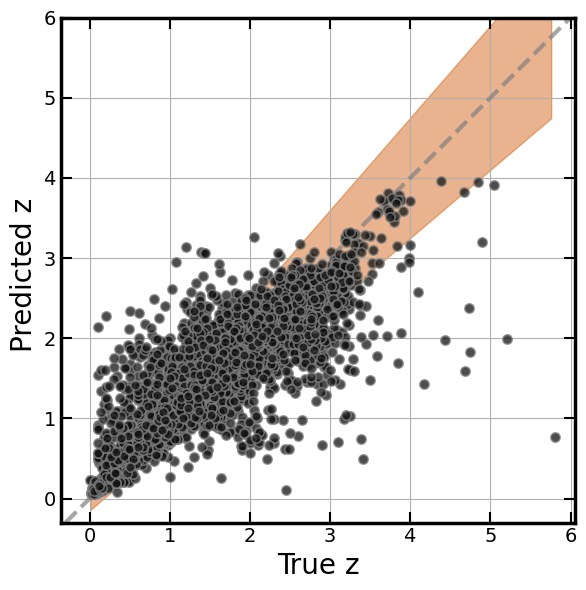

In [169]:
# visualize the embedding
fig             = plt.figure(figsize=(6,6))
ax1             = fig.add_subplot(111)

x_range = np.arange(unseen_predictions.loc[:, 'Z'].min(), unseen_predictions.loc[:, 'Z'].max(), 0.05)
ax1.scatter(unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
            c='k', s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10)
ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

pred_limit_h = 1.15 * x_range + 0.15
pred_limit_l = 0.85 * x_range - 0.15
ax1.fill_between(x=x_range, y1=pred_limit_l, y2=pred_limit_h, alpha=0.5, color='chocolate')

ax1.set_xlabel('True z', fontsize=20)
ax1.set_ylabel('Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=6.0)
ax1.set_ylim(bottom=-0.3, top=6.0)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

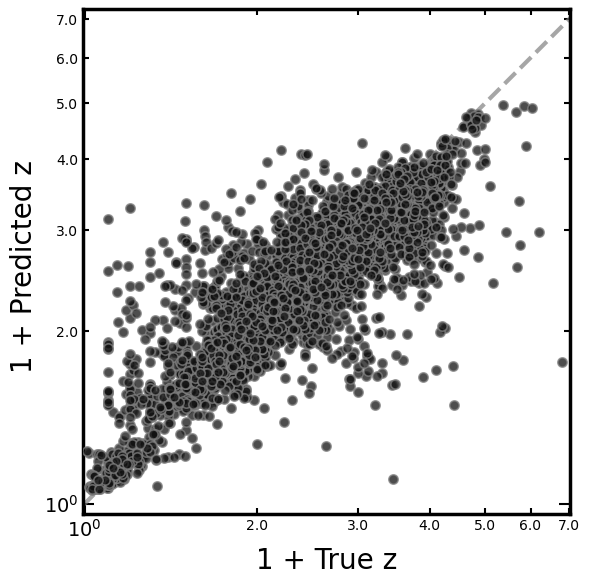

In [170]:
# visualize the embedding
fig             = plt.figure(figsize=(6,6))
ax1             = fig.add_subplot(111, xscale='log', yscale='log')

x_range = np.arange(unseen_predictions.loc[:, 'Z'].min(), unseen_predictions.loc[:, 'Z'].max(), 0.05)
ax1.scatter((1 + unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed)),\
            (1 + unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed)),\
            c='k', s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10)
ax1.axline((2., 2.), (3., 3.), ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
# ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

pred_limit_h = 1.15 * x_range + 0.15
pred_limit_l = 0.85 * x_range - 0.15
# ax1.fill_between(x=x_range, y1=pred_limit_l, y2=pred_limit_h, alpha=0.5, color='chocolate')

ax1.set_xlabel('1 + True z', fontsize=20)
ax1.set_ylabel('1 + Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.xaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
ax1.yaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
ax1.set_xlim(left=1.0, right=7.0)
ax1.set_ylim(bottom=1.0, top=7.0)
# ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

In [171]:
# plt.get_cmap(shap.plots.colors.red_blue, 3)

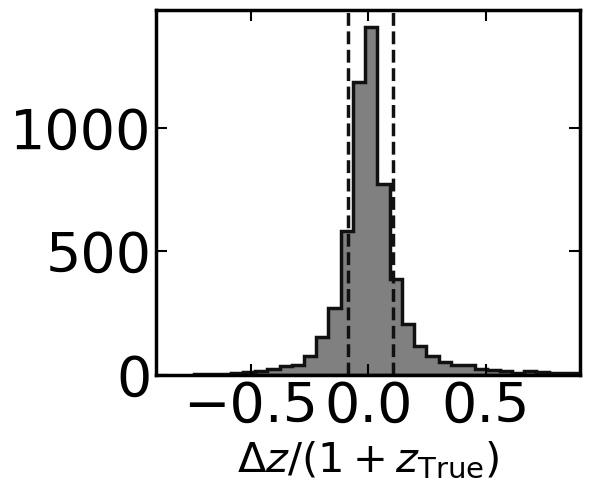

In [172]:
# visualize the prediction errors
fig             = plt.figure(figsize=(6,5))
ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')

# x_range = np.arange(unseen_predictions.loc[:, 'Z'].min(), unseen_predictions.loc[:, 'Z'].max(), 0.05)
# ax1.scatter((1 + unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed)),\
#             (1 + unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed)),\
#             c='k', s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10)
# ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

# res_z_z = (unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z'])
res_z_z = (unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z'])
ax1.hist(res_z_z, histtype='stepfilled', fc='grey', ec='k', bins=50, lw=2.5)

ax1.axvline(x=np.percentile(res_z_z, [15.9]), ls='--', lw=2.5, c='k')
ax1.axvline(x=np.percentile(res_z_z, [84.1]), ls='--', lw=2.5, c='k')

# ax1.set_xlabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=20)
ax1.set_xlabel('$\Delta z / (1 + z_{\mathrm{True}})$', fontsize=30)
# ax1.set_ylabel('Frequency', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=40)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
# ax1.grid(zorder=-10)
ax1.set_xlim(left=-0.9, right=0.9)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

In [173]:
z_score_pred = z_score_abs(unseen_predictions.loc[:, 'Z'], (10**unseen_predictions.loc[:, 'Label'] - 1))

In [174]:
print(f'Redshift score is |z_pred - z_true| / (1 + z_true) = {z_score_pred:.3f}')

Redshift score is |z_pred - z_true| / (1 + z_true) = 14.110


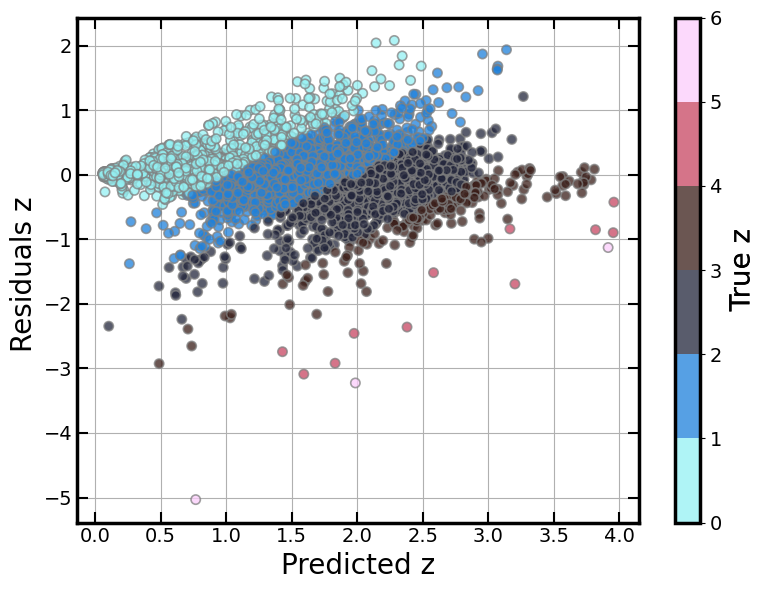

In [175]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

norm_z = mcolors.Normalize(vmin=0, vmax=6)
x_range = np.arange(unseen_predictions.loc[:, 'Label'].min(),\
                    unseen_predictions.loc[:, 'Label'].max(), 0.05)

sc_p = ax1.scatter(unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
            (unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed) -\
             unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed)),\
            c=unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10, cmap=plt.get_cmap('cmr.redshift', 6),\
                   norm=norm_z)

pred_limit = 0.15 * (1 + x_range)
# ax1.fill_between(x=x_range, y1=-pred_limit, y2=pred_limit, alpha=0.5, color='chocolate')

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=20, path_effects=pe2)

ax1.set_xlabel('Predicted z', fontsize=20)
ax1.set_ylabel('Residuals z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

In [176]:
# Catastrophic outlier fraction
# z_delt = np.abs(((10**unseen_predictions.loc[:, 'Label'] - 1) - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
z_delt = np.abs((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
n_out  = np.array(z_delt > 0.15)
f_out  = np.sum(n_out) / len(n_out)

In [177]:
print(f'Catastrophic outlier fraction: {f_out:.4f}')

Catastrophic outlier fraction: 0.1882


In [178]:
# Catastrophic outlier fraction
z_delt = np.abs((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
n_out_hil  = np.array(z_delt > 0.15)  # Hildebrandt+2010
n_out_heng = np.array(z_delt > 0.20)  # Henghes+2021
n_out_bern_def = np.array((z_delt * (1 + unseen_predictions.loc[:, 'Z'])) > 1.)  # Bernstain&Huteres+2010
f_out_hil  = np.sum(n_out_hil) / len(n_out_hil)
f_out_heng = np.sum(n_out_heng) / len(n_out_heng)
f_out_bern_def = np.sum(n_out_bern_def) / len(n_out_bern_def)
n_out_bern = np.array(np.abs(np.log((1 + unseen_predictions.loc[:, 'Label']) / (1 + unseen_predictions.loc[:, 'Z']))) > 0.2)
f_out_bern = np.sum(n_out_bern) / len(n_out_bern)

Different definitions for (catastrophic) outliers fraction.

Outlier fraction from Ilbert et al, 2006, and Hildebrant et al., 2010:  

$$
O_{I+06} = \frac{1}{N_{total}} N \left[ \left( \frac{|z_{pred} - z_{true}|}{1 + z_{true}} \right) > 0.15 \right]
$$

**Catastrophic** outlier fraction as defined in Bernstein & Huteres, 2010:  

$$
O_{B+10} = \frac{1}{N_{total}} N \left[ |z_{pred} - z_{true}| > 1.00 \right]
$$

**Catastrophic** outlier fraction derived in Bernstein & Huteres, 2010:  

$$
O_{B+20_{def}} = \frac{1}{N_{total}} N \left[ \left| \ln{\frac{1 + z_{pred}}{1 + z_{true}}} \right| > 0.20 \right]
$$

Outlier fraction as defined in Henghes et al., 2021:  

$$
O_{H+21} = \frac{1}{N_{total}} N \left[ |z_{pred} - z_{true}| > 0.20 \right]
$$

In [179]:
print(f'Outlier fraction: O(I+06) = {(f_out_hil * 100):.3f} %')
print(f'Outlier fraction: O(H+21) = {(f_out_heng * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+10) =  {(f_out_bern * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+20def) = {(f_out_bern_def * 100):.3f} %')

Outlier fraction: O(I+06) = 18.821 %
Outlier fraction: O(H+21) = 12.286 %
Catastrophic outlier fraction: O(B+10) =  12.411 %
Catastrophic outlier fraction: O(B+20def) = 3.526 %


Extra metrics, as defined in Henghes et al., 2021.

In [180]:
MSE      = np.nansum((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z'])**2) /\
           len(unseen_predictions.loc[:, 'Z'])
MAE      = np.nansum(np.abs(unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z'])) /\
           len(unseen_predictions.loc[:, 'Z'])
R2       = 1 - np.nansum((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z'])**2) /\
           np.nansum((unseen_predictions.loc[:, 'Label'] - np.nanmean(unseen_predictions.loc[:, 'Z']))**2)
Bias     = np.nanmean((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']), axis=0)
Prec     = 1.48 * np.nanmedian(np.abs((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) /\
                                      (1 + unseen_predictions.loc[:, 'Z'])))
out_frac = np.sum(np.array(np.abs(unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) > 0.10)) /\
           len(unseen_predictions.loc[:, 'Z'])

In [181]:
print(f'MSE = {MSE:.3f}')

MSE = 0.160


In [182]:
print(f'MAE = {MAE:.3f}')

MAE = 0.246


In [183]:
print(f'R2 = {R2:.3f}')

R2 = 0.619


In [184]:
print(f'Bias = {Bias:.3f}')

Bias = -0.015


In [185]:
print(f'Precision = {Prec:.3f}')

Precision = 0.085


In [186]:
print(f'Outlier Fraction = {out_frac:.3f}')

Outlier Fraction = 0.610


Different way (latest) of presenting results for validation (unseen) set.

In [187]:
val_mae   = skmet.mean_absolute_error(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
val_mse   = skmet.mean_squared_error(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'], squared=True)
val_rmse  = skmet.mean_squared_error(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'], squared=False)
val_R2    = skmet.r2_score(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
val_rmsle = np.sqrt(skmet.mean_squared_log_error(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label']))
# val_mape  = skmet.mean_absolute_percentage_error(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])  # sklearn 0.24
val_mape  = np.mean(np.abs((unseen_predictions.loc[:, 'Z'] - unseen_predictions.loc[:, 'Label']) / unseen_predictions.loc[:, 'Z']))
val_z_met = z_score_abs(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])

In [188]:
print('Results from HETDEX validation set')
print(f'MAE:\t{val_mae:.4f}')
print(f'MSE:\t{val_mse:.4f}')
print(f'RMSE:\t{val_rmse:.4f}')
print(f'R2:\t{val_R2:.4f}')
print(f'RMSLE:\t{val_rmsle:.4f}')
print(f'MAPE:\t{val_mape:.4f}')
print(f'z_met:\t{val_z_met:.4f}')

Results from HETDEX validation set
MAE:	0.2464
MSE:	0.1597
RMSE:	0.3996
R2:	0.7176
RMSLE:	0.1544
MAPE:	0.2432
z_met:	0.0572


In [189]:
# Catastrophic outlier fraction
# z_delt = np.abs(((10**unseen_predictions.loc[:, 'Label'] - 1) - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
z_delt_val = np.abs((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
n_out_val  = np.array(z_delt_val > 0.15)
f_out_val  = np.sum(n_out_val) / len(n_out_val)
print(f'Catastrophic outlier fraction: {f_out_val:.4f}')

Catastrophic outlier fraction: 0.1882


In [190]:
n_out_hil_val  = np.array(z_delt_val > 0.15)  # Hildebrandt+2010
n_out_heng_val = np.array(z_delt_val > 0.20)  # Henghes+2021
n_out_bern_def_val = np.array((z_delt_val * (1 + unseen_predictions.loc[:, 'Z'])) > 1.)  # Bernstain&Huteres+2010
f_out_hil_val  = np.sum(n_out_hil_val) / len(n_out_hil_val)
f_out_heng_val = np.sum(n_out_heng_val) / len(n_out_heng_val)
f_out_bern_def_val = np.sum(n_out_bern_def_val) / len(n_out_bern_def_val)
n_out_bern_val = np.array(np.abs(np.log((1 + unseen_predictions.loc[:, 'Label']) / (1 + unseen_predictions.loc[:, 'Z']))) > 0.2)
f_out_bern_val = np.sum(n_out_bern_val) / len(n_out_bern_val)

In [191]:
print(f'Outlier fraction: O(I+06) = {(f_out_hil_val * 100):.3f} %')
print(f'Outlier fraction: O(H+21) = {(f_out_heng_val * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+10) =  {(f_out_bern_val * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+20def) = {(f_out_bern_def_val * 100):.3f} %')

Outlier fraction: O(I+06) = 18.821 %
Outlier fraction: O(H+21) = 12.286 %
Catastrophic outlier fraction: O(B+10) =  12.411 %
Catastrophic outlier fraction: O(B+20def) = 3.526 %


In [192]:
Bias_val     = np.nanmean((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']), axis=0)
Prec_val     = 1.48 * np.nanmedian(np.abs((unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) /\
                                      (1 + unseen_predictions.loc[:, 'Z'])))
out_frac_val = np.sum(np.array(np.abs(unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) > 0.10)) /\
           len(unseen_predictions.loc[:, 'Z'])

In [193]:
print(f'Bias = {Bias_val:.3f}')
print(f'Precision = {Prec_val:.3f}')
print(f'Outlier Fraction = {out_frac_val:.3f}')

Bias = -0.015
Precision = 0.085
Outlier Fraction = 0.610


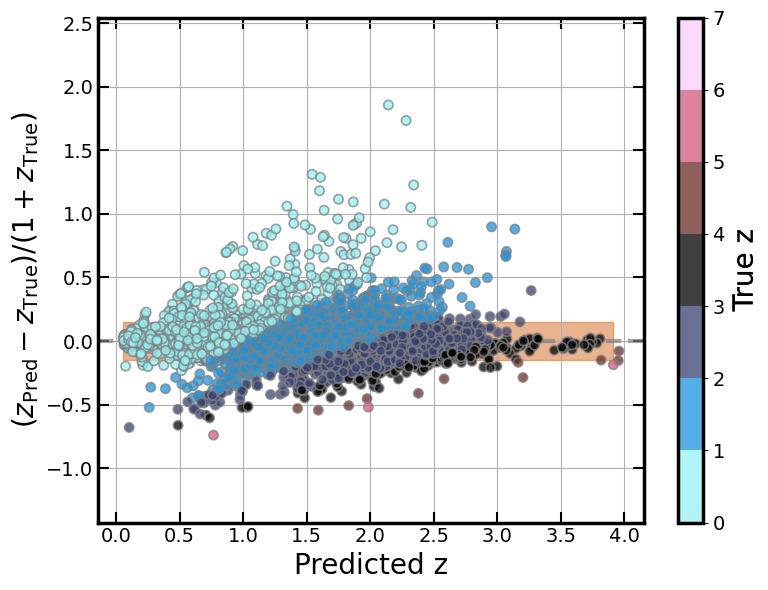

In [194]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

norm_z = mcolors.Normalize(vmin=0, vmax=7)
x_range = np.arange(unseen_predictions.loc[:, 'Label'].min(),\
                    unseen_predictions.loc[:, 'Label'].max(), 0.05)

res_z_z         = (unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z'])
sc_p = ax1.scatter(unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
                   res_z_z.sample(frac=1, random_state=seed),\
            c=unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=plt.get_cmap('cmr.redshift', 7), zorder=10, norm=norm_z)
ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
ax1.fill_between(x=x_range, y1=-0.15, y2=0.15, alpha=0.5, color='chocolate')

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=20, path_effects=pe2)

ax1.set_xlabel('Predicted z', fontsize=20)
ax1.set_ylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

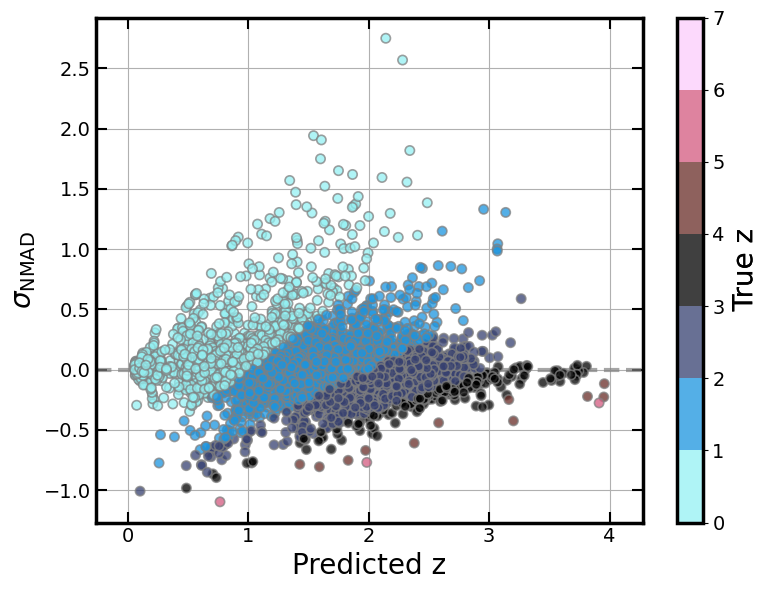

In [195]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

norm_z = mcolors.Normalize(vmin=0, vmax=7)

delt_z      = unseen_predictions.loc[:, 'Label'] - unseen_predictions.loc[:, 'Z']
res_z_z     = delt_z / (1 + unseen_predictions.loc[:, 'Z'])
med_delt    = delt_z.median(axis=0)
sigma_nmad  = 1.4826 * (delt_z - med_delt) / (1 + unseen_predictions.loc[:, 'Z'])
sc_p = ax1.scatter(unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
                   sigma_nmad.sample(frac=1, random_state=seed),\
            c=unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=plt.get_cmap('cmr.redshift', 7), zorder=10, norm=norm_z)
ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=20, path_effects=pe2)

ax1.set_xlabel('Predicted z', fontsize=20)
ax1.set_ylabel('$\sigma_{\mathrm{NMAD}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

Plot an array of figures of predicted vs residual redshifts.  
Each panel shows the prediction with an increasing number of features.

In [196]:
features_df

,Feature,Importance
0,J/K,3.537170
1,J_H,4.038479
2,H_K,4.384822
3,Ftot_VLASS,12.660147
4,band_num,17.529739
5,w3_w4,26.302458
6,i_z,38.345131
7,FUV_NUV,40.708340
8,r_i,42.992857
9,z_y,51.704099


In [197]:
unique_cols_imp = pd.Series()

In [198]:
# used_cols_test    = []
for idx, row in features_df.iterrows():
    if row['Feature'].endswith(('_0', '_1', '_2', '_3')):
        col_name = row['Feature'][:-2]
        if col_name not in unique_cols_imp.index:
            unique_cols_imp[col_name] = row['Importance']
        elif col_name in unique_cols_imp.index:
            unique_cols_imp[col_name] = unique_cols_imp[col_name] + row['Importance']
        continue
    elif row['Feature'].endswith(('_0.0', '_1.0', '_2.0', '_3.0')):
        col_name = row['Feature'][:-4]
        if col_name not in unique_cols_imp.index:
            unique_cols_imp[col_name] = row['Importance']
        elif col_name in unique_cols_imp.index:
            unique_cols_imp[col_name] = unique_cols_imp[col_name] + row['Importance']
        continue
    else:
        col_name = row['Feature']
        unique_cols_imp[col_name] = row['Importance']
# used_cols_test_df = pd.Index(np.unique(used_cols_test))

In [199]:
unique_cols_imp = unique_cols_imp.sort_values(ascending=False)

In [200]:
unique_cols_str = ['None'] + list(unique_cols_imp.index)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.8640,1.1289,1.0625,-0.9966,0.4326,0.7999


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,1.0005,1.4856,1.2189,-1.6275,0.5294,0.7165


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.9929,1.4312,1.1963,-1.5311,0.5189,0.8339


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.7287,0.8476,0.9206,-0.4990,0.3817,1.3290


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4795,0.3916,0.6258,0.3074,0.2624,0.8351


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4434,0.3333,0.5773,0.4106,0.2409,0.6955


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4068,0.2930,0.5413,0.4818,0.2242,0.6546


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3956,0.2801,0.5293,0.5046,0.2166,0.6061


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3801,0.2663,0.5161,0.5290,0.2059,0.5160


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3773,0.2563,0.5062,0.5467,0.2106,0.5511


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3700,0.2476,0.4976,0.5620,0.2060,0.5271


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3757,0.2530,0.5030,0.5526,0.2095,0.5454


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3454,0.2238,0.4731,0.6042,0.1932,0.4171


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2804,0.1759,0.4194,0.6889,0.1670,0.3172


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2682,0.1696,0.4119,0.7000,0.1636,0.2904


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2638,0.1670,0.4087,0.7046,0.1619,0.2860


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2464,0.1597,0.3996,0.7176,0.1544,0.2432


Text(0.02, 0.5, '$(z_{\\mathrm{Pred}} - z_{\\mathrm{True}}) / (1 + z_{\\mathrm{True}})$')

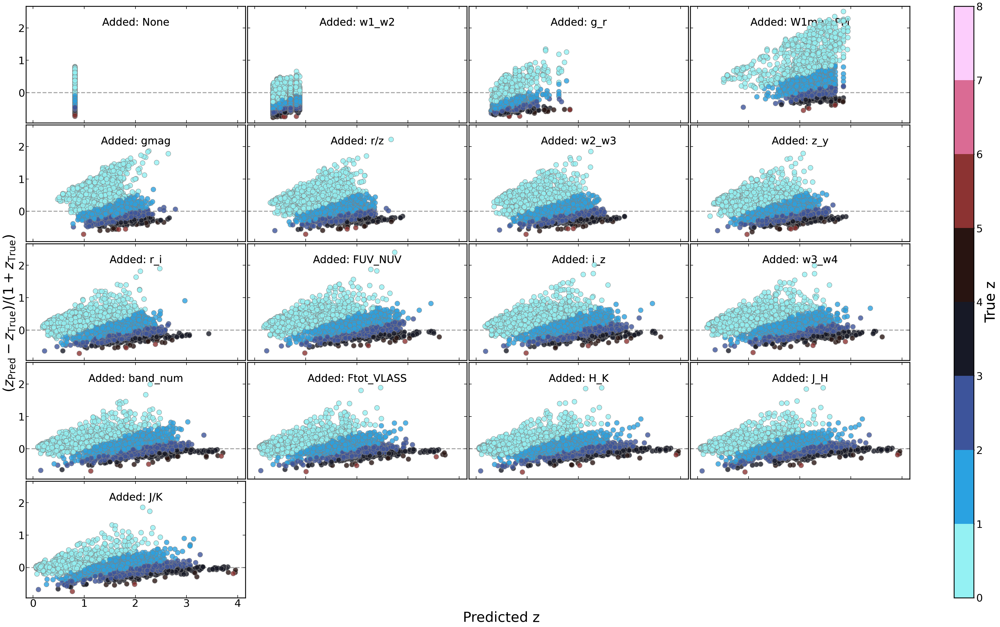

In [201]:
n_cols = 4
n_rows = int(np.ceil((len(unique_cols_str)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.0, wspace=0.0)
axs             = {}
norm_z = mcolors.Normalize(vmin=0, vmax=8)

for count in range(len(unique_cols_str)):
    if count == 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    elif count != 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)], sharex=axs[0], sharey=axs[0])
    used_cols  = unique_cols_imp.index[count:]
    # print(used_cols)
    # print(new_band)
    tmp_data_norm_unseen    = data_norm_unseen_df.copy()
    tmp_data_norm_unseen.loc[:, used_cols] = np.nan
    tmp_unseen_predictions  = pyr.predict_model(final_stacked, data=tmp_data_norm_unseen)
    res_z_z         = (tmp_unseen_predictions.loc[:, 'Label'] - tmp_unseen_predictions.loc[:, 'Z']) / (1 + tmp_unseen_predictions.loc[:, 'Z'])
    sc_p = axs[count].scatter(tmp_unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
                       res_z_z.sample(frac=1, random_state=seed),\
                       c=tmp_unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
                       s=200, ec='Gray', alpha=0.8, lw=1.2, cmap=plt.get_cmap('cmr.redshift', 8), norm=norm_z, zorder=10)
    axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # if count % n_cols == 0:
    #     axs[count].set_ylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=22)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=30)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    ax1.grid(zorder=0)
    if count % n_cols != 0:
        plt.setp(axs[count].get_yticklabels(), visible=False)
    if np.ceil((count + 1) / n_cols) != n_rows:
        plt.setp(axs[count].get_xticklabels(), visible=False)
    axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
                         xycoords='axes fraction', fontsize=30, ha='center', va='top', path_effects=pe2)

clb            = plt.colorbar(cm.ScalarMappable(norm=norm_z,\
                                                cmap=cm.get_cmap('cmr.redshift', 8)),\
                              ax=[axs[key] for key in axs], fraction=.09, aspect=30)
clb.ax.tick_params(labelsize=30)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=40, path_effects=pe2)

fig.supxlabel('Predicted z', fontsize=40)
fig.supylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=40)

#fig.tight_layout()

In [202]:
# unseen_s8_preds = pyr.predict_model(final_catboost, data=stripe82_test_df)

In [203]:
# unseen_s8_preds[['Z', 'Label']].describe()

In [204]:
# fig             = plt.figure(figsize=(5,5))
# ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
# 
# norm_r          = MidpointNormalize(midpoint=1.0)
# 
# sc_p = ax1.scatter(unseen_s8_preds['Z'], unseen_s8_preds['Label'],\
#                    c='Gray', cmap='coolwarm', s=85, ec='k',\
#                    norm=norm_r, plotnonfinite=True, alpha=0.85, lw=2)
# 
# ax1.tick_params(which='both', top=True, right=True, direction='in')
# ax1.tick_params(axis='both', which='major', labelsize=14)
# ax1.tick_params(which='major', length=8, width=1.5)
# ax1.tick_params(which='minor', length=4, width=1.5)
# ax1.set_xlabel('M_BH (line Rakshit)', size=14)
# ax1.set_ylabel('M_BH (line Gurkan)', size=14)
# plt.setp(ax1.spines.values(), linewidth=3.5, color='k')
# ax1.set_xlim(0, 7.5)
# ax1.set_ylim(0, 7.5)
# ax1.set_aspect('equal', 'box')
# 
# fig.tight_layout()

In [205]:
# import shap
# shap.initjs()

In [206]:
# explainer = shap.TreeExplainer(final_catboost)
# shap_values = explainer.shap_values(data_norm_unseen_df)

In [207]:
# shap.summary_plot(shap_values, data_norm_unseen_df)

In [208]:
#shap.force_plot(explainer.expected_value[0], shap_values[0], data_norm_unseen_df)

---

We can plot some relevant correlations with the target feature.

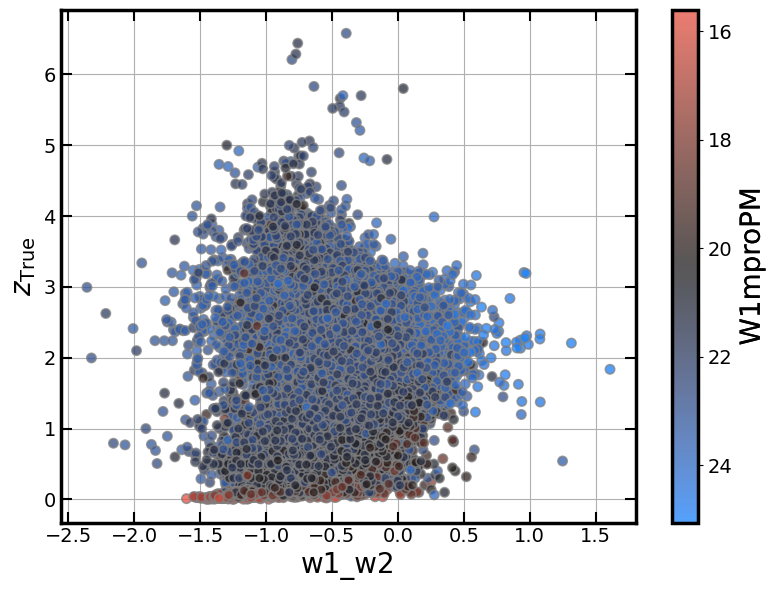

In [209]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

used_col  = 'w1_w2'
color_col = 'W1mproPM'

norm_z = mcolors.Normalize(vmin=corr_data_df.loc[:, color_col].quantile(.0001),\
                           vmax=corr_data_df.loc[:, color_col].quantile(.9999))

sc_p = ax1.scatter(corr_data_df.loc[:, used_col].sample(frac=1, random_state=seed),\
                   corr_data_df.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            c=corr_data_df.loc[:, color_col].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=cc.cm.bkr_r, zorder=10, norm=norm_z)
# ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.ax.invert_yaxis()
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel(color_col, size=20, path_effects=pe2)

ax1.set_xlabel(used_col, fontsize=20)
ax1.set_ylabel('$z_{\mathrm{True}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

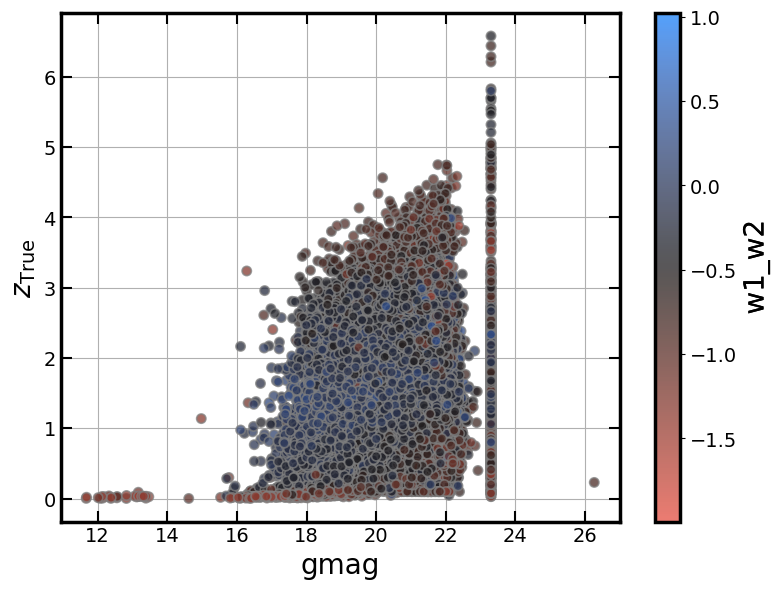

In [210]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

used_col  = 'gmag'
color_col = 'w1_w2'

norm_z = mcolors.Normalize(vmin=corr_data_df.loc[:, color_col].quantile(.0001),\
                           vmax=corr_data_df.loc[:, color_col].quantile(.9999))

sc_p = ax1.scatter(corr_data_df.loc[:, used_col].sample(frac=1, random_state=seed),\
                   corr_data_df.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            c=corr_data_df.loc[:, color_col].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=cc.cm.bkr_r, zorder=10, norm=norm_z)
# ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel(color_col, size=20, path_effects=pe2)

ax1.set_xlabel(used_col, fontsize=20)
ax1.set_ylabel('$z_{\mathrm{True}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

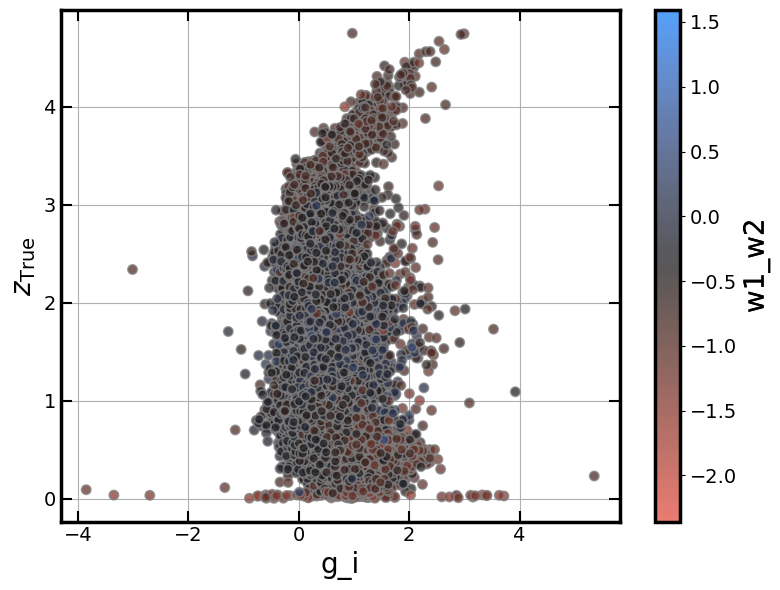

In [211]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

used_col  = 'g_i'
color_col = 'w1_w2'

norm_z = mcolors.Normalize(vmin=corr_data_df.loc[:, color_col].quantile(.000001),\
                           vmax=corr_data_df.loc[:, color_col].quantile(.999999))

sc_p = ax1.scatter(corr_data_df.loc[:, used_col].sample(frac=1, random_state=seed),\
                   corr_data_df.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            c=corr_data_df.loc[:, color_col].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=cc.cm.bkr_r, zorder=10, norm=norm_z)
# ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel(color_col, size=20, path_effects=pe2)

ax1.set_xlabel(used_col, fontsize=20)
ax1.set_ylabel('$z_{\mathrm{True}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

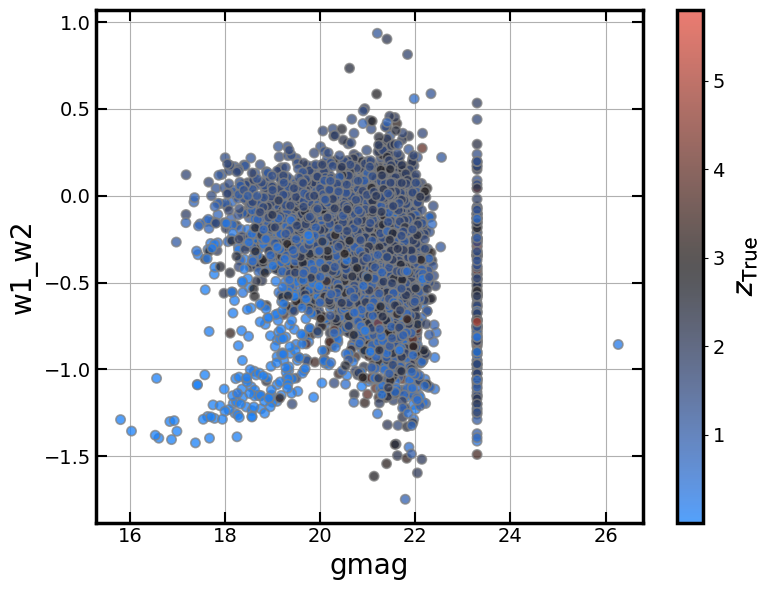

In [212]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

used_col  = 'gmag'
sec_col   = 'w1_w2'

norm_z = mcolors.Normalize(vmin=unseen_predictions.loc[:, 'Z'].min(),\
                           vmax=unseen_predictions.loc[:, 'Z'].max())

sc_p = ax1.scatter(unseen_predictions.loc[:, used_col].sample(frac=1, random_state=seed),\
                   unseen_predictions.loc[:, sec_col].sample(frac=1, random_state=seed),\
            c=unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=cc.cm.bkr, zorder=10, norm=norm_z)
# ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('$z_{\mathrm{True}}$', size=20, path_effects=pe2)

ax1.set_xlabel(used_col, fontsize=20)
ax1.set_ylabel(sec_col, fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
# ax1.set_aspect('equal')
fig.tight_layout()

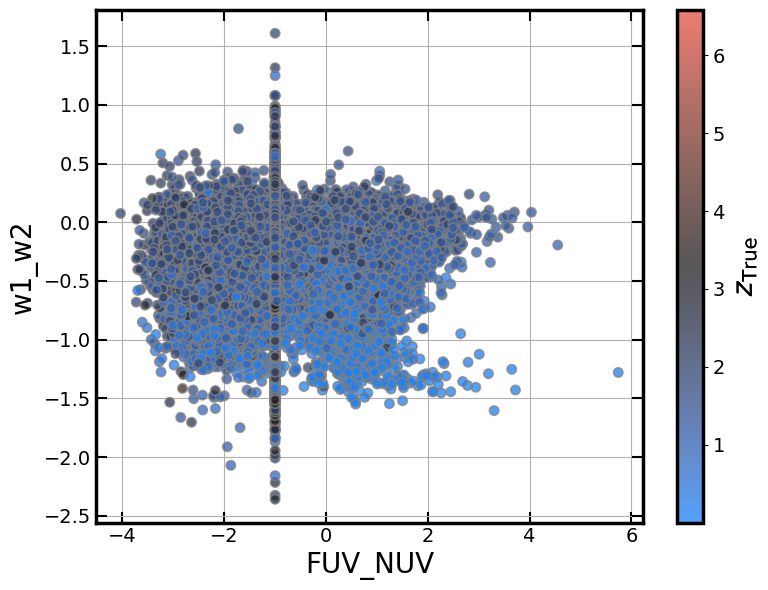

In [213]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

used_col = 'FUV_NUV'
sec_col  = 'w1_w2'

norm_z = mcolors.Normalize(vmin=corr_data_df.loc[:, 'Z'].min(),\
                           vmax=corr_data_df.loc[:, 'Z'].max())

sc_p = ax1.scatter(corr_data_df.loc[:, used_col].sample(frac=1, random_state=seed),\
                   corr_data_df.loc[:, sec_col].sample(frac=1, random_state=seed),\
            c=corr_data_df.loc[:, 'Z'].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=cc.cm.bkr, zorder=10, norm=norm_z)
# ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('$z_{\mathrm{True}}$', size=20, path_effects=pe2)

ax1.set_xlabel(used_col, fontsize=20)
ax1.set_ylabel(sec_col, fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
# ax1.set_aspect('equal', 'datalim')
# ax1.set_aspect('equal')
fig.tight_layout()

Text(0, 0.5, 'Points per pixel')

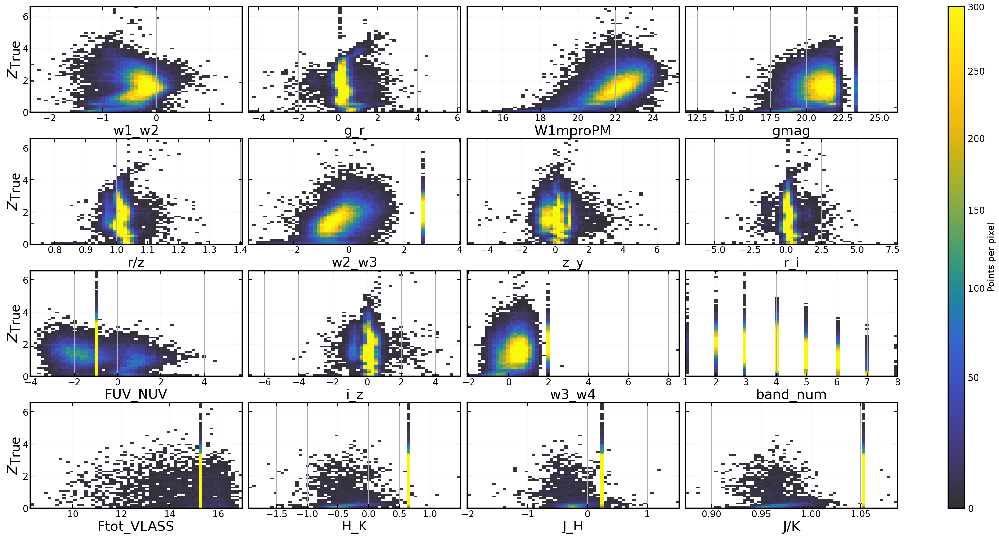

In [312]:
n_cols = 4
n_rows = int(np.ceil((len(unique_cols_imp.index)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=False)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.25, wspace=0.03)
axs             = {}
norm_z = mcolors.Normalize(vmin=corr_data_df.loc[:, 'r_i'].quantile(.0001),\
                           vmax=corr_data_df.loc[:, 'r_i'].quantile(.9999))  # most important feature

norm_n = ImageNormalize(vmin=0, vmax=300, stretch=PowerStretch(0.75))
bin_y  = np.linspace(0, np.nanmax(corr_data_df.loc[:, 'Z']), 60)

for count, used_col in enumerate(unique_cols_imp.index):
    if count == 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    elif count != 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)], sharey=axs[0])
    filter_good_vals = np.isfinite(corr_data_df.loc[:, used_col]) & np.isfinite(corr_data_df.loc[:, 'Z'])
    min_x = np.nanmin(corr_data_df.loc[filter_good_vals, used_col])
    max_x = np.nanmax(corr_data_df.loc[filter_good_vals, used_col])
    bin_x = np.linspace(min_x, max_x, 60)
    _, _, _, hist_sources_lin_z = axs[count].hist2d(corr_data_df.loc[filter_good_vals, used_col], 
                                                    corr_data_df.loc[filter_good_vals, 'Z'], bins=(bin_x, bin_y), 
                                                        cmin=1, cmap='cet_gouldian', norm=norm_n)
    # axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # print(sc_p.colorbar.vmax)
    if count % n_cols == 0:
        axs[count].set_ylabel('$z_{\mathrm{True}}$', fontsize=40)
    axs[count].set_xlabel(used_col, fontsize=30)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=20)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    if 'Flux' in used_col:
        axs[count].set_xscale('log')
    axs[count].grid(zorder=0)
    if count % n_cols != 0:
        plt.setp(axs[count].get_yticklabels(), visible=False)
    # axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
    #                      xycoords='axes fraction', fontsize=18, ha='center', va='top', path_effects=pe2)

clb            = plt.colorbar(cm.ScalarMappable(norm=norm_n,\
                                                cmap=plt.get_cmap('cet_gouldian')),\
                              ax=[axs[key] for key in axs], fraction=.09, aspect=30)
clb.ax.tick_params(labelsize=20)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('Points per pixel', size=20, path_effects=pe2)

# fig.supxlabel('Predicted z', fontsize=30)
# fig.supylabel('True z', fontsize=30)

#fig.tight_layout()

---

Now, the idea is to test how well the models can do with less features.  
What if we remove SDSS photometry? What if we only have WISE measurements? etc...

#### Predict values for Stripe 82.

In [215]:
# s82_predictions = pyr.predict_model(final_stacked, data=norm_stripe82_test_df)
s82_predictions = pyr.predict_model(final_stacked, data=stripe82_test_df)
# unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3564,0.3211,0.5666,0.5203,0.2123,0.4514


In [216]:
prep_pipe   = pyr.get_config('prep_pipe')
transf_s82  = prep_pipe.transform(stripe82_test_df)
transf_seen = prep_pipe.transform(corr_data_df)

In [217]:
s82_predictions[['Z', 'Label']].describe()

,Z,Label
count,20871.000000,20871.000000
mean,1.556291,1.425068
std,0.818158,0.565964
min,0.005000,0.057200
25%,0.970000,1.026475
50%,1.526000,1.462300
75%,2.075000,1.853750
max,6.780000,3.482250


In [218]:
s82_mae   = skmet.mean_absolute_error(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])
s82_mse   = skmet.mean_squared_error(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'], squared=True)
s82_rmse  = skmet.mean_squared_error(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'], squared=False)
s82_R2    = skmet.r2_score(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])
s82_rmsle = np.sqrt(skmet.mean_squared_log_error(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label']))
# s82_mape  = skmet.mean_absolute_percentage_error(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])  # sklearn 0.24
s82_mape  = np.mean(np.abs((s82_predictions.loc[:, 'Z'] - s82_predictions.loc[:, 'Label']) / s82_predictions.loc[:, 'Z']))
s82_z_met = z_score_abs(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [219]:
print('Results from Stripe 82')
print(f'MAE:\t{s82_mae:.4f}')
print(f'MSE:\t{s82_mse:.4f}')
print(f'RMSE:\t{s82_rmse:.4f}')
print(f'R2:\t{s82_R2:.4f}')
print(f'RMSLE:\t{s82_rmsle:.4f}')
print(f'MAPE:\t{s82_mape:.4f}')
print(f'z_met:\t{s82_z_met:.4f}')

Results from Stripe 82
MAE:	0.3564
MSE:	0.3211
RMSE:	0.5666
R2:	0.5203
RMSLE:	0.2123
MAPE:	0.4514
z_met:	0.0829


In [220]:
# Catastrophic outlier fraction
# z_delt = np.abs(((10**unseen_predictions.loc[:, 'Label'] - 1) - unseen_predictions.loc[:, 'Z']) / (1 + unseen_predictions.loc[:, 'Z']))
z_delt_s82 = np.abs((s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']) / (1 + s82_predictions.loc[:, 'Z']))
n_out_s82  = np.array(z_delt_s82 > 0.15)
f_out_s82  = np.sum(n_out_s82) / len(n_out_s82)
print(f'Catastrophic outlier fraction: {f_out_s82:.4f}')

Catastrophic outlier fraction: 0.2932


In [221]:
n_out_hil_s82  = np.array(z_delt_s82 > 0.15)  # Hildebrandt+2010
n_out_heng_s82 = np.array(z_delt_s82 > 0.20)  # Henghes+2021
n_out_bern_def_s82 = np.array((z_delt_s82 * (1 + s82_predictions.loc[:, 'Z'])) > 1.)  # Bernstain&Huteres+2010
f_out_hil_s82  = np.sum(n_out_hil_s82) / len(n_out_hil_s82)
f_out_heng_s82 = np.sum(n_out_heng_s82) / len(n_out_heng_s82)
f_out_bern_def_s82 = np.sum(n_out_bern_def_s82) / len(n_out_bern_def_s82)
n_out_bern_s82 = np.array(np.abs(np.log((1 + s82_predictions.loc[:, 'Label']) / (1 + s82_predictions.loc[:, 'Z']))) > 0.2)
f_out_bern_s82 = np.sum(n_out_bern_s82) / len(n_out_bern_s82)

In [222]:
print(f'Outlier fraction: O(I+06) = {(f_out_hil_s82 * 100):.3f} %')
print(f'Outlier fraction: O(H+21) = {(f_out_heng_s82 * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+10) =  {(f_out_bern_s82 * 100):.3f} %')
print(f'Catastrophic outlier fraction: O(B+20def) = {(f_out_bern_def_s82 * 100):.3f} %')

Outlier fraction: O(I+06) = 29.323 %
Outlier fraction: O(H+21) = 20.660 %
Catastrophic outlier fraction: O(B+10) =  21.566 %
Catastrophic outlier fraction: O(B+20def) = 8.279 %


In [223]:
Bias_s82     = np.nanmean((s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']), axis=0)
Prec_s82     = 1.48 * np.nanmedian(np.abs((s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']) /\
                                      (1 + s82_predictions.loc[:, 'Z'])))
out_frac_s82 = np.sum(np.array(np.abs(s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']) > 0.10)) /\
           len(s82_predictions.loc[:, 'Z'])

In [224]:
print(f'Bias = {Bias_s82:.3f}')
print(f'Precision = {Prec_s82:.3f}')
print(f'Outlier Fraction = {out_frac_s82:.3f}')

Bias = -0.131
Precision = 0.123
Outlier Fraction = 0.702


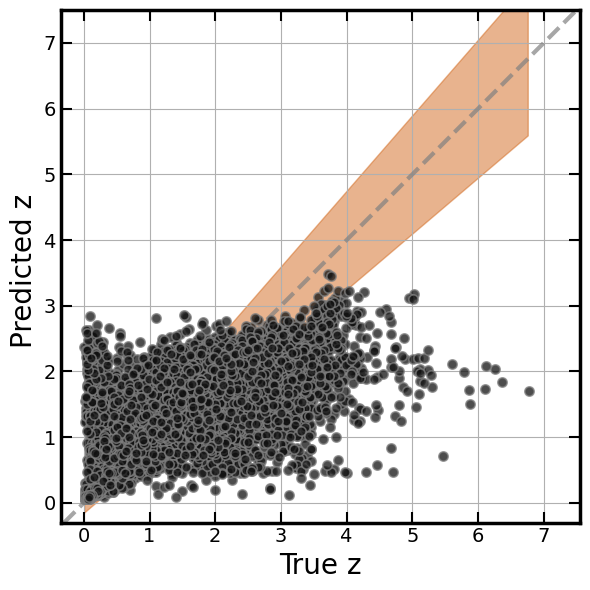

In [225]:
# visualize the embedding
fig             = plt.figure(figsize=(6,6))
ax1             = fig.add_subplot(111)

x_range = np.arange(s82_predictions.loc[:, 'Z'].min(), s82_predictions.loc[:, 'Z'].max(), 0.05)
ax1.scatter(s82_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            s82_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
            c='k', s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10)
ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

pred_limit_h = 1.15 * x_range + 0.15
pred_limit_l = 0.85 * x_range - 0.15
ax1.fill_between(x=x_range, y1=pred_limit_l, y2=pred_limit_h, alpha=0.5, color='chocolate')

ax1.set_xlabel('True z', fontsize=20)
ax1.set_ylabel('Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=7.5)
ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

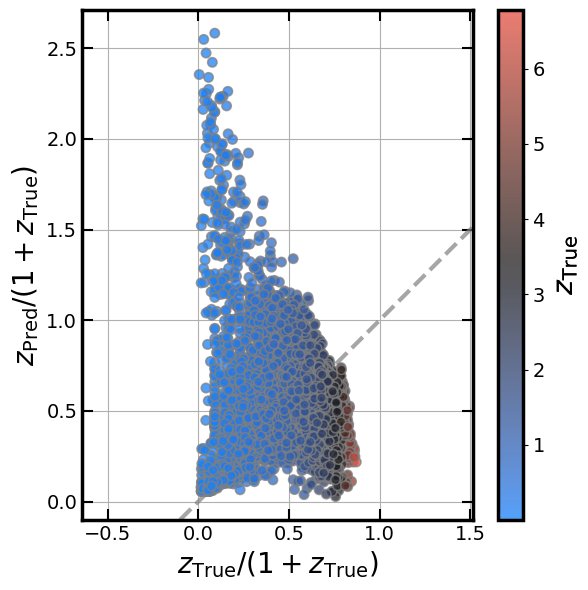

In [226]:
# visualize the embedding
fig             = plt.figure(figsize=(6,6))
ax1             = fig.add_subplot(111)

norm_z = mcolors.Normalize(vmin=s82_predictions.loc[:, 'Z'].min(),\
                           vmax=s82_predictions.loc[:, 'Z'].max())

x_range = np.arange(s82_predictions.loc[:, 'Z'].min(), s82_predictions.loc[:, 'Z'].max(), 0.05)
x_vals  = s82_predictions.loc[:, 'Z'] / (1 + s82_predictions.loc[:, 'Z'])
y_vals  = s82_predictions.loc[:, 'Label'] / (1 + s82_predictions.loc[:, 'Z'])
sc_p = ax1.scatter(x_vals.sample(frac=1, random_state=seed),\
            y_vals.sample(frac=1, random_state=seed),\
            c=s82_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
                   s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10, norm=norm_z, cmap=cc.cm.bkr)
ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

pred_limit_h = 1.15 * x_range + 0.15
pred_limit_l = 0.85 * x_range - 0.15
# ax1.fill_between(x=x_range, y1=pred_limit_l, y2=pred_limit_h, alpha=0.5, color='chocolate')

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('$z_{\mathrm{True}}$', size=20, path_effects=pe2)

ax1.set_xlabel('$z_{\mathrm{True}} / (1 + z_{\mathrm{True}})$', fontsize=20)
ax1.set_ylabel('$z_{\mathrm{Pred}} / (1 + z_{\mathrm{True}})$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

Each panel shows the sources with the same number of available bands.

Text(0.5, 0.01, 'True z')

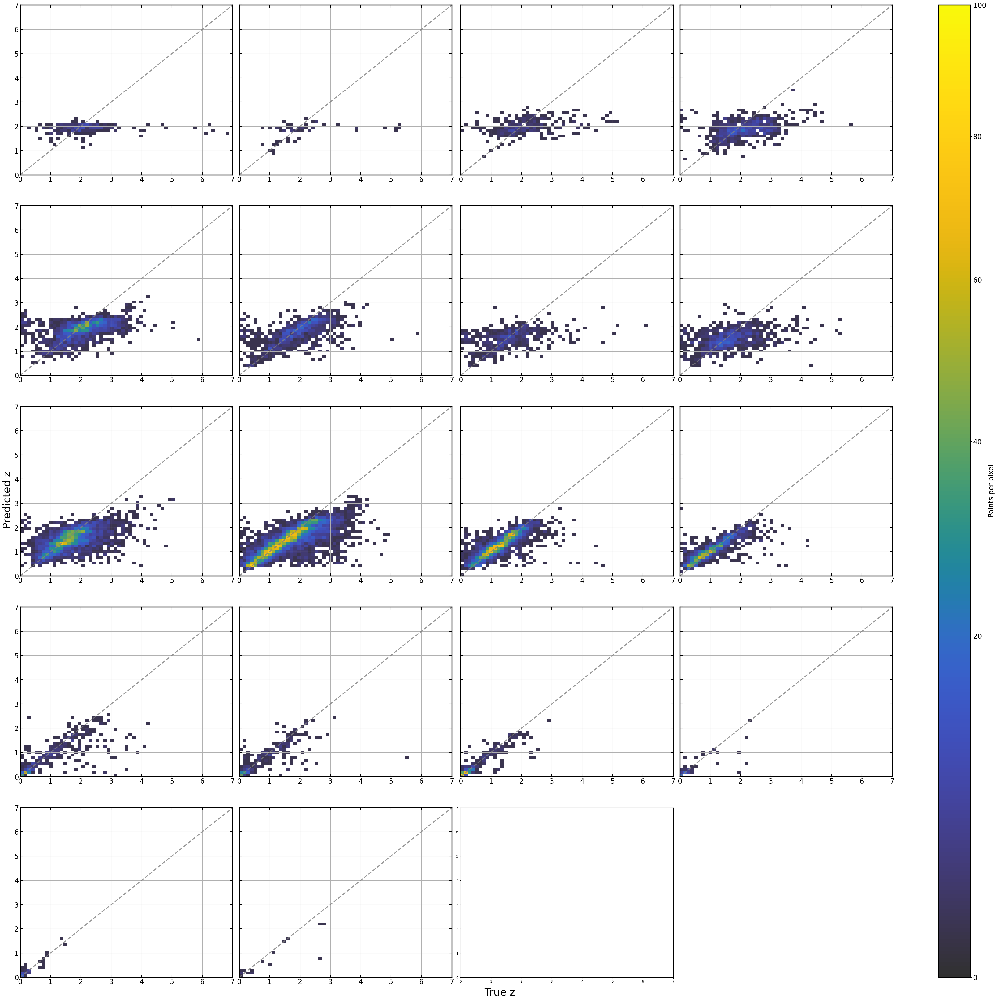

In [311]:
n_cols = 4
# n_rows = int(np.ceil((len(unique_cols_imp.index)) / 4))
n_rows = 5

fig             = plt.figure(figsize=(10 * n_cols, 8 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.1, wspace=0.0)
axs             = {}
norm_z = mcolors.Normalize(vmin=stripe82_test_df.loc[:, 'r_i'].quantile(.0001),\
                           vmax=stripe82_test_df.loc[:, 'r_i'].quantile(.9999))  # most important feature

norm_n = ImageNormalize(vmin=0, vmax=100, stretch=PowerStretch(0.65))

for count in np.arange(0, 19):
    if count == 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
        axs[count].set_xlim((0, 7))
        axs[count].set_ylim((0, 7))
    elif count != 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)],\
                                     sharey=axs[0], sharex=axs[0])
    filter_bands = np.array(s82_predictions.loc[:, 'band_num'] == (count + 2))
    filter_x_inf = np.isfinite(s82_predictions.loc[:, 'Z']) & np.array(s82_predictions.loc[:, 'Z'] > 0)
    filter_y_inf = np.isfinite(s82_predictions.loc[:, 'Label'])
    if np.sum(filter_bands & filter_x_inf) != 0:
        x_data = s82_predictions.loc[filter_bands & filter_x_inf, 'Z']
        y_data = s82_predictions.loc[filter_bands & filter_x_inf, 'Label']
        bin_space = np.linspace(0, 7, 60)
        _, _, _, hist_sources_lin_z = axs[count].hist2d(x_data, y_data, bins=(bin_space, bin_space), 
                                                        cmin=1, cmap='cet_gouldian', norm=norm_n)
        axs[count].axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.8, lw=3.0)
        # axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
        # if np.ceil(count / n_rows) == n_cols:
        #     axs[count].set_xlabel('True z', fontsize=22)
        # print(sc_p.colorbar.vmax)
        # if count % n_cols == 0:
        #     axs[count].set_ylabel('Predicted z', fontsize=40)
        # axs[count].set_xlabel(used_col, fontsize=30)
        axs[count].tick_params(which='both', top=True, right=True, direction='in')
        axs[count].tick_params(axis='both', which='major', labelsize=20)
        axs[count].tick_params(which='major', length=8, width=1.5)
        axs[count].tick_params(which='minor', length=4, width=1.5)
        plt.setp(axs[count].spines.values(), linewidth=2.5)
        plt.setp(axs[count].spines.values(), linewidth=2.5)
        axs[count].grid(zorder=0)
        if count % n_cols != 0:
            plt.setp(axs[count].get_yticklabels(), visible=False)
        # axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
        #                      xycoords='axes fraction', fontsize=18, ha='center', va='top', path_effects=pe2)

clb            = plt.colorbar(cm.ScalarMappable(norm=norm_n, cmap=plt.get_cmap('cet_gouldian')),
                              ax=[axs[key] for key in axs], fraction=.09, aspect=30)
clb.ax.tick_params(labelsize=20)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('Points per pixel', size=20, path_effects=pe2)

axs[0].set_xlim((0, 7))
axs[0].set_ylim((0, 7))

fig.supylabel('Predicted z', fontsize=30)
fig.supxlabel('True z', fontsize=30)

#fig.tight_layout()

Colour sources by the number of available bands.

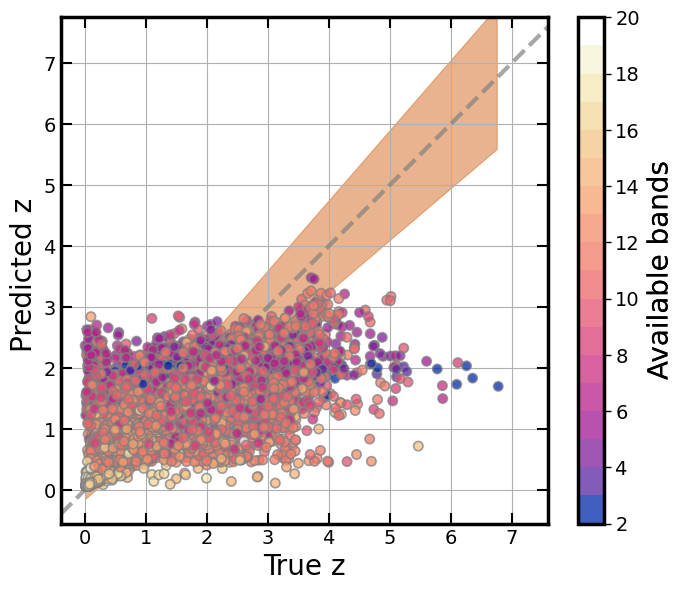

In [328]:
# visualize the embedding
fig             = plt.figure(figsize=(7,6))
ax1             = fig.add_subplot(111)

norm_band = mcolors.Normalize(vmin=2, vmax=20)

x_range = np.arange(s82_predictions.loc[:, 'Z'].min(), s82_predictions.loc[:, 'Z'].max(), 0.05)
scp_band = ax1.scatter(s82_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
            s82_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
            c=s82_predictions.loc[:, 'band_num'].sample(frac=1, random_state=seed),\
            s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10,\
                       cmap=plt.get_cmap('cet_linear_worb_100_25_c53_r', 18), norm=norm_band)  # cet_linear_worb_100_25_c53_r
ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)

pred_limit_h = 1.15 * x_range + 0.15
pred_limit_l = 0.85 * x_range - 0.15
ax1.fill_between(x=x_range, y1=pred_limit_l, y2=pred_limit_h, alpha=0.5, color='chocolate')

clb = plt.colorbar(scp_band)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('Available bands', size=20, path_effects=pe2)

ax1.set_xlabel('True z', fontsize=20)
ax1.set_ylabel('Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=7.5)
ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

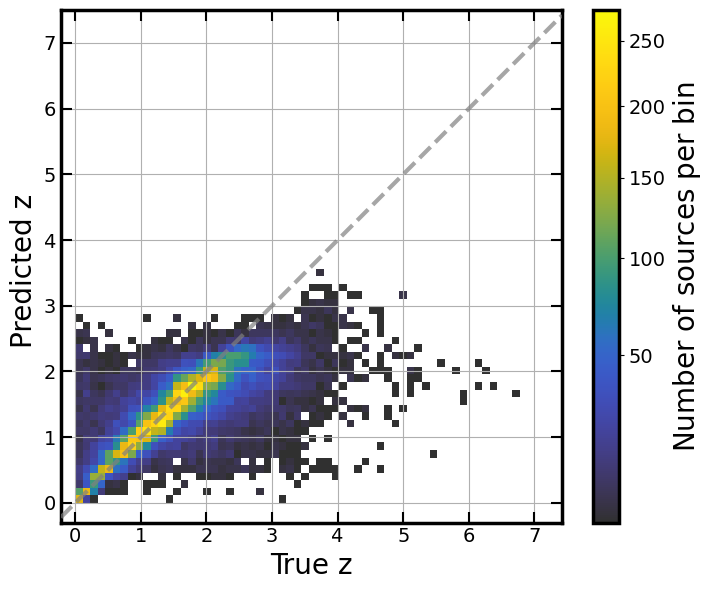

In [310]:
# visualize the embedding
fig             = plt.figure(figsize=(7.3,6))
ax1             = fig.add_subplot(111)

filter_good_vals = np.isfinite(s82_predictions.loc[:, 'Z']) & np.isfinite(s82_predictions.loc[:, 'Label'])
max_z = np.nanmax([s82_predictions.loc[filter_good_vals, 'Z'], 
                                s82_predictions.loc[filter_good_vals, 'Label']])
bin_space = np.linspace(0, max_z, 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))  
_, _, _, hist_sources_lin_z = ax1.hist2d(s82_predictions.loc[filter_good_vals, 'Z'],
                                   s82_predictions.loc[filter_good_vals, 'Label'],
                                   bins=(bin_space, bin_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)

cbar = fig.colorbar(hist_sources_lin_z, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

ax1.set_xlabel('True z', fontsize=20)
ax1.set_ylabel('Predicted z ', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=7.5)
ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

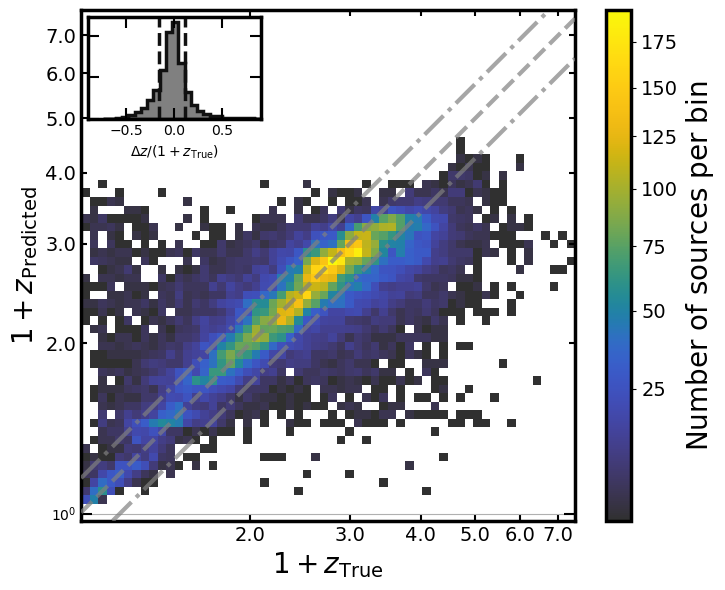

In [309]:
# visualize the embedding
fig             = plt.figure(figsize=(7.4,6))
ax1             = fig.add_subplot(111, xscale='log', yscale='log')

filter_good_vals = np.isfinite(1 + s82_predictions.loc[:, 'Z']) & np.isfinite(1 + s82_predictions.loc[:, 'Label'])
min_log_z = np.log10(np.nanmin([1 + s82_predictions.loc[filter_good_vals, 'Z'], 
                                1 + s82_predictions.loc[filter_good_vals, 'Label']]))
max_log_z = np.log10(np.nanmax([1 + s82_predictions.loc[filter_good_vals, 'Z'], 
                                1 + s82_predictions.loc[filter_good_vals, 'Label']]))
bin_space = np.logspace(min_log_z, max_log_z, 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))
_, _, _, hist_sources_log_z = ax1.hist2d(1+ s82_predictions.loc[filter_good_vals, 'Z'],
                                   1 + s82_predictions.loc[filter_good_vals, 'Label'],
                                   bins=(bin_space, bin_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

ax1.axline((2., 2.), (3., 3.), ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 1.15), xy2=(2., 2.3), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 0.85), xy2=(2., 1.7), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)

cbar = fig.colorbar(hist_sources_log_z, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

######
axins = inset_axes(ax1, width='35%', height='20%', loc=2)
res_z_z = (s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']) / (1 + s82_predictions.loc[:, 'Z'])
axins.hist(res_z_z, histtype='stepfilled', fc='grey', ec='k', bins=50, lw=2.5)

axins.axvline(x=np.percentile(res_z_z, [15.9]), ls='--', lw=2.5, c='k')
axins.axvline(x=np.percentile(res_z_z, [84.1]), ls='--', lw=2.5, c='k')

axins.set_xlabel('$\Delta z / (1 + z_{\mathrm{True}})$', fontsize=10)
# axins.set_ylabel('Frequency', fontsize=20)
axins.tick_params(labelleft=False, labelbottom=True)
axins.tick_params(which='both', top=True, right=True, direction='in')
axins.tick_params(axis='both', which='major', labelsize=10)
axins.tick_params(which='major', length=8, width=1.5)
axins.tick_params(which='minor', length=4, width=1.5)
plt.setp(axins.spines.values(), linewidth=2.5)
plt.setp(axins.spines.values(), linewidth=2.5)
# ax1.grid(zorder=-10)
axins.set_xlim(left=-0.9, right=0.9)
# axins.figure.set_facecolor('b')
######

ax1.set_xlabel('$1 + z_{\mathrm{True}}$', fontsize=20)
ax1.set_ylabel('$1 + z_{\mathrm{Predicted}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='minor', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.xaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
ax1.yaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=7.5)
ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

In [231]:
s82_predictions.columns

Index(['Z', 'W1mproPM', 'Ftot_VLASS', 'gmag', 'z_y', 'w1_w2', 'w2_w3', 'w3_w4',
       'J_H', 'H_K', 'FUV_NUV', 'g_r', 'r_i', 'i_z', 'r/z', 'J/K', 'band_num',
       'zsp', 'zph', 'Label'],
      dtype='object')

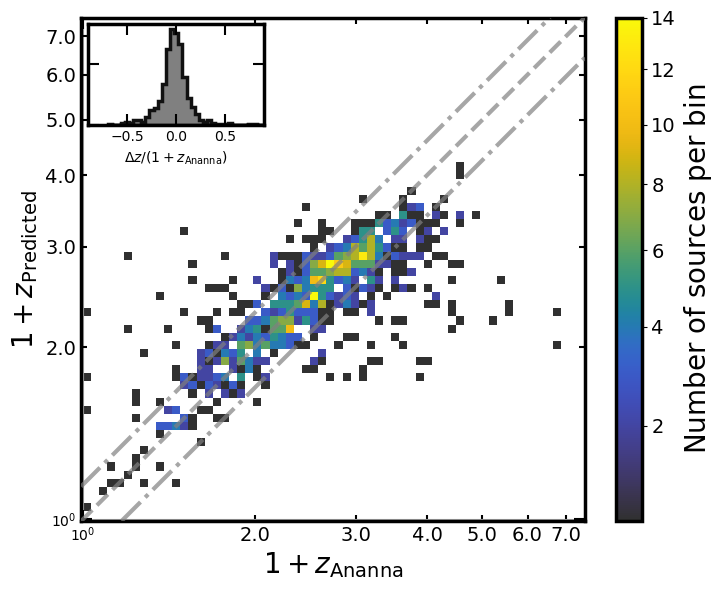

In [308]:
# visualize the embedding
fig             = plt.figure(figsize=(7.4,6))
ax1             = fig.add_subplot(111, xscale='log', yscale='log')
# ax1.scatter(unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
#             unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
#             c='k', s=45, ec='Gray', alpha=0.75, lw=1.2, zorder=10)

#norm = ImageNormalize(vmin=0., vmax=11, stretch=LogStretch())
#
#dens_1 = ax1.scatter_density((1 + s82_predictions.loc[:, 'zsp'].sample(frac=1, random_state=seed)),\
#            (1 + s82_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed)),\
#            cmap=plt.get_cmap('pink_r'), zorder=10, dpi=25, norm=norm, alpha=0.93)
## ax1.axline((.1, .1), slope=1, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
#ax1.axline((2., 2.), (3., 3.), ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
#ax1.axline(xy1=(1., 1.15), xy2=(2., 2.3), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
#ax1.axline(xy1=(1., 0.85), xy2=(2., 1.7), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
#
#clb = plt.colorbar(dens_1)
#clb.ax.tick_params(labelsize=11)
#clb.outline.set_linewidth(2.5)
#clb.ax.set_ylabel('Points per pixel', size=16, path_effects=pe2)

filter_good_vals = np.isfinite(1 + s82_predictions.loc[:, 'zsp']) & np.isfinite(1 + s82_predictions.loc[:, 'Label'])
min_log_z = np.log10(np.nanmin([1 + s82_predictions.loc[filter_good_vals, 'zsp'], 
                                1 + s82_predictions.loc[filter_good_vals, 'Label']]))
max_log_z = np.log10(np.nanmax([1 + s82_predictions.loc[filter_good_vals, 'zsp'], 
                                1 + s82_predictions.loc[filter_good_vals, 'Label']]))
bin_space = np.logspace(min_log_z, max_log_z, 60)
norm_sources  = ImageNormalize(stretch=PowerStretch(0.65))
_, _, _, hist_sources_log_z = ax1.hist2d(1+ s82_predictions.loc[filter_good_vals, 'zsp'],
                                   1 + s82_predictions.loc[filter_good_vals, 'Label'],
                                   bins=(bin_space, bin_space), cmin=1, cmap='cet_gouldian', norm=norm_sources)

ax1.axline((2., 2.), (3., 3.), ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 1.15), xy2=(2., 2.3), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)
ax1.axline(xy1=(1., 0.85), xy2=(2., 1.7), ls='-.', marker=None, c='Gray', alpha=0.7, lw=3.0, zorder=20)

cbar = fig.colorbar(hist_sources_log_z, ax=ax1)
cbar.ax.tick_params(labelsize=14)
cbar.outline.set_linewidth(2.5)
cbar.ax.set_ylabel(r'$\mathrm{Number ~ of ~ sources ~ per ~ bin}$', size=20)

######
axins = inset_axes(ax1, width='35%', height='20%', loc=2)
res_z_z = (s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'zsp']) / (1 + s82_predictions.loc[:, 'zsp'])
axins.hist(res_z_z, histtype='stepfilled', fc='grey', ec='k', bins=50, lw=2.5)

axins.axvline(x=np.percentile(res_z_z, [15.9]), ls='--', lw=2.5, c='k')
axins.axvline(x=np.percentile(res_z_z, [84.1]), ls='--', lw=2.5, c='k')

axins.set_xlabel('$\Delta z / (1 + z_{\mathrm{Ananna}})$', fontsize=10)
# axins.set_ylabel('Frequency', fontsize=20)
axins.tick_params(labelleft=False, labelbottom=True)
axins.tick_params(which='both', top=True, right=True, direction='in')
axins.tick_params(axis='both', which='major', labelsize=10)
axins.tick_params(which='major', length=8, width=1.5)
axins.tick_params(which='minor', length=4, width=1.5)
plt.setp(axins.spines.values(), linewidth=2.5)
plt.setp(axins.spines.values(), linewidth=2.5)
# ax1.grid(zorder=-10)
axins.set_xlim(left=-0.9, right=0.9)
# axins.figure.set_facecolor('b')
######

ax1.set_xlabel('$1 + z_{\mathrm{Ananna}}$', fontsize=20)
ax1.set_ylabel('$1 + z_{\mathrm{Predicted}}$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='minor', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
ax1.xaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
ax1.yaxis.set_minor_formatter(ticker.ScalarFormatter(useMathText=False))
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.set_xlim(left=-0.3, right=7.5)
ax1.set_ylim(bottom=-0.3, top=7.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

Compare values distributions for features.

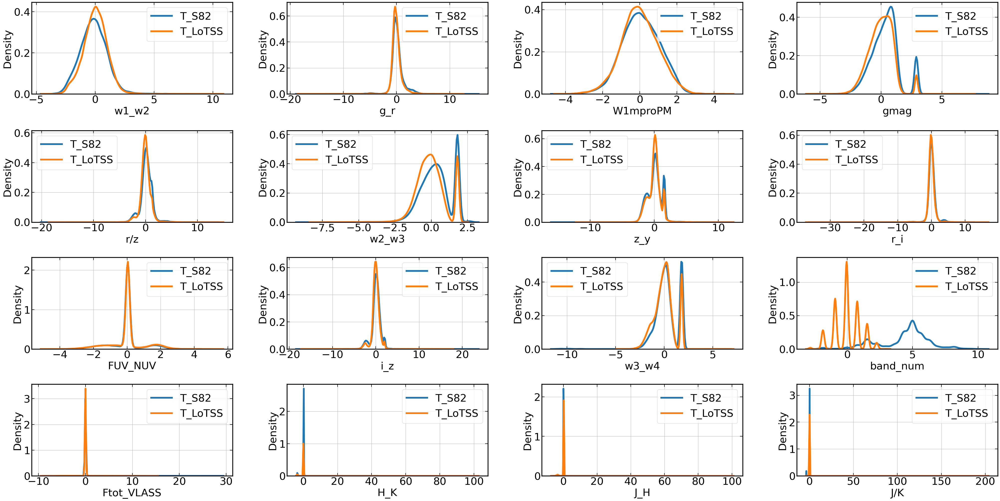

In [233]:
n_cols = 4
n_rows = int(np.ceil((len(sub_cols_shap_importance.index)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.1, wspace=0.1)
axs             = {}

# boxprops_a = dict(linestyle='--', linewidth=3, color='darkgoldenrod')
boxprops_a = dict(linewidth=4)
boxprops_b = dict(linewidth=4)

for count, used_col in enumerate(unique_cols_imp.index):
    axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # if count == 0:
    #     axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # elif count != 0:
    #     axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    # print(used_cols)
    # print(new_band)
    # used_col_clean = used_col
    # if used_col.endswith('_0') or used_col.endswith('_1'):
    #     used_col_clean = used_col[:-2]
    # sc_p_a = sns.kdeplot(s82_predictions.loc[:, used_col], ax=axs[count], label='S82', common_norm=True, cumulative=False, lw=5)
    # sc_p_b = sns.kdeplot(corr_data_df.loc[:, used_col], ax=axs[count], label='LoTSS', common_norm=True, cumulative=False, lw=5)
    if used_col == 'radio_detect':
        used_col = 'radio_detect_0'
    sc_p_c = sns.kdeplot(transf_s82.loc[:, used_col], ax=axs[count], label='T_S82', common_norm=True, cumulative=False, lw=5)
    sc_p_d = sns.kdeplot(transf_seen.loc[:, used_col], ax=axs[count], label='T_LoTSS', common_norm=True, cumulative=False, lw=5)
    # sc_p_c = sns.kdeplot(stripe82_test_df.loc[:, used_col], ax=axs[count], label='T_S82', common_norm=True, cumulative=False, lw=5)
    # sc_p_d = sns.kdeplot(corr_data_df.loc[:, used_col], ax=axs[count], label='T_LoTSS', common_norm=True, cumulative=False, lw=5)
    # axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # if count % n_cols == 0:
    axs[count].set_xlabel(used_col, fontsize=30)
    axs[count].set_ylabel('Density', fontsize=30)
    # axs[count].set_xlabel(used_col, fontsize=30)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=30)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5, labelsize=20)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    # if 'Flux' in used_col:
    #     axs[count].set_yscale('log')
    # axs[count].set_yscale('log')
    axs[count].grid(zorder=0)
    axs[count].legend(fontsize=30)
    # if count % n_cols != 0:
    #     plt.setp(axs[count].get_yticklabels(), visible=False)
    # axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
    #                      xycoords='axes fraction', fontsize=18, ha='center', va='top', path_effects=pe2)

# fig.supxlabel('Predicted z', fontsize=30)
# fig.supylabel('True z', fontsize=30)

#fig.tight_layout()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.8775,1.2145,1.1020,-0.8144,0.4415,0.8508


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,1.0119,1.5919,1.2617,-1.3782,0.5401,0.7395


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.9967,1.5008,1.2251,-1.2422,0.5221,0.8638


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.8144,1.0494,1.0244,-0.5678,0.4228,1.6157


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.5504,0.5298,0.7279,0.2085,0.3018,1.0424


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.5018,0.4465,0.6682,0.3330,0.2739,0.8835


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4721,0.4096,0.6400,0.3881,0.2619,0.8601


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4607,0.3987,0.6315,0.4043,0.2559,0.8166


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4422,0.3818,0.6179,0.4296,0.2449,0.7225


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4430,0.3685,0.6071,0.4494,0.2509,0.7934


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4321,0.3555,0.5962,0.4689,0.2448,0.7497


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.4378,0.3606,0.6005,0.4612,0.2479,0.7691


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3958,0.3300,0.5744,0.5070,0.2255,0.5877


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3685,0.3158,0.5620,0.5282,0.2135,0.5016


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3603,0.3110,0.5577,0.5354,0.2124,0.4848


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3576,0.3115,0.5582,0.5346,0.2111,0.4801


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.3564,0.3211,0.5666,0.5203,0.2123,0.4514


Text(0.02, 0.5, '$(z_{\\mathrm{Pred}} - z_{\\mathrm{True}}) / (1 + z_{\\mathrm{True}})$')

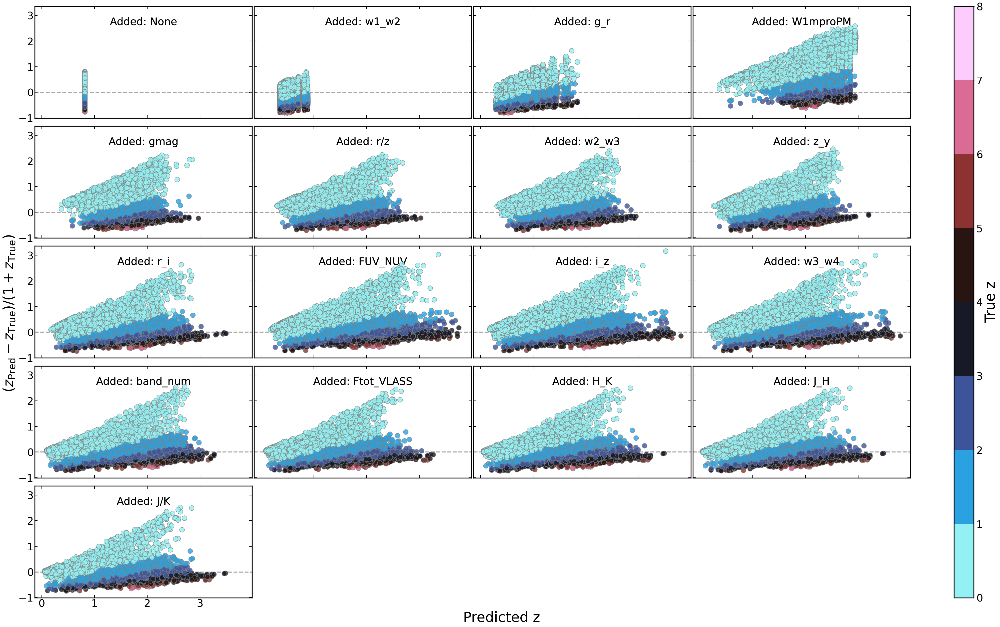

In [234]:
n_cols = 4
n_rows = int(np.ceil((len(unique_cols_str)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.0, wspace=0.0)
axs             = {}
norm_z = mcolors.Normalize(vmin=0, vmax=8)

for count in range(len(unique_cols_str)):
    if count == 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    elif count != 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)], sharex=axs[0], sharey=axs[0])
    used_cols  = unique_cols_imp.index[count:]
    # print(used_cols)
    # print(new_band)
    tmp_data_norm_unseen    = stripe82_test_df.copy()
    tmp_data_norm_unseen.loc[:, used_cols] = np.nan
    tmp_unseen_predictions  = pyr.predict_model(final_stacked, data=tmp_data_norm_unseen)
    res_z_z         = (tmp_unseen_predictions.loc[:, 'Label'] - tmp_unseen_predictions.loc[:, 'Z']) /\
                    (1 + tmp_unseen_predictions.loc[:, 'Z'])
    sc_p = axs[count].scatter(tmp_unseen_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed),\
                       res_z_z.sample(frac=1, random_state=seed),\
                       c=tmp_unseen_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed),\
                       s=200, ec='Gray', alpha=0.8, lw=1.2, cmap=plt.get_cmap('cmr.redshift', 8), norm=norm_z, zorder=10)
    axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # if count % n_cols == 0:
    #     axs[count].set_ylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=22)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=30)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    ax1.grid(zorder=0)
    if count % n_cols != 0:
        plt.setp(axs[count].get_yticklabels(), visible=False)
    if np.ceil((count + 1) / n_cols) != n_rows:
        plt.setp(axs[count].get_xticklabels(), visible=False)
    axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
                         xycoords='axes fraction', fontsize=30, ha='center', va='top', path_effects=pe2)

clb            = plt.colorbar(cm.ScalarMappable(norm=norm_z,\
                                                cmap=cm.get_cmap('cmr.redshift', 8)),\
                              ax=[axs[key] for key in axs], fraction=.09, aspect=30)
clb.ax.tick_params(labelsize=30)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=40, path_effects=pe2)

fig.supxlabel('Predicted z', fontsize=40)
fig.supylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=40)

#fig.tight_layout()

Text(0, 0.5, 'Points per pixel')

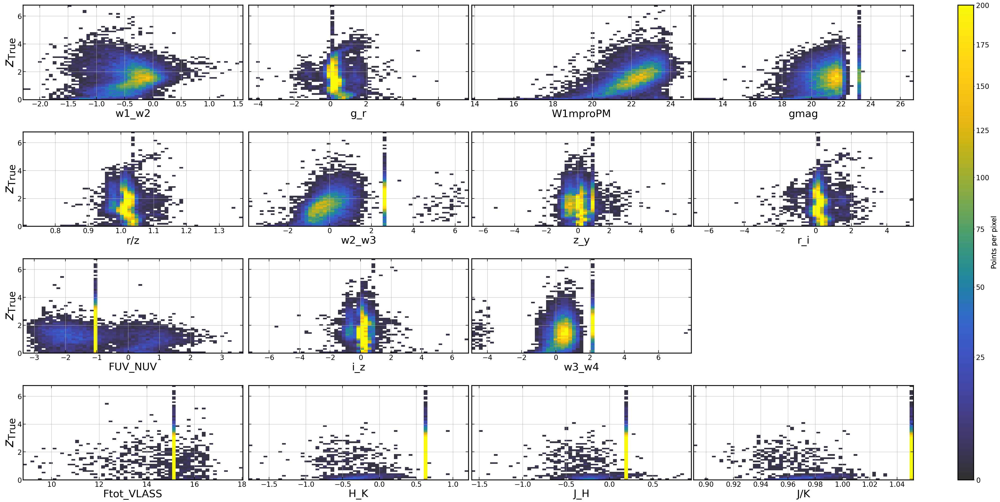

In [307]:
n_cols = 4
n_rows = int(np.ceil((len(unique_cols_imp.index)) / 4))

fig             = plt.figure(figsize=(10 * n_cols, 5 * n_rows), constrained_layout=True)

grid            = fig.add_gridspec(ncols=n_cols, nrows=n_rows, width_ratios=[1]*n_cols,\
                                   height_ratios=[1]*n_rows, hspace=0.1, wspace=0.0)
axs             = {}
norm_z = mcolors.Normalize(vmin=stripe82_test_df.loc[:, 'r_i'].quantile(.0001),\
                           vmax=stripe82_test_df.loc[:, 'r_i'].quantile(.9999))  # most important feature

norm_n = ImageNormalize(vmin=0, vmax=200, stretch=PowerStretch(0.65))
bin_y  = np.linspace(0, np.nanmax(stripe82_test_df.loc[:, 'Z']), 60)

for count, used_col in enumerate(unique_cols_imp.index):
    if used_col == 'band_num': continue
    if count == 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)])
    elif count != 0:
        axs[count] = fig.add_subplot(grid[int(np.floor(count / n_cols)), int(count % n_cols)], sharey=axs[0])
    # print(used_cols)
    # print(new_band)
    # sc_p = axs[count].scatter(corr_data_df.loc[:, used_col].sample(frac=1, random_state=seed),\
    #                    corr_data_df.loc[:, 'Z'].sample(frac=1, random_state=seed),\
    #                    c=corr_data_df.loc[:, 'col_r_i_corr'].sample(frac=1, random_state=seed),\
    #                    s=200, ec='Gray', alpha=0.8, lw=2.2, cmap=cc.cm.CET_CBL2, norm=norm_z,\
    #                           zorder=10, plotnonfinite=True)
    #sc_p = axs[count].scatter_density(stripe82_test_df.loc[:, used_col].sample(frac=1, random_state=seed),\
    #                   stripe82_test_df.loc[:, 'Z'].sample(frac=1, random_state=seed),\
    #                   cmap=plt.get_cmap('pink_r'), dpi=15, norm=norm_n)
    filter_good_vals = np.isfinite(stripe82_test_df.loc[:, used_col]) & np.isfinite(stripe82_test_df.loc[:, 'Z'])
    min_x = np.nanmin(stripe82_test_df.loc[filter_good_vals, used_col])
    max_x = np.nanmax(stripe82_test_df.loc[filter_good_vals, used_col])
    bin_x = np.linspace(min_x, max_x, 60)
    _, _, _, hist_sources_lin_z = axs[count].hist2d(stripe82_test_df.loc[filter_good_vals, used_col], 
                                                    stripe82_test_df.loc[filter_good_vals, 'Z'], bins=(bin_x, bin_y), 
                                                        cmin=1, cmap='cet_gouldian', norm=norm_n)
    # axs[count].axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
    # if np.ceil(count / n_rows) == n_cols:
    #     axs[count].set_xlabel('Predicted z', fontsize=22)
    # print(sc_p.colorbar.vmax)
    if count % n_cols == 0:
        axs[count].set_ylabel('$z_{\mathrm{True}}$', fontsize=40)
    axs[count].set_xlabel(used_col, fontsize=30)
    axs[count].tick_params(which='both', top=True, right=True, direction='in')
    axs[count].tick_params(axis='both', which='major', labelsize=20)
    axs[count].tick_params(which='major', length=8, width=1.5)
    axs[count].tick_params(which='minor', length=4, width=1.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    plt.setp(axs[count].spines.values(), linewidth=2.5)
    if 'Flux' in used_col:
        axs[count].set_xscale('log')
    axs[count].grid(zorder=0)
    if count % n_cols != 0:
        plt.setp(axs[count].get_yticklabels(), visible=False)
    # axs[count].annotate(text=f'Added: {unique_cols_str[count]}', xy=(0.5, 0.9),\
    #                      xycoords='axes fraction', fontsize=18, ha='center', va='top', path_effects=pe2)

clb            = plt.colorbar(cm.ScalarMappable(norm=norm_n,\
                                                cmap=plt.get_cmap('cet_gouldian')),\
                              ax=[axs[key] for key in axs], fraction=.09, aspect=30)
clb.ax.tick_params(labelsize=20)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('Points per pixel', size=20, path_effects=pe2)

# fig.supxlabel('Predicted z', fontsize=30)
# fig.supylabel('True z', fontsize=30)

#fig.tight_layout()

Overdensities show imputed values.

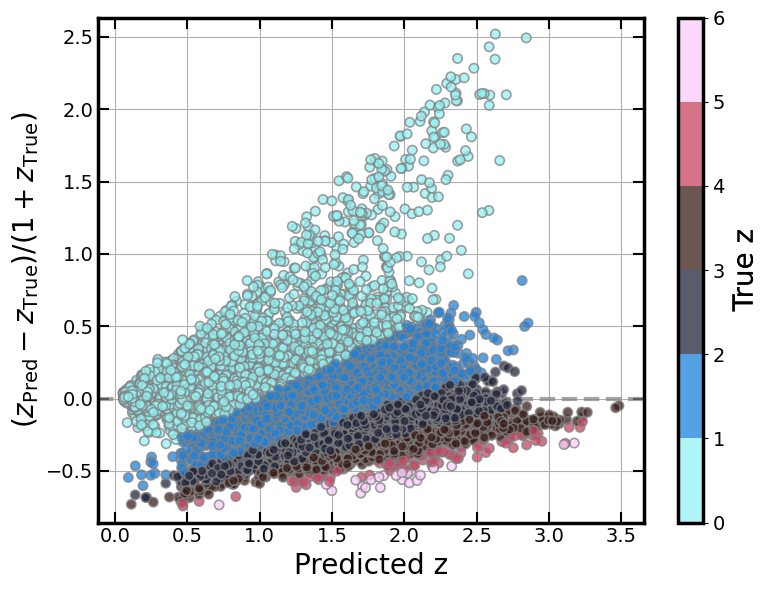

In [236]:
# visualize the embedding
fig             = plt.figure(figsize=(8,6))
ax1             = fig.add_subplot(111)

norm_z = mcolors.Normalize(vmin=0, vmax=6)
x_range = np.arange(s82_predictions.loc[:, 'Label'].min(), s82_predictions.loc[:, 'Label'].max(), 0.05)

res_z_z         = (s82_predictions.loc[:, 'Label'] - s82_predictions.loc[:, 'Z']) / (1 + s82_predictions.loc[:, 'Z'])
sc_p = ax1.scatter(s82_predictions.loc[:, 'Label'].sample(frac=1, random_state=seed), res_z_z.sample(frac=1, random_state=seed),\
            c=s82_predictions.loc[:, 'Z'].sample(frac=1, random_state=seed), s=45, ec='Gray', alpha=0.75, lw=1.2,\
            cmap=plt.get_cmap('cmr.redshift', 6), zorder=10, norm=norm_z)
ax1.axhline(y=0, ls='--', marker=None, c='Gray', alpha=0.7, lw=3.0)
# ax1.fill_between(x=x_range, y1=-0.15, y2=0.15, alpha=0.5, color='chocolate')

clb             = plt.colorbar(sc_p)
clb.ax.tick_params(labelsize=14)
clb.outline.set_linewidth(2.5)
clb.ax.set_ylabel('True z', size=20, path_effects=pe2)

ax1.set_xlabel('Predicted z', fontsize=20)
ax1.set_ylabel('$(z_{\mathrm{Pred}} - z_{\mathrm{True}}) / (1 + z_{\mathrm{True}})$', fontsize=20)
ax1.tick_params(which='both', top=True, right=True, direction='in')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(which='major', length=8, width=1.5)
ax1.tick_params(which='minor', length=4, width=1.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
plt.setp(ax1.spines.values(), linewidth=2.5)
ax1.grid(zorder=0)
# ax1.set_xlim(left=-0.3, right=7.5)
# ax1.set_ylim(bottom=-0.3, top=7.5)
# ax1.set_xlim(left=min_full_eddr, right=max_full_eddr)
# ax1.set_aspect('equal', 'box')
ax1.set_aspect('equal', 'datalim')
fig.tight_layout()

Calculate new metrics for all sub-sets

In [237]:
# Train
X_train      = corr_data_df.iloc[pyr.get_config('X_train').index]
z_true_train = corr_data_df.iloc[pyr.get_config('y_train').index]
z_pred_train = pyr.predict_model(final_stacked, data=X_train)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.1423,0.0554,0.2355,0.9038,0.0921,0.1520


In [238]:
# Test
X_test      = corr_data_df.iloc[pyr.get_config('X_test').index]
z_true_test = corr_data_df.iloc[pyr.get_config('y_test').index]
z_pred_test = pyr.predict_model(final_stacked, data=X_test)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.1422,0.0524,0.2289,0.9089,0.0904,0.1500


In [239]:
sigma_mad_train = sigma_mad(z_pred_train.loc[:, 'Z'], z_pred_train.loc[:, 'Label'])
sigma_mad_test  = sigma_mad(z_pred_test.loc[:, 'Z'], z_pred_test.loc[:, 'Label'])
sigma_mad_valid = sigma_mad(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
sigma_mad_s82   = sigma_mad(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [289]:
sigma_nmad_train = sigma_nmad(z_pred_train.loc[:, 'Z'], z_pred_train.loc[:, 'Label'])
sigma_nmad_test  = sigma_nmad(z_pred_test.loc[:, 'Z'], z_pred_test.loc[:, 'Label'])
sigma_nmad_valid = sigma_nmad(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
sigma_nmad_s82   = sigma_nmad(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [290]:
sigma_z_train = sigma_z(z_pred_train.loc[:, 'Z'], z_pred_train.loc[:, 'Label'])
sigma_z_test  = sigma_z(z_pred_test.loc[:, 'Z'], z_pred_test.loc[:, 'Label'])
sigma_z_valid = sigma_z(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
sigma_z_s82   = sigma_z(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [291]:
sigma_z_norm_train = sigma_z_norm(z_pred_train.loc[:, 'Z'], z_pred_train.loc[:, 'Label'])
sigma_z_norm_test  = sigma_z_norm(z_pred_test.loc[:, 'Z'], z_pred_test.loc[:, 'Label'])
sigma_z_norm_valid = sigma_z_norm(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
sigma_z_norm_s82   = sigma_z_norm(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [292]:
print('Sigma mad')
print(f'Train:\t\t{sigma_mad_train:.4f}')
print(f'Test:\t\t{sigma_mad_test:.4f}')
print(f'Validation:\t{sigma_mad_valid:.4f}')
print(f'Stripe 82:\t{sigma_mad_s82:.4f}')

Sigma mad
Train:		0.1226
Test:		0.1228
Validation:	0.2118
Stripe 82:	0.2917


In [293]:
print('Sigma nmad')
print(f'Train:\t\t{sigma_nmad_train:.4f}')
print(f'Test:\t\t{sigma_nmad_test:.4f}')
print(f'Validation:\t{sigma_nmad_valid:.4f}')
print(f'Stripe 82:\t{sigma_nmad_s82:.4f}')

Sigma nmad
Train:		0.0500
Test:		0.0501
Validation:	0.0846
Stripe 82:	0.1226


In [294]:
print('Sigma z')
print(f'Train:\t\t{sigma_z_train:.4f}')
print(f'Test:\t\t{sigma_z_test:.4f}')
print(f'Validation:\t{sigma_z_valid:.4f}')
print(f'Stripe 82:\t{sigma_z_s82:.4f}')

Sigma z
Train:		0.2355
Test:		0.2289
Validation:	0.3996
Stripe 82:	0.5666


In [295]:
print('Sigma z norm')
print(f'Train:\t\t{sigma_z_norm_train:.4f}')
print(f'Test:\t\t{sigma_z_norm_test:.4f}')
print(f'Validation:\t{sigma_z_norm_valid:.4f}')
print(f'Stripe 82:\t{sigma_z_norm_s82:.4f}')

Sigma z norm
Train:		0.0997
Test:		0.0970
Validation:	0.1663
Stripe 82:	0.2344


Outlier fraction

In [296]:
out_frac_train = outlier_frac(z_pred_train.loc[:, 'Z'], z_pred_train.loc[:, 'Label'])
out_frac_test  = outlier_frac(z_pred_test.loc[:, 'Z'], z_pred_test.loc[:, 'Label'])
out_frac_valid = outlier_frac(unseen_predictions.loc[:, 'Z'], unseen_predictions.loc[:, 'Label'])
out_frac_s82   = outlier_frac(s82_predictions.loc[:, 'Z'], s82_predictions.loc[:, 'Label'])

In [297]:
print('Outlier Fraction')
print(f'Train:\t\t{out_frac_train:.4f}')
print(f'Test:\t\t{out_frac_test:.4f}')
print(f'Validation:\t{out_frac_valid:.4f}')
print(f'Stripe 82:\t{out_frac_s82:.4f}')

Outlier Fraction
Train:		0.0800
Test:		0.0815
Validation:	0.1882
Stripe 82:	0.2932


Compare equal sources in Stripe 82 with Ananna

In [298]:
filt_ananna = np.array(s82_predictions.loc[:, 'zsp'] > 0)

In [299]:
sigma_mad_s82_ananna    = sigma_mad(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_nmad_s82_ananna   = sigma_nmad(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_z_s82_ananna      = sigma_z(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_z_norm_s82_ananna = sigma_z_norm(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'Label'])
out_frac_s82_ananna     = outlier_frac(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'Label'])

In [300]:
print('Compare Ananna and this work')
print(f'sigma_mad:\t{sigma_mad_s82_ananna:.4f}')
print(f'sigma_nmad:\t{sigma_nmad_s82_ananna:.4f}')
print(f'sigma_z:\t{sigma_z_s82_ananna:.4f}')
print(f'sigma_z_norm:\t{sigma_z_norm_s82_ananna:.4f}')
print(f'out_frac:\t{out_frac_s82_ananna:.4f}')

Compare Ananna and this work
sigma_mad:	0.2523
sigma_nmad:	0.1063
sigma_z:	0.5288
sigma_z_norm:	0.1694
out_frac:	0.2264


Compare sources from Ananna

In [301]:
sigma_mad_s82_ana    = sigma_mad(s82_predictions.loc[filt_ananna, 'Z'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_nmad_s82_ana   = sigma_nmad(s82_predictions.loc[filt_ananna, 'Z'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_z_s82_ana      = sigma_z(s82_predictions.loc[filt_ananna, 'Z'], s82_predictions.loc[filt_ananna, 'Label'])
sigma_z_norm_s82_ana = sigma_z_norm(s82_predictions.loc[filt_ananna, 'Z'], s82_predictions.loc[filt_ananna, 'Label'])
out_frac_s82_ana     = outlier_frac(s82_predictions.loc[filt_ananna, 'Z'], s82_predictions.loc[filt_ananna, 'Label'])

In [302]:
print('Use only sources from Ananna in Stripe 82')
print(f'sigma_mad:\t{sigma_mad_s82_ana:.4f}')
print(f'sigma_nmad:\t{sigma_nmad_s82_ana:.4f}')
print(f'sigma_z:\t{sigma_z_s82_ana:.4f}')
print(f'sigma_z_norm:\t{sigma_z_norm_s82_ana:.4f}')
print(f'out_frac:\t{out_frac_s82_ana:.4f}')

Use only sources from Ananna in Stripe 82
sigma_mad:	0.2505
sigma_nmad:	0.1055
sigma_z:	0.4509
sigma_z_norm:	0.1662
out_frac:	0.2183


Compare Ananna with Ananna (cross-match with our sample)

In [303]:
sigma_mad_ana_ana    = sigma_mad(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'zph'])
sigma_nmad_ana_ana   = sigma_nmad(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'zph'])
sigma_z_ana_ana      = sigma_z(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'zph'])
sigma_z_norm_ana_ana = sigma_z_norm(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'zph'])
out_frac_ana_ana     = outlier_frac(s82_predictions.loc[filt_ananna, 'zsp'], s82_predictions.loc[filt_ananna, 'zph'])

In [304]:
print('Use only sources from Ananna in Stripe 82 zps/zph')
print(f'sigma_mad:\t{sigma_mad_ana_ana:.4f}')
print(f'sigma_nmad:\t{sigma_nmad_ana_ana:.4f}')
print(f'sigma_z:\t{sigma_z_ana_ana:.4f}')
print(f'sigma_z_norm:\t{sigma_z_norm_ana_ana:.4f}')
print(f'out_frac:\t{out_frac_ana_ana:.4f}')

Use only sources from Ananna in Stripe 82 zps/zph
sigma_mad:	nan
sigma_nmad:	nan
sigma_z:	0.2295
sigma_z_norm:	0.0768
out_frac:	0.3939
